In [1]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import pickle
import cv2
import os
import glob
import time
from helperfunctions import *
from svmclassifier import *

In [2]:
# Read training data 
# Car
cars_files    = glob.glob('C://big/p5/vehicles/**/*.png', recursive=True)
# Not Car
notcars_files = glob.glob('C://big/p5/non-vehicles/**/*.png', recursive=True)

# store filenames in cars,notcars
cars=[]
notcars=[]
# search through readed data 
# read every third image to split time-series of images
for n in range(len(cars_files)):
    if n % 3 == 0:
        cars.append(cars_files[n])
#print(cars)

# Do the same for non-car data
for n in range(len(notcars_files)):
    if n % 3 == 0:
        notcars.append(notcars_files[n])
        
print('Cars size is: ',np.shape(cars))
print('Not-Cars size is: ',np.shape(notcars))

Cars size is:  (2931,)
Not-Cars size is:  (2990,)


In [3]:
# Testing functions above - pickle_extracted_features()
cspace ='YCrCb'
orient = 9
pix_per_cell = 4
cell_per_block = 2 
hog_channel = 'ALL'

# Extract the features, then save a pickle file
fname = 'X_scaler_scaled_X_y.p'
if os.path.isfile(fname) == False:
    print('Already Extracted, got my pickle')
    pass
else:
    pickle_extracted_features('X_scaler_scaled_X_y.p',cars,notcars,cspace,orient,
                          pix_per_cell,cell_per_block,hog_channel)

# Test training_with_SVM()
training_with_SVM('X_scaler_scaled_X_y.p')

pickle ext cspace is  YCrCb
extract feat cspace is YCrCb


C:\Anaconda3\envs\tensorflow-gpu\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


extract feat cspace is YCrCb
 Seconds to extract features:  64.06
The input was: cspace = YCrCb, orient = 9,    pix_per_cell = 4, cell_per_block = 2
Extracted features are stored in pickled file:X_scaler_scaled_X_y.p
3.78 Seconds to train SVC
Test Accuracy of SVC =  0.9887
Model saved as [ svc.pickle ] file
My SVC predictions: 
 [ 1.  1.  0.  1.  1.  1.  0.  0.  0.  1.]
For  10 labels: 
 [ 1.  1.  0.  1.  1.  1.  0.  0.  0.  1.]


In [4]:
cars[1]

'C://big/p5/vehicles\\GTI_Far\\image0003.png'

mean of img is:  117.350178675
converted to YC
find cars cspace is  YCrCb


C:\Anaconda3\envs\tensorflow-gpu\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


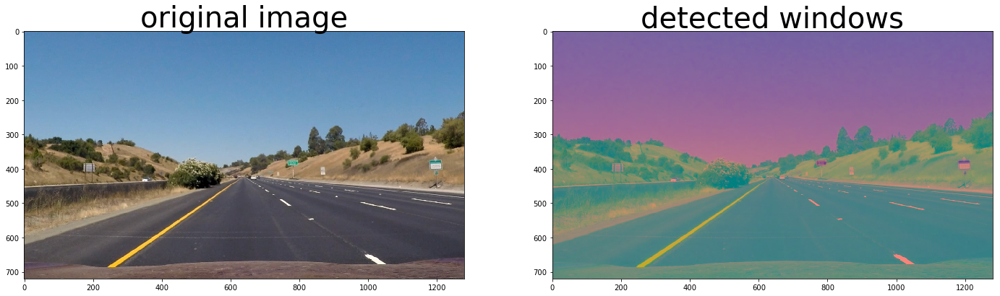

mean of img is:  107.373849826
converted to YC
find cars cspace is  YCrCb


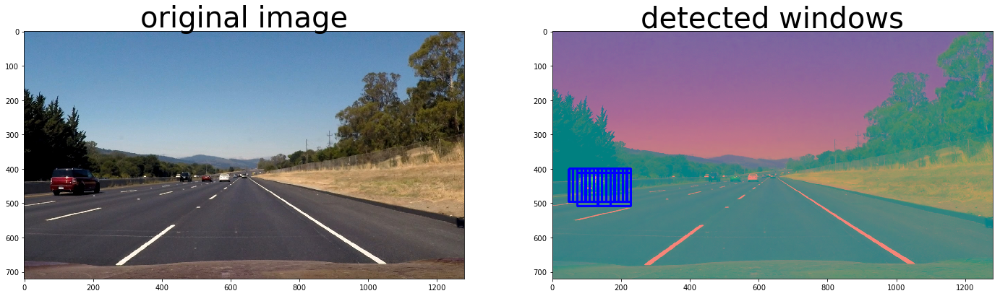

mean of img is:  127.244626736
converted to YC
find cars cspace is  YCrCb


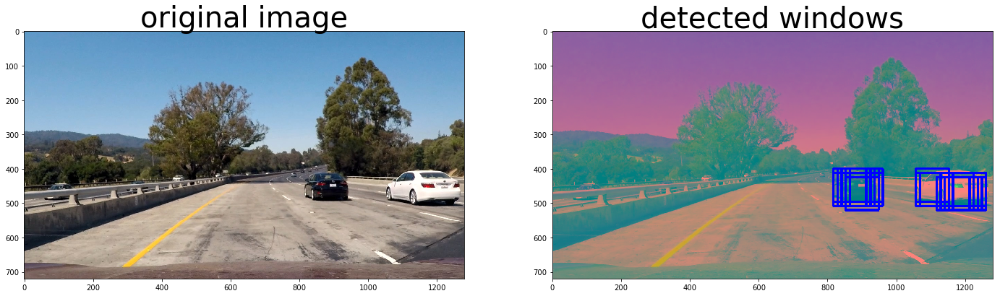

mean of img is:  114.273209635
converted to YC
find cars cspace is  YCrCb


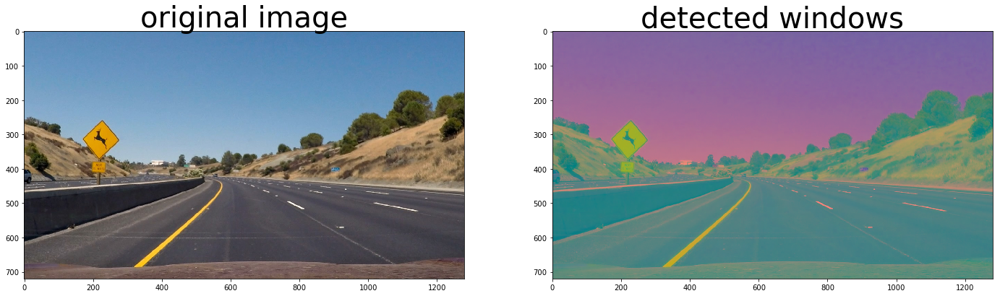

mean of img is:  115.685383753
converted to YC
find cars cspace is  YCrCb


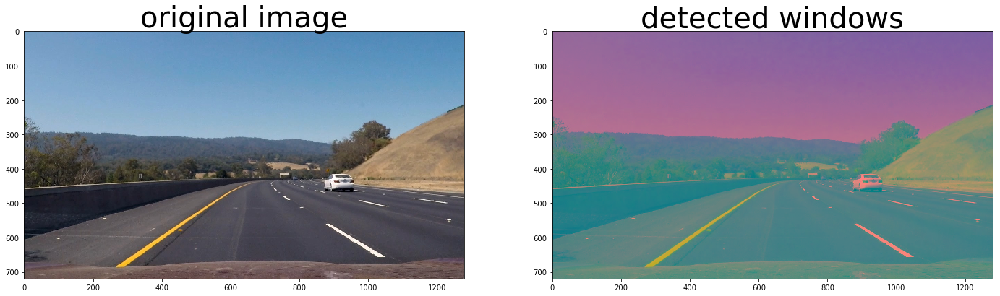

mean of img is:  121.923516348
converted to YC
find cars cspace is  YCrCb


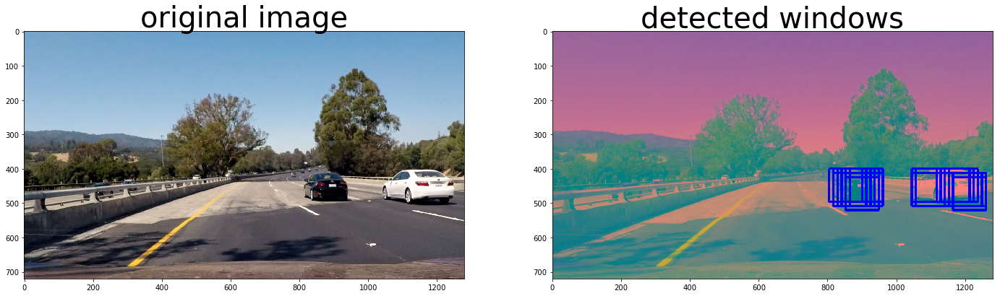

mean of img is:  89.1842570891
converted to YC
find cars cspace is  YCrCb


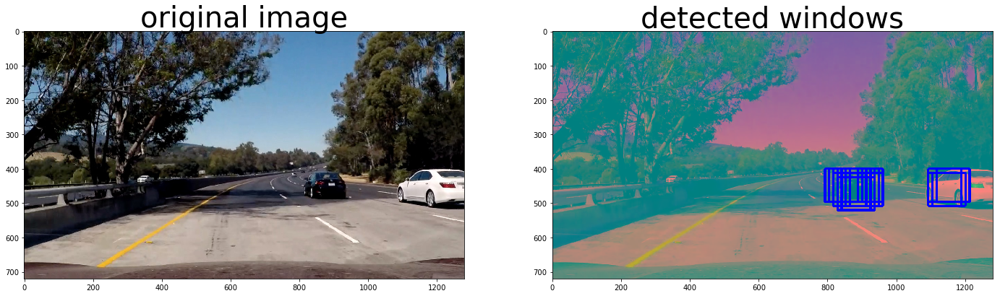

mean of img is:  102.510925564
converted to YC
find cars cspace is  YCrCb


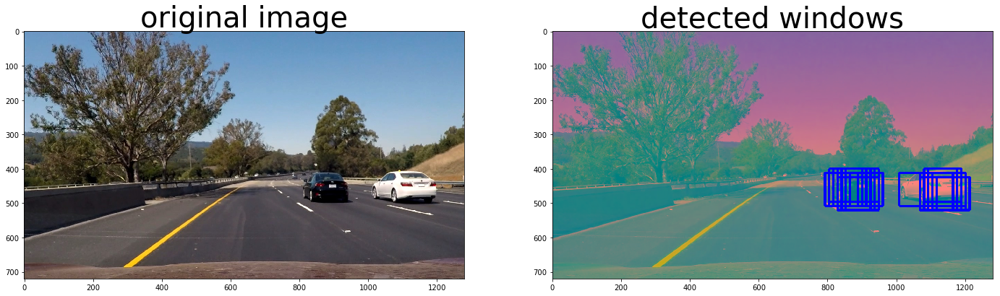

done
[((792, 412), (888, 508)), ((804, 400), (900, 496)), ((804, 412), (900, 508)), ((816, 400), (912, 496)), ((816, 412), (912, 508)), ((828, 400), (924, 496)), ((828, 412), (924, 508)), ((828, 424), (924, 520)), ((840, 400), (936, 496)), ((840, 412), (936, 508)), ((840, 424), (936, 520)), ((852, 400), (948, 496)), ((852, 412), (948, 508)), ((852, 424), (948, 520)), ((864, 412), (960, 508)), ((1008, 412), (1104, 508)), ((1068, 412), (1164, 508)), ((1068, 424), (1164, 520)), ((1080, 400), (1176, 496)), ((1080, 412), (1176, 508)), ((1080, 424), (1176, 520)), ((1092, 400), (1188, 496)), ((1092, 412), (1188, 508)), ((1092, 424), (1188, 520)), ((1104, 412), (1200, 508)), ((1104, 424), (1200, 520)), ((1116, 424), (1212, 520))]


In [5]:
# Pull in test Image
image = mpimg.imread('media/test_images/test3.jpg')

# Load the data and trained model weights
scaled_data = pickle.load(open(fname,'rb'))
svc = pickle.load(open('svc.pickle','rb'))    
X_scaler = scaled_data["X_scaler"]

ystart = 400
ystop = 700
scale = 1.5

input_directory = 'media/test_images/'
files = os.listdir(input_directory)
for file in files:
    filename,ext = os.path.splitext(file)
    if ext == '.jpg':
        image = mpimg.imread(input_directory + file)    

        win,img = find_cars(image, ystart, ystop, scale, svc, X_scaler,cspace, orient, 
                            pix_per_cell, cell_per_block)

    f,(ax1,ax2) = plt.subplots(1,2,figsize=(24,9))
    ax1.imshow(image)
    ax1.set_title('original image', fontsize=40)
    ax2.imshow(img)
    ax2.set_title('detected windows', fontsize=40)
    plt.show()
print("done")
print(win)



In [6]:
# test function above - find_cars
image = mpimg.imread('media/test_images/test3.jpg')

y_half = image.shape[0] // 2
y_end = image.shape[0] #- (y_half % 64)
ystart = [y_half,y_half+100]
ystop = [y_end-100, y_end]
scale = [1.2,2.5]
#ystart = [400]
#ystop = [700]
#scale = [1.5]
point_scale_data = np.vstack((ystart,ystop,scale))
print(point_scale_data)
windows = search_with_multiscale_windows(image, cspace, orient, pix_per_cell, cell_per_block, 
                                         point_scale_data)


print(windows)
print(len(windows))

[[ 360.   460. ]
 [ 620.   720. ]
 [   1.2    2.5]]
search_with_multiscale cspace is  YCrCb
mean of img is:  115.685383753
converted to YC
find cars cspace is  YCrCb


C:\Anaconda3\envs\tensorflow-gpu\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


mean of img is:  115.685383753
converted to YC
find cars cspace is  YCrCb
[((873, 408), (949, 484)), ((883, 398), (959, 474)), ((883, 408), (959, 484)), ((883, 417), (959, 493)), ((892, 408), (968, 484))]
5


search_with_multiscale cspace is  YCrCb
mean of img is:  117.350178675
converted to YC
find cars cspace is  YCrCb


C:\Anaconda3\envs\tensorflow-gpu\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


mean of img is:  117.350178675
converted to YC
find cars cspace is  YCrCb
No windows found


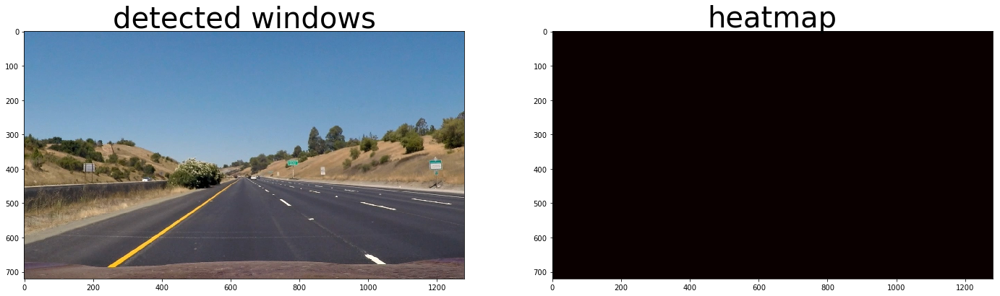

search_with_multiscale cspace is  YCrCb
mean of img is:  107.373849826
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.373849826
converted to YC
find cars cspace is  YCrCb


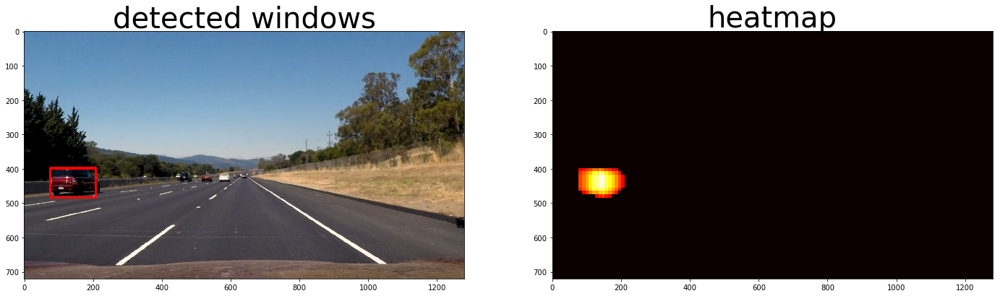

search_with_multiscale cspace is  YCrCb
mean of img is:  127.244626736
converted to YC
find cars cspace is  YCrCb
mean of img is:  127.244626736
converted to YC
find cars cspace is  YCrCb


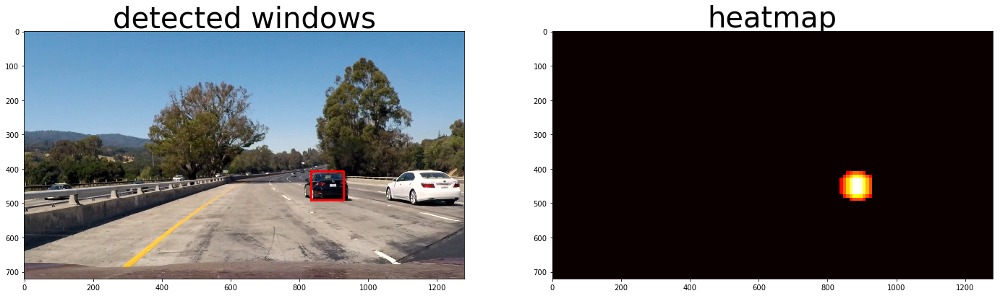

search_with_multiscale cspace is  YCrCb
mean of img is:  114.273209635
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.273209635
converted to YC
find cars cspace is  YCrCb
No windows found


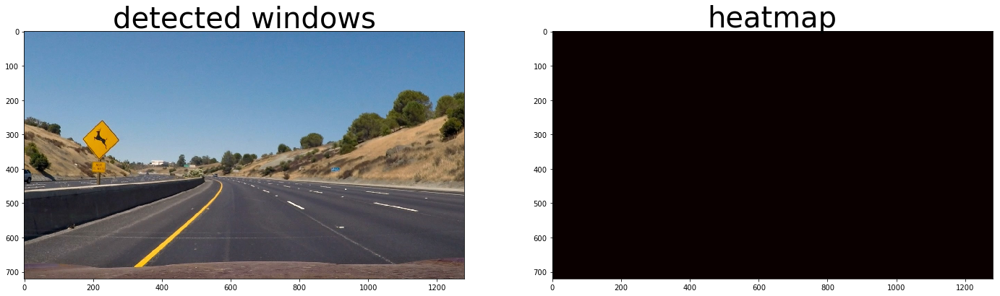

search_with_multiscale cspace is  YCrCb
mean of img is:  115.685383753
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.685383753
converted to YC
find cars cspace is  YCrCb


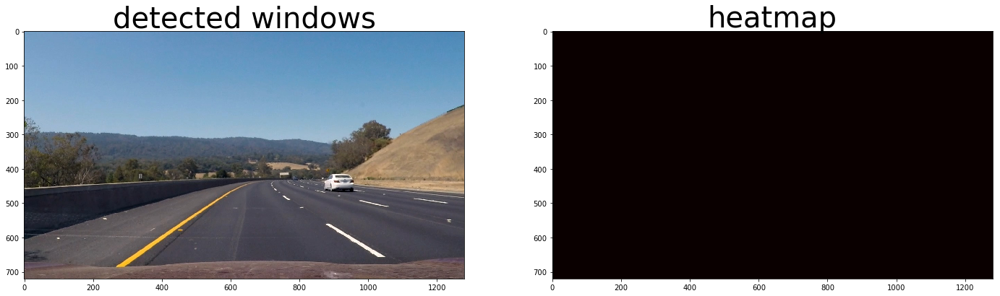

search_with_multiscale cspace is  YCrCb
mean of img is:  121.923516348
converted to YC
find cars cspace is  YCrCb
mean of img is:  121.923516348
converted to YC
find cars cspace is  YCrCb


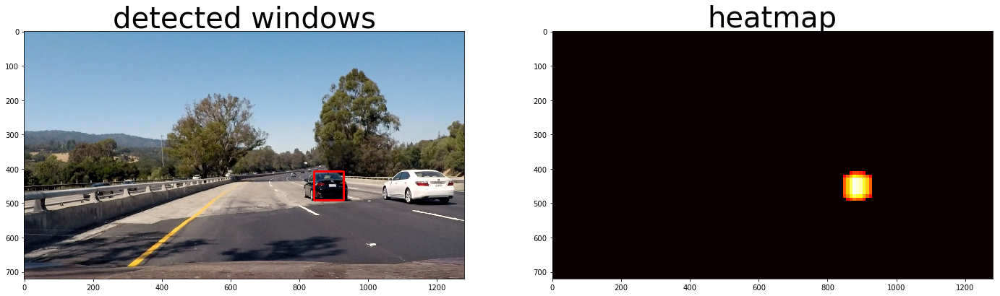

search_with_multiscale cspace is  YCrCb
mean of img is:  89.1842570891
converted to YC
find cars cspace is  YCrCb
mean of img is:  89.1842570891
converted to YC
find cars cspace is  YCrCb


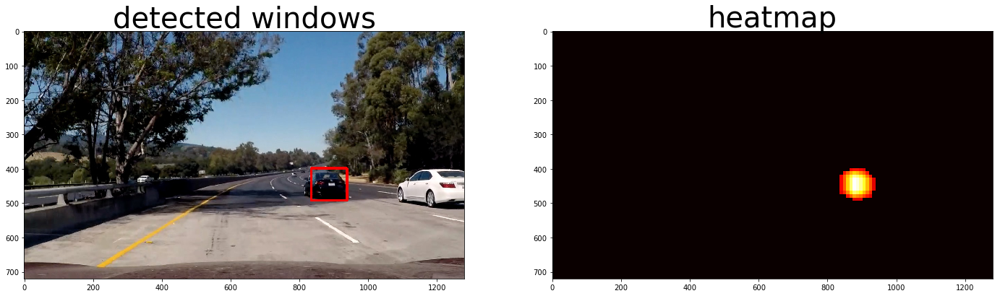

search_with_multiscale cspace is  YCrCb
mean of img is:  102.510925564
converted to YC
find cars cspace is  YCrCb
mean of img is:  102.510925564
converted to YC
find cars cspace is  YCrCb


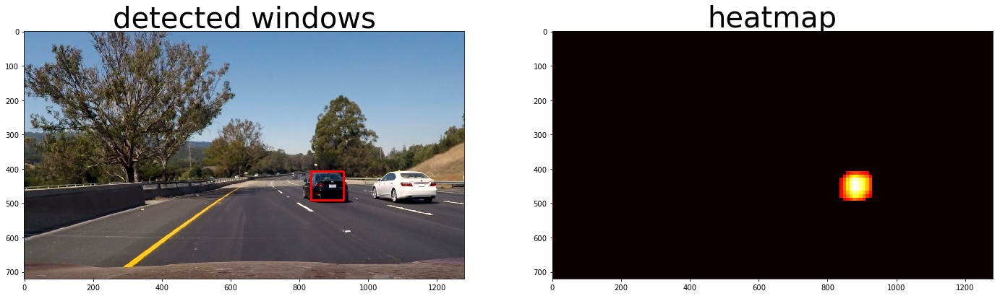

done


In [7]:
def draw_labeled_windows(img, labels):
    # Iterate through all detected cars
    for car_num in range(1, labels[1]+1):
        # Find pixels with each car_num label value
        nonzero = (labels[0] == car_num).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        win = ((np.min(nonzerox),np.min(nonzeroy)),(np.max(nonzerox),np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, win[0], win[1], (255,0,0), 6)

    # Return image
    return img


def test_image(image,cspace,orient,pix_per_cell,cell_per_block,point_scale_data):
    img = np.copy(image)
    windows = search_with_multiscale_windows(image, cspace, orient, pix_per_cell, 
                                             cell_per_block,point_scale_data)
    
    if len(windows) > 0:
        heat = np.zeros_like(image[:,:,0]).astype(np.float)
        heat = add_heat(heat, windows)
        # Lower value increases likelyhood of drawing box
        heat = apply_threshold(heat,8)
        heatmap = np.clip(heat, 0, 255)
        labels = label(heatmap)
        draw_img = draw_labeled_windows(img, labels)
    else:
        print("No windows found")
        draw_img = image
        heatmap = np.zeros_like(image[:,:,0]).astype(np.float)
        
    return draw_img,heatmap


def search_with_multiscale_windows(img, cspace, orient, pix_per_cell, cell_per_block, 
                                   point_scale_data, spatial_size=(32,32), hist_bins=32):
    print('search_with_multiscale cspace is ',cspace)

    # Define array to store recent windows
    windows = []
    origin = np.copy(img)
    svc = pickle.load(open('svc.pickle','rb'))
    
    scal_data = pickle.load(open('X_scaler_scaled_X_y.p','rb'))
    X_scaler = scal_data["X_scaler"]
    
    ystart=point_scale_data[0]
    ystop=point_scale_data[1]
    scale=point_scale_data[2]
    #print(ystart,ystop,scale)
    
    for y_start,y_end, scales in zip(ystart,ystop,scale):
        win_list, draw_img = find_cars(img, int(y_start), int(y_end), scales, svc, 
                                       X_scaler, cspace,orient,pix_per_cell, cell_per_block)
        
        windows = windows + win_list
    
    return windows




# test multiscale window search and heatmap
cspace = "YCrCb"
input_directory = 'media/test_images/'
files = os.listdir(input_directory)
for file in files:
    filename,ext = os.path.splitext(file)
    if ext == '.jpg':
        image = mpimg.imread(input_directory + file)    

        # When moving function to outside script, had to pass all the arguments
        # Not sure what side effects this caused
        img,heat = test_image(image,cspace,orient,pix_per_cell,cell_per_block,point_scale_data)

    f,(ax1,ax2) = plt.subplots(1,2,figsize=(24,9))
    ax1.imshow(img)
    ax1.set_title('detected windows', fontsize=40)
    ax2.imshow(heat, cmap='hot')
    ax2.set_title('heatmap', fontsize=40)
    plt.show()
print("done")



In [8]:
from collections import deque
from moviepy.editor import VideoFileClip

iteration = 1

# keep current heatmaps
heatmaps = deque(maxlen=10)
def process_video(image):
    cimg = np.copy(image)
    windows = search_with_multiscale_windows(image, cspace, orient, pix_per_cell, cell_per_block,
                                             point_scale_data)

    #print("iterations: ",iteration)
    global iteration, heatmaps
    if len(windows) > 0:
        heat = np.zeros_like(image[:,:,0]).astype(np.float)
        heat = add_heat(heat, windows)
        heatmaps.append(heat)
        #print(len(heatmaps))
        # take recent 10 heatmaps and average them
        if len(heatmaps) == 10:
            avg_heat = sum(heatmaps)/len(heatmaps)
            heat = avg_heat
        heat = apply_threshold(heat,4)
        heatmap = np.clip(heat, 0, 255)
        #heatmaps.append(heatmap)
        #if iteration % 10 == 0:
        #    heatmap = avg_heatmaps
        labels = label(heatmap)
        draw_img = draw_labeled_windows(cimg, labels)
    else:
        # pass the image itself if nothing was detected
        draw_img = cimg
    iteration += 1
    return draw_img

# test on short video
output_name = 'testing_video_thresh_v2.mp4'
clip0 = VideoFileClip("media/project_video.mp4")
#clip0 = VideoFileClip("media/project_video.mp4").subclip(10,25)
clipping = clip0.fl_image(process_video)
%time clipping.write_videofile(output_name, audio=False)

search_with_multiscale cspace is  YCrCb
mean of img is:  115.237972367
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.237972367
converted to YC
find cars cspace is  YCrCb
[MoviePy] >>>> Building video testing_video_thresh_v2.mp4
[MoviePy] Writing video testing_video_thresh_v2.mp4


  0%|                                                                                         | 0/1261 [00:00<?, ?it/s]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.237972367
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.237972367
converted to YC
find cars cspace is  YCrCb


  0%|                                                                               | 1/1261 [00:03<1:21:50,  3.90s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.665230035
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.665230035
converted to YC
find cars cspace is  YCrCb


  0%|▏                                                                              | 2/1261 [00:07<1:21:54,  3.90s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.644311343
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.644311343
converted to YC
find cars cspace is  YCrCb


  0%|▏                                                                              | 3/1261 [00:11<1:21:51,  3.90s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.031249638
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.031249638
converted to YC
find cars cspace is  YCrCb


  0%|▎                                                                              | 4/1261 [00:15<1:22:25,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.297001591
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.297001591
converted to YC
find cars cspace is  YCrCb


  0%|▎                                                                              | 5/1261 [00:19<1:22:00,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.39701208
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.39701208
converted to YC
find cars cspace is  YCrCb


  0%|▍                                                                              | 6/1261 [00:23<1:21:48,  3.91s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.266188874
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.266188874
converted to YC
find cars cspace is  YCrCb


  1%|▍                                                                              | 7/1261 [00:27<1:21:37,  3.91s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.067706887
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.067706887
converted to YC
find cars cspace is  YCrCb


  1%|▌                                                                              | 8/1261 [00:31<1:21:23,  3.90s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.719474465
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.719474465
converted to YC
find cars cspace is  YCrCb


  1%|▌                                                                              | 9/1261 [00:35<1:21:05,  3.89s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.621252894
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.621252894
converted to YC
find cars cspace is  YCrCb


  1%|▌                                                                             | 10/1261 [00:39<1:21:55,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.549210431
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.549210431
converted to YC
find cars cspace is  YCrCb


  1%|▋                                                                             | 11/1261 [00:43<1:21:57,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.36929796
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.36929796
converted to YC
find cars cspace is  YCrCb


  1%|▋                                                                             | 12/1261 [00:47<1:22:20,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.581168981
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.581168981
converted to YC
find cars cspace is  YCrCb


  1%|▊                                                                             | 13/1261 [00:51<1:21:59,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.766868851
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.766868851
converted to YC
find cars cspace is  YCrCb


  1%|▊                                                                             | 14/1261 [00:55<1:22:44,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.009276259
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.009276259
converted to YC
find cars cspace is  YCrCb


  1%|▉                                                                             | 15/1261 [00:58<1:22:02,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.518543475
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.518543475
converted to YC
find cars cspace is  YCrCb


  1%|▉                                                                             | 16/1261 [01:02<1:21:42,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.686454355
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.686454355
converted to YC
find cars cspace is  YCrCb


  1%|█                                                                             | 17/1261 [01:06<1:21:03,  3.91s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.721155237
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.721155237
converted to YC
find cars cspace is  YCrCb


  1%|█                                                                             | 18/1261 [01:10<1:20:55,  3.91s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.861740813
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.861740813
converted to YC
find cars cspace is  YCrCb


  2%|█▏                                                                            | 19/1261 [01:14<1:20:39,  3.90s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.984048032
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.984048032
converted to YC
find cars cspace is  YCrCb


  2%|█▏                                                                            | 20/1261 [01:18<1:20:28,  3.89s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.342928241
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.342928241
converted to YC
find cars cspace is  YCrCb


  2%|█▎                                                                            | 21/1261 [01:22<1:20:17,  3.89s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.867934389
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.867934389
converted to YC
find cars cspace is  YCrCb


  2%|█▎                                                                            | 22/1261 [01:26<1:20:21,  3.89s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  118.214555122
converted to YC
find cars cspace is  YCrCb
mean of img is:  118.214555122
converted to YC
find cars cspace is  YCrCb


  2%|█▍                                                                            | 23/1261 [01:30<1:21:04,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.892952474
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.892952474
converted to YC
find cars cspace is  YCrCb


  2%|█▍                                                                            | 24/1261 [01:34<1:20:29,  3.90s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.655373264
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.655373264
converted to YC
find cars cspace is  YCrCb


  2%|█▌                                                                            | 25/1261 [01:37<1:20:27,  3.91s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.753922526
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.753922526
converted to YC
find cars cspace is  YCrCb


  2%|█▌                                                                            | 26/1261 [01:41<1:21:08,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.047398003
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.047398003
converted to YC
find cars cspace is  YCrCb


  2%|█▋                                                                            | 27/1261 [01:45<1:20:42,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.134037543
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.134037543
converted to YC
find cars cspace is  YCrCb


  2%|█▋                                                                            | 28/1261 [01:49<1:21:44,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.156240958
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.156240958
converted to YC
find cars cspace is  YCrCb


  2%|█▊                                                                            | 29/1261 [01:54<1:22:21,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.005024595
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.005024595
converted to YC
find cars cspace is  YCrCb


  2%|█▊                                                                            | 30/1261 [01:57<1:21:33,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.943518519
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.943518519
converted to YC
find cars cspace is  YCrCb


  2%|█▉                                                                            | 31/1261 [02:01<1:20:49,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.033337312
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.033337312
converted to YC
find cars cspace is  YCrCb


  3%|█▉                                                                            | 32/1261 [02:05<1:20:19,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.88965748
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.88965748
converted to YC
find cars cspace is  YCrCb


  3%|██                                                                            | 33/1261 [02:09<1:20:21,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.948596282
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.948596282
converted to YC
find cars cspace is  YCrCb


  3%|██                                                                            | 34/1261 [02:13<1:20:11,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.109858941
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.109858941
converted to YC
find cars cspace is  YCrCb


  3%|██▏                                                                           | 35/1261 [02:17<1:20:01,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.297221137
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.297221137
converted to YC
find cars cspace is  YCrCb


  3%|██▏                                                                           | 36/1261 [02:21<1:20:34,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.706922381
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.706922381
converted to YC
find cars cspace is  YCrCb


  3%|██▎                                                                           | 37/1261 [02:25<1:20:12,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.811163918
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.811163918
converted to YC
find cars cspace is  YCrCb


  3%|██▎                                                                           | 38/1261 [02:29<1:20:00,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.903693576
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.903693576
converted to YC
find cars cspace is  YCrCb


  3%|██▍                                                                           | 39/1261 [02:33<1:19:38,  3.91s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.990760995
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.990760995
converted to YC
find cars cspace is  YCrCb


  3%|██▍                                                                           | 40/1261 [02:37<1:20:28,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.140673466
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.140673466
converted to YC
find cars cspace is  YCrCb


  3%|██▌                                                                           | 41/1261 [02:41<1:20:03,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.303644748
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.303644748
converted to YC
find cars cspace is  YCrCb


  3%|██▌                                                                           | 42/1261 [02:45<1:20:19,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.265141782
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.265141782
converted to YC
find cars cspace is  YCrCb


  3%|██▋                                                                           | 43/1261 [02:49<1:20:24,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.875780165
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.875780165
converted to YC
find cars cspace is  YCrCb


  3%|██▋                                                                           | 44/1261 [02:53<1:20:37,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.811631944
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.811631944
converted to YC
find cars cspace is  YCrCb


  4%|██▊                                                                           | 45/1261 [02:56<1:20:03,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.781328125
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.781328125
converted to YC
find cars cspace is  YCrCb


  4%|██▊                                                                           | 46/1261 [03:00<1:19:25,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.89572555
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.89572555
converted to YC
find cars cspace is  YCrCb


  4%|██▉                                                                           | 47/1261 [03:04<1:19:02,  3.91s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.08557798
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.08557798
converted to YC
find cars cspace is  YCrCb


  4%|██▉                                                                           | 48/1261 [03:08<1:20:09,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.142732567
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.142732567
converted to YC
find cars cspace is  YCrCb


  4%|███                                                                           | 49/1261 [03:12<1:20:32,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.299893663
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.299893663
converted to YC
find cars cspace is  YCrCb


  4%|███                                                                           | 50/1261 [03:16<1:20:22,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.143815104
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.143815104
converted to YC
find cars cspace is  YCrCb


  4%|███▏                                                                          | 51/1261 [03:20<1:19:30,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.345365668
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.345365668
converted to YC
find cars cspace is  YCrCb


  4%|███▏                                                                          | 52/1261 [03:24<1:20:00,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.474323278
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.474323278
converted to YC
find cars cspace is  YCrCb


  4%|███▎                                                                          | 53/1261 [03:28<1:20:12,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.76620298
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.76620298
converted to YC
find cars cspace is  YCrCb


  4%|███▎                                                                          | 54/1261 [03:32<1:19:23,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.023301866
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.023301866
converted to YC
find cars cspace is  YCrCb


  4%|███▍                                                                          | 55/1261 [03:36<1:19:13,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.985031467
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.985031467
converted to YC
find cars cspace is  YCrCb


  4%|███▍                                                                          | 56/1261 [03:40<1:19:58,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.877722801
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.877722801
converted to YC
find cars cspace is  YCrCb


  5%|███▌                                                                          | 57/1261 [03:44<1:19:36,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.473944951
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.473944951
converted to YC
find cars cspace is  YCrCb


  5%|███▌                                                                          | 58/1261 [03:48<1:19:03,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.821266638
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.821266638
converted to YC
find cars cspace is  YCrCb


  5%|███▋                                                                          | 59/1261 [03:52<1:18:29,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.914938151
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.914938151
converted to YC
find cars cspace is  YCrCb


  5%|███▋                                                                          | 60/1261 [03:56<1:18:40,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.866636285
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.866636285
converted to YC
find cars cspace is  YCrCb


  5%|███▊                                                                          | 61/1261 [04:00<1:18:19,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.08161603
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.08161603
converted to YC
find cars cspace is  YCrCb


  5%|███▊                                                                          | 62/1261 [04:03<1:17:54,  3.90s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.069769604
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.069769604
converted to YC
find cars cspace is  YCrCb


  5%|███▉                                                                          | 63/1261 [04:07<1:18:35,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.100418113
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.100418113
converted to YC
find cars cspace is  YCrCb


  5%|███▉                                                                          | 64/1261 [04:11<1:17:59,  3.91s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.357356409
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.357356409
converted to YC
find cars cspace is  YCrCb


  5%|████                                                                          | 65/1261 [04:15<1:18:00,  3.91s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.553011429
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.553011429
converted to YC
find cars cspace is  YCrCb


  5%|████                                                                          | 66/1261 [04:19<1:17:37,  3.90s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.631155237
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.631155237
converted to YC
find cars cspace is  YCrCb


  5%|████▏                                                                         | 67/1261 [04:23<1:17:29,  3.89s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.5292636
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.5292636
converted to YC
find cars cspace is  YCrCb


  5%|████▏                                                                         | 68/1261 [04:27<1:17:18,  3.89s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.418578197
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.418578197
converted to YC
find cars cspace is  YCrCb


  5%|████▎                                                                         | 69/1261 [04:31<1:18:03,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.145390625
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.145390625
converted to YC
find cars cspace is  YCrCb


  6%|████▎                                                                         | 70/1261 [04:35<1:17:44,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.013950014
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.013950014
converted to YC
find cars cspace is  YCrCb


  6%|████▍                                                                         | 71/1261 [04:39<1:18:17,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.608139829
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.608139829
converted to YC
find cars cspace is  YCrCb


  6%|████▍                                                                         | 72/1261 [04:43<1:17:43,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.538342737
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.538342737
converted to YC
find cars cspace is  YCrCb


  6%|████▌                                                                         | 73/1261 [04:47<1:18:33,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.536730686
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.536730686
converted to YC
find cars cspace is  YCrCb


  6%|████▌                                                                         | 74/1261 [04:51<1:18:02,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.511660156
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.511660156
converted to YC
find cars cspace is  YCrCb


  6%|████▋                                                                         | 75/1261 [04:55<1:18:11,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.480341073
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.480341073
converted to YC
find cars cspace is  YCrCb


  6%|████▋                                                                         | 76/1261 [04:59<1:19:06,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.242607422
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.242607422
converted to YC
find cars cspace is  YCrCb


  6%|████▊                                                                         | 77/1261 [05:03<1:19:09,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.363734809
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.363734809
converted to YC
find cars cspace is  YCrCb


  6%|████▊                                                                         | 78/1261 [05:07<1:19:14,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.813857422
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.813857422
converted to YC
find cars cspace is  YCrCb


  6%|████▉                                                                         | 79/1261 [05:11<1:19:27,  4.03s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.968581814
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.968581814
converted to YC
find cars cspace is  YCrCb


  6%|████▉                                                                         | 80/1261 [05:15<1:19:20,  4.03s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.939879196
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.939879196
converted to YC
find cars cspace is  YCrCb


  6%|█████                                                                         | 81/1261 [05:19<1:19:35,  4.05s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.796676071
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.796676071
converted to YC
find cars cspace is  YCrCb


  7%|█████                                                                         | 82/1261 [05:23<1:19:05,  4.03s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.505271629
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.505271629
converted to YC
find cars cspace is  YCrCb


  7%|█████▏                                                                        | 83/1261 [05:27<1:18:29,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.330716146
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.330716146
converted to YC
find cars cspace is  YCrCb


  7%|█████▏                                                                        | 84/1261 [05:31<1:18:35,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.317186053
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.317186053
converted to YC
find cars cspace is  YCrCb


  7%|█████▎                                                                        | 85/1261 [05:35<1:17:38,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.630198206
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.630198206
converted to YC
find cars cspace is  YCrCb


  7%|█████▎                                                                        | 86/1261 [05:39<1:17:13,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.710713976
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.710713976
converted to YC
find cars cspace is  YCrCb


  7%|█████▍                                                                        | 87/1261 [05:42<1:16:42,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.735269459
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.735269459
converted to YC
find cars cspace is  YCrCb


  7%|█████▍                                                                        | 88/1261 [05:46<1:16:19,  3.90s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.782434534
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.782434534
converted to YC
find cars cspace is  YCrCb


  7%|█████▌                                                                        | 89/1261 [05:50<1:16:01,  3.89s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.820259332
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.820259332
converted to YC
find cars cspace is  YCrCb


  7%|█████▌                                                                        | 90/1261 [05:54<1:15:56,  3.89s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.967486979
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.967486979
converted to YC
find cars cspace is  YCrCb


  7%|█████▋                                                                        | 91/1261 [05:58<1:15:42,  3.88s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.154530527
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.154530527
converted to YC
find cars cspace is  YCrCb


  7%|█████▋                                                                        | 92/1261 [06:02<1:15:36,  3.88s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.856001519
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.856001519
converted to YC
find cars cspace is  YCrCb


  7%|█████▊                                                                        | 93/1261 [06:06<1:15:27,  3.88s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.635661892
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.635661892
converted to YC
find cars cspace is  YCrCb


  7%|█████▊                                                                        | 94/1261 [06:10<1:15:25,  3.88s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.256385272
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.256385272
converted to YC
find cars cspace is  YCrCb


  8%|█████▉                                                                        | 95/1261 [06:14<1:15:47,  3.90s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.903858869
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.903858869
converted to YC
find cars cspace is  YCrCb


  8%|█████▉                                                                        | 96/1261 [06:17<1:15:34,  3.89s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.774773944
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.774773944
converted to YC
find cars cspace is  YCrCb


  8%|██████                                                                        | 97/1261 [06:21<1:15:23,  3.89s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.598585793
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.598585793
converted to YC
find cars cspace is  YCrCb


  8%|██████                                                                        | 98/1261 [06:25<1:16:08,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.562110098
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.562110098
converted to YC
find cars cspace is  YCrCb


  8%|██████                                                                        | 99/1261 [06:29<1:15:42,  3.91s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.787435258
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.787435258
converted to YC
find cars cspace is  YCrCb


  8%|██████                                                                       | 100/1261 [06:33<1:15:22,  3.90s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.731548756
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.731548756
converted to YC
find cars cspace is  YCrCb


  8%|██████▏                                                                      | 101/1261 [06:37<1:15:13,  3.89s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.716246021
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.716246021
converted to YC
find cars cspace is  YCrCb


  8%|██████▏                                                                      | 102/1261 [06:41<1:15:04,  3.89s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.809116753
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.809116753
converted to YC
find cars cspace is  YCrCb


  8%|██████▎                                                                      | 103/1261 [06:45<1:16:30,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.984444444
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.984444444
converted to YC
find cars cspace is  YCrCb


  8%|██████▎                                                                      | 104/1261 [06:49<1:17:09,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.091180556
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.091180556
converted to YC
find cars cspace is  YCrCb


  8%|██████▍                                                                      | 105/1261 [06:53<1:17:21,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.867946687
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.867946687
converted to YC
find cars cspace is  YCrCb


  8%|██████▍                                                                      | 106/1261 [06:57<1:17:41,  4.04s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.405239439
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.405239439
converted to YC
find cars cspace is  YCrCb


  8%|██████▌                                                                      | 107/1261 [07:01<1:16:37,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.086653646
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.086653646
converted to YC
find cars cspace is  YCrCb


  9%|██████▌                                                                      | 108/1261 [07:05<1:16:04,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.872617187
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.872617187
converted to YC
find cars cspace is  YCrCb


  9%|██████▋                                                                      | 109/1261 [07:09<1:15:57,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.834404297
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.834404297
converted to YC
find cars cspace is  YCrCb


  9%|██████▋                                                                      | 110/1261 [07:13<1:15:22,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.906526693
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.906526693
converted to YC
find cars cspace is  YCrCb


  9%|██████▊                                                                      | 111/1261 [07:17<1:15:03,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.844216942
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.844216942
converted to YC
find cars cspace is  YCrCb


  9%|██████▊                                                                      | 112/1261 [07:20<1:14:34,  3.89s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.923919271
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.923919271
converted to YC
find cars cspace is  YCrCb


  9%|██████▉                                                                      | 113/1261 [07:24<1:14:23,  3.89s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.129002098
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.129002098
converted to YC
find cars cspace is  YCrCb


  9%|██████▉                                                                      | 114/1261 [07:28<1:15:05,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.254159433
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.254159433
converted to YC
find cars cspace is  YCrCb


  9%|███████                                                                      | 115/1261 [07:32<1:14:29,  3.90s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.225715422
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.225715422
converted to YC
find cars cspace is  YCrCb


  9%|███████                                                                      | 116/1261 [07:36<1:14:35,  3.91s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.340484664
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.340484664
converted to YC
find cars cspace is  YCrCb


  9%|███████▏                                                                     | 117/1261 [07:40<1:14:25,  3.90s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.361287977
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.361287977
converted to YC
find cars cspace is  YCrCb


  9%|███████▏                                                                     | 118/1261 [07:44<1:14:22,  3.90s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.267006293
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.267006293
converted to YC
find cars cspace is  YCrCb


  9%|███████▎                                                                     | 119/1261 [07:48<1:13:43,  3.87s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.157921007
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.157921007
converted to YC
find cars cspace is  YCrCb


 10%|███████▎                                                                     | 120/1261 [07:52<1:13:35,  3.87s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.495814525
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.495814525
converted to YC
find cars cspace is  YCrCb


 10%|███████▍                                                                     | 121/1261 [07:55<1:13:38,  3.88s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.553362269
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.553362269
converted to YC
find cars cspace is  YCrCb


 10%|███████▍                                                                     | 122/1261 [07:59<1:13:49,  3.89s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.773759404
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.773759404
converted to YC
find cars cspace is  YCrCb


 10%|███████▌                                                                     | 123/1261 [08:03<1:14:40,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.932655888
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.932655888
converted to YC
find cars cspace is  YCrCb


 10%|███████▌                                                                     | 124/1261 [08:08<1:15:19,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.044329065
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.044329065
converted to YC
find cars cspace is  YCrCb


 10%|███████▋                                                                     | 125/1261 [08:11<1:14:52,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.051858001
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.051858001
converted to YC
find cars cspace is  YCrCb


 10%|███████▋                                                                     | 126/1261 [08:15<1:14:08,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.195471644
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.195471644
converted to YC
find cars cspace is  YCrCb


 10%|███████▊                                                                     | 127/1261 [08:19<1:14:17,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.313972801
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.313972801
converted to YC
find cars cspace is  YCrCb


 10%|███████▊                                                                     | 128/1261 [08:23<1:15:55,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.57956127
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.57956127
converted to YC
find cars cspace is  YCrCb


 10%|███████▉                                                                     | 129/1261 [08:27<1:14:55,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.844457827
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.844457827
converted to YC
find cars cspace is  YCrCb


 10%|███████▉                                                                     | 130/1261 [08:31<1:14:21,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.00664388
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.00664388
converted to YC
find cars cspace is  YCrCb


 10%|███████▉                                                                     | 131/1261 [08:35<1:14:02,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.062799479
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.062799479
converted to YC
find cars cspace is  YCrCb


 10%|████████                                                                     | 132/1261 [08:39<1:13:33,  3.91s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.939881366
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.939881366
converted to YC
find cars cspace is  YCrCb


 11%|████████                                                                     | 133/1261 [08:43<1:13:18,  3.90s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.772865307
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.772865307
converted to YC
find cars cspace is  YCrCb


 11%|████████▏                                                                    | 134/1261 [08:47<1:13:51,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.462811053
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.462811053
converted to YC
find cars cspace is  YCrCb


 11%|████████▏                                                                    | 135/1261 [08:51<1:13:39,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.453726128
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.453726128
converted to YC
find cars cspace is  YCrCb


 11%|████████▎                                                                    | 136/1261 [08:55<1:13:57,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.487251881
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.487251881
converted to YC
find cars cspace is  YCrCb


 11%|████████▎                                                                    | 137/1261 [08:59<1:13:44,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.502694227
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.502694227
converted to YC
find cars cspace is  YCrCb


 11%|████████▍                                                                    | 138/1261 [09:03<1:13:43,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.478233869
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.478233869
converted to YC
find cars cspace is  YCrCb


 11%|████████▍                                                                    | 139/1261 [09:07<1:13:42,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.603968822
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.603968822
converted to YC
find cars cspace is  YCrCb


 11%|████████▌                                                                    | 140/1261 [09:10<1:13:17,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.834605758
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.834605758
converted to YC
find cars cspace is  YCrCb


 11%|████████▌                                                                    | 141/1261 [09:15<1:15:44,  4.06s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.652821181
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.652821181
converted to YC
find cars cspace is  YCrCb


 11%|████████▋                                                                    | 142/1261 [09:19<1:15:32,  4.05s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.633077257
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.633077257
converted to YC
find cars cspace is  YCrCb


 11%|████████▋                                                                    | 143/1261 [09:23<1:14:39,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.571112196
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.571112196
converted to YC
find cars cspace is  YCrCb


 11%|████████▊                                                                    | 144/1261 [09:27<1:13:52,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.581910807
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.581910807
converted to YC
find cars cspace is  YCrCb


 11%|████████▊                                                                    | 145/1261 [09:31<1:13:26,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.599316045
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.599316045
converted to YC
find cars cspace is  YCrCb


 12%|████████▉                                                                    | 146/1261 [09:34<1:12:33,  3.90s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.704650969
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.704650969
converted to YC
find cars cspace is  YCrCb


 12%|████████▉                                                                    | 147/1261 [09:38<1:12:20,  3.90s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.074587674
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.074587674
converted to YC
find cars cspace is  YCrCb


 12%|█████████                                                                    | 148/1261 [09:42<1:12:15,  3.90s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.34536169
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.34536169
converted to YC
find cars cspace is  YCrCb


 12%|█████████                                                                    | 149/1261 [09:46<1:12:39,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.580641638
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.580641638
converted to YC
find cars cspace is  YCrCb


 12%|█████████▏                                                                   | 150/1261 [09:50<1:12:30,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.897631293
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.897631293
converted to YC
find cars cspace is  YCrCb


 12%|█████████▏                                                                   | 151/1261 [09:54<1:12:14,  3.91s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.43585829
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.43585829
converted to YC
find cars cspace is  YCrCb


 12%|█████████▎                                                                   | 152/1261 [09:58<1:11:56,  3.89s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.784647714
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.784647714
converted to YC
find cars cspace is  YCrCb


 12%|█████████▎                                                                   | 153/1261 [10:02<1:11:51,  3.89s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.61117947
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.61117947
converted to YC
find cars cspace is  YCrCb


 12%|█████████▍                                                                   | 154/1261 [10:06<1:11:54,  3.90s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.791779514
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.791779514
converted to YC
find cars cspace is  YCrCb


 12%|█████████▍                                                                   | 155/1261 [10:09<1:12:12,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.784465422
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.784465422
converted to YC
find cars cspace is  YCrCb


 12%|█████████▌                                                                   | 156/1261 [10:13<1:11:51,  3.90s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.555904586
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.555904586
converted to YC
find cars cspace is  YCrCb


 12%|█████████▌                                                                   | 157/1261 [10:17<1:12:33,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.558365885
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.558365885
converted to YC
find cars cspace is  YCrCb


 13%|█████████▋                                                                   | 158/1261 [10:21<1:12:11,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.649192347
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.649192347
converted to YC
find cars cspace is  YCrCb


 13%|█████████▋                                                                   | 159/1261 [10:25<1:11:56,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.817995877
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.817995877
converted to YC
find cars cspace is  YCrCb


 13%|█████████▊                                                                   | 160/1261 [10:29<1:11:50,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.841976997
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.841976997
converted to YC
find cars cspace is  YCrCb


 13%|█████████▊                                                                   | 161/1261 [10:33<1:11:29,  3.90s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.930817781
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.930817781
converted to YC
find cars cspace is  YCrCb


 13%|█████████▉                                                                   | 162/1261 [10:37<1:11:25,  3.90s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.023892144
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.023892144
converted to YC
find cars cspace is  YCrCb


 13%|█████████▉                                                                   | 163/1261 [10:41<1:11:32,  3.91s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.188106916
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.188106916
converted to YC
find cars cspace is  YCrCb


 13%|██████████                                                                   | 164/1261 [10:45<1:12:00,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.440625723
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.440625723
converted to YC
find cars cspace is  YCrCb


 13%|██████████                                                                   | 165/1261 [10:49<1:11:42,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.576136068
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.576136068
converted to YC
find cars cspace is  YCrCb


 13%|██████████▏                                                                  | 166/1261 [10:53<1:12:33,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.67942419
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.67942419
converted to YC
find cars cspace is  YCrCb


 13%|██████████▏                                                                  | 167/1261 [10:57<1:12:27,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.616319083
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.616319083
converted to YC
find cars cspace is  YCrCb


 13%|██████████▎                                                                  | 168/1261 [11:01<1:11:48,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.613317057
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.613317057
converted to YC
find cars cspace is  YCrCb


 13%|██████████▎                                                                  | 169/1261 [11:04<1:11:22,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.229315683
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.229315683
converted to YC
find cars cspace is  YCrCb


 13%|██████████▍                                                                  | 170/1261 [11:08<1:11:05,  3.91s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.081936487
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.081936487
converted to YC
find cars cspace is  YCrCb


 14%|██████████▍                                                                  | 171/1261 [11:12<1:10:38,  3.89s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.118190104
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.118190104
converted to YC
find cars cspace is  YCrCb


 14%|██████████▌                                                                  | 172/1261 [11:16<1:10:44,  3.90s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.267425854
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.267425854
converted to YC
find cars cspace is  YCrCb


 14%|██████████▌                                                                  | 173/1261 [11:20<1:10:49,  3.91s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.443238209
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.443238209
converted to YC
find cars cspace is  YCrCb


 14%|██████████▌                                                                  | 174/1261 [11:24<1:10:45,  3.91s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.506213108
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.506213108
converted to YC
find cars cspace is  YCrCb


 14%|██████████▋                                                                  | 175/1261 [11:28<1:10:56,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.547173032
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.547173032
converted to YC
find cars cspace is  YCrCb


 14%|██████████▋                                                                  | 176/1261 [11:32<1:10:28,  3.90s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.223593027
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.223593027
converted to YC
find cars cspace is  YCrCb


 14%|██████████▊                                                                  | 177/1261 [11:36<1:10:03,  3.88s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.260924841
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.260924841
converted to YC
find cars cspace is  YCrCb


 14%|██████████▊                                                                  | 178/1261 [11:40<1:10:29,  3.91s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.368565538
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.368565538
converted to YC
find cars cspace is  YCrCb


 14%|██████████▉                                                                  | 179/1261 [11:43<1:10:19,  3.90s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.457640336
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.457640336
converted to YC
find cars cspace is  YCrCb


 14%|██████████▉                                                                  | 180/1261 [11:47<1:09:57,  3.88s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.212000868
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.212000868
converted to YC
find cars cspace is  YCrCb


 14%|███████████                                                                  | 181/1261 [11:51<1:09:45,  3.88s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.153518157
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.153518157
converted to YC
find cars cspace is  YCrCb


 14%|███████████                                                                  | 182/1261 [11:55<1:10:04,  3.90s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.13361509
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.13361509
converted to YC
find cars cspace is  YCrCb


 15%|███████████▏                                                                 | 183/1261 [11:59<1:10:19,  3.91s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.138242187
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.138242187
converted to YC
find cars cspace is  YCrCb


 15%|███████████▏                                                                 | 184/1261 [12:03<1:10:18,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.111497758
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.111497758
converted to YC
find cars cspace is  YCrCb


 15%|███████████▎                                                                 | 185/1261 [12:07<1:10:45,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.291267361
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.291267361
converted to YC
find cars cspace is  YCrCb


 15%|███████████▎                                                                 | 186/1261 [12:11<1:10:45,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.250614873
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.250614873
converted to YC
find cars cspace is  YCrCb


 15%|███████████▍                                                                 | 187/1261 [12:15<1:10:42,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.248706236
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.248706236
converted to YC
find cars cspace is  YCrCb


 15%|███████████▍                                                                 | 188/1261 [12:19<1:10:34,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.234791305
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.234791305
converted to YC
find cars cspace is  YCrCb


 15%|███████████▌                                                                 | 189/1261 [12:23<1:10:24,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.337429109
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.337429109
converted to YC
find cars cspace is  YCrCb


 15%|███████████▌                                                                 | 190/1261 [12:27<1:09:49,  3.91s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.290388093
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.290388093
converted to YC
find cars cspace is  YCrCb


 15%|███████████▋                                                                 | 191/1261 [12:31<1:10:06,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.346161386
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.346161386
converted to YC
find cars cspace is  YCrCb


 15%|███████████▋                                                                 | 192/1261 [12:35<1:10:07,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.301813874
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.301813874
converted to YC
find cars cspace is  YCrCb


 15%|███████████▊                                                                 | 193/1261 [12:39<1:10:25,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.031416739
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.031416739
converted to YC
find cars cspace is  YCrCb


 15%|███████████▊                                                                 | 194/1261 [12:43<1:10:32,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.830170356
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.830170356
converted to YC
find cars cspace is  YCrCb


 15%|███████████▉                                                                 | 195/1261 [12:47<1:12:16,  4.07s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.573639685
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.573639685
converted to YC
find cars cspace is  YCrCb


 16%|███████████▉                                                                 | 196/1261 [12:51<1:11:49,  4.05s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.507821181
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.507821181
converted to YC
find cars cspace is  YCrCb


 16%|████████████                                                                 | 197/1261 [12:55<1:12:06,  4.07s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.109859664
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.109859664
converted to YC
find cars cspace is  YCrCb


 16%|████████████                                                                 | 198/1261 [12:59<1:11:10,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.037825159
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.037825159
converted to YC
find cars cspace is  YCrCb


 16%|████████████▏                                                                | 199/1261 [13:03<1:10:28,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.142870009
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.142870009
converted to YC
find cars cspace is  YCrCb


 16%|████████████▏                                                                | 200/1261 [13:07<1:10:23,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.079043692
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.079043692
converted to YC
find cars cspace is  YCrCb


 16%|████████████▎                                                                | 201/1261 [13:11<1:09:59,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.284487124
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.284487124
converted to YC
find cars cspace is  YCrCb


 16%|████████████▎                                                                | 202/1261 [13:15<1:09:48,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.45154333
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.45154333
converted to YC
find cars cspace is  YCrCb


 16%|████████████▍                                                                | 203/1261 [13:19<1:09:47,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.642684462
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.642684462
converted to YC
find cars cspace is  YCrCb


 16%|████████████▍                                                                | 204/1261 [13:23<1:10:02,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.472880498
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.472880498
converted to YC
find cars cspace is  YCrCb


 16%|████████████▌                                                                | 205/1261 [13:26<1:09:45,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.354333406
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.354333406
converted to YC
find cars cspace is  YCrCb


 16%|████████████▌                                                                | 206/1261 [13:30<1:09:18,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.062950666
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.062950666
converted to YC
find cars cspace is  YCrCb


 16%|████████████▋                                                                | 207/1261 [13:35<1:10:24,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.927327836
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.927327836
converted to YC
find cars cspace is  YCrCb


 16%|████████████▋                                                                | 208/1261 [13:39<1:10:26,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.893642216
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.893642216
converted to YC
find cars cspace is  YCrCb


 17%|████████████▊                                                                | 209/1261 [13:43<1:10:03,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.817039207
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.817039207
converted to YC
find cars cspace is  YCrCb


 17%|████████████▊                                                                | 210/1261 [13:47<1:10:29,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.710229311
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.710229311
converted to YC
find cars cspace is  YCrCb


 17%|████████████▉                                                                | 211/1261 [13:51<1:09:59,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.841576968
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.841576968
converted to YC
find cars cspace is  YCrCb


 17%|████████████▉                                                                | 212/1261 [13:55<1:09:45,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.769871962
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.769871962
converted to YC
find cars cspace is  YCrCb


 17%|█████████████                                                                | 213/1261 [13:59<1:09:46,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.856020689
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.856020689
converted to YC
find cars cspace is  YCrCb


 17%|█████████████                                                                | 214/1261 [14:02<1:09:29,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.079630715
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.079630715
converted to YC
find cars cspace is  YCrCb


 17%|█████████████▏                                                               | 215/1261 [14:06<1:09:04,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.228695747
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.228695747
converted to YC
find cars cspace is  YCrCb


 17%|█████████████▏                                                               | 216/1261 [14:10<1:08:53,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.325170718
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.325170718
converted to YC
find cars cspace is  YCrCb


 17%|█████████████▎                                                               | 217/1261 [14:14<1:08:56,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.070865885
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.070865885
converted to YC
find cars cspace is  YCrCb


 17%|█████████████▎                                                               | 218/1261 [14:18<1:08:38,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.750775463
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.750775463
converted to YC
find cars cspace is  YCrCb


 17%|█████████████▎                                                               | 219/1261 [14:22<1:08:38,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.221958912
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.221958912
converted to YC
find cars cspace is  YCrCb


 17%|█████████████▍                                                               | 220/1261 [14:26<1:08:23,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.160750145
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.160750145
converted to YC
find cars cspace is  YCrCb


 18%|█████████████▍                                                               | 221/1261 [14:30<1:09:25,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.169320747
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.169320747
converted to YC
find cars cspace is  YCrCb


 18%|█████████████▌                                                               | 222/1261 [14:34<1:09:01,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.247153501
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.247153501
converted to YC
find cars cspace is  YCrCb


 18%|█████████████▌                                                               | 223/1261 [14:38<1:09:45,  4.03s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.377719184
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.377719184
converted to YC
find cars cspace is  YCrCb


 18%|█████████████▋                                                               | 224/1261 [14:42<1:09:59,  4.05s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.339087457
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.339087457
converted to YC
find cars cspace is  YCrCb


 18%|█████████████▋                                                               | 225/1261 [14:47<1:11:11,  4.12s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.70845667
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.70845667
converted to YC
find cars cspace is  YCrCb


 18%|█████████████▊                                                               | 226/1261 [14:51<1:10:09,  4.07s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.83878219
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.83878219
converted to YC
find cars cspace is  YCrCb


 18%|█████████████▊                                                               | 227/1261 [14:55<1:09:58,  4.06s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.915714337
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.915714337
converted to YC
find cars cspace is  YCrCb


 18%|█████████████▉                                                               | 228/1261 [14:59<1:09:27,  4.03s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.951466291
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.951466291
converted to YC
find cars cspace is  YCrCb


 18%|█████████████▉                                                               | 229/1261 [15:03<1:08:48,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.721552734
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.721552734
converted to YC
find cars cspace is  YCrCb


 18%|██████████████                                                               | 230/1261 [15:07<1:08:46,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.604353299
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.604353299
converted to YC
find cars cspace is  YCrCb


 18%|██████████████                                                               | 231/1261 [15:11<1:08:17,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.218046152
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.218046152
converted to YC
find cars cspace is  YCrCb


 18%|██████████████▏                                                              | 232/1261 [15:15<1:08:25,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.547606698
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.547606698
converted to YC
find cars cspace is  YCrCb


 18%|██████████████▏                                                              | 233/1261 [15:18<1:08:09,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.49570421
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.49570421
converted to YC
find cars cspace is  YCrCb


 19%|██████████████▎                                                              | 234/1261 [15:22<1:07:58,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.547676143
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.547676143
converted to YC
find cars cspace is  YCrCb


 19%|██████████████▎                                                              | 235/1261 [15:26<1:07:21,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.66539388
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.66539388
converted to YC
find cars cspace is  YCrCb


 19%|██████████████▍                                                              | 236/1261 [15:30<1:07:11,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.552422598
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.552422598
converted to YC
find cars cspace is  YCrCb


 19%|██████████████▍                                                              | 237/1261 [15:34<1:07:17,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.570328414
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.570328414
converted to YC
find cars cspace is  YCrCb


 19%|██████████████▌                                                              | 238/1261 [15:38<1:07:14,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.569788773
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.569788773
converted to YC
find cars cspace is  YCrCb


 19%|██████████████▌                                                              | 239/1261 [15:42<1:07:15,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.262096716
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.262096716
converted to YC
find cars cspace is  YCrCb


 19%|██████████████▋                                                              | 240/1261 [15:46<1:07:08,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.079489656
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.079489656
converted to YC
find cars cspace is  YCrCb


 19%|██████████████▋                                                              | 241/1261 [15:50<1:07:02,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.955586661
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.955586661
converted to YC
find cars cspace is  YCrCb


 19%|██████████████▊                                                              | 242/1261 [15:54<1:06:52,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.989231047
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.989231047
converted to YC
find cars cspace is  YCrCb


 19%|██████████████▊                                                              | 243/1261 [15:58<1:06:40,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.696061921
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.696061921
converted to YC
find cars cspace is  YCrCb


 19%|██████████████▉                                                              | 244/1261 [16:02<1:06:29,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.628648727
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.628648727
converted to YC
find cars cspace is  YCrCb


 19%|██████████████▉                                                              | 245/1261 [16:06<1:06:44,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.565509621
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.565509621
converted to YC
find cars cspace is  YCrCb


 20%|███████████████                                                              | 246/1261 [16:10<1:06:58,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.612506872
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.612506872
converted to YC
find cars cspace is  YCrCb


 20%|███████████████                                                              | 247/1261 [16:14<1:07:31,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.522242477
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.522242477
converted to YC
find cars cspace is  YCrCb


 20%|███████████████▏                                                             | 248/1261 [16:18<1:07:41,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.280220992
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.280220992
converted to YC
find cars cspace is  YCrCb


 20%|███████████████▏                                                             | 249/1261 [16:22<1:07:11,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.245942564
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.245942564
converted to YC
find cars cspace is  YCrCb


 20%|███████████████▎                                                             | 250/1261 [16:26<1:06:53,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.976237703
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.976237703
converted to YC
find cars cspace is  YCrCb


 20%|███████████████▎                                                             | 251/1261 [16:30<1:06:33,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.869165582
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.869165582
converted to YC
find cars cspace is  YCrCb


 20%|███████████████▍                                                             | 252/1261 [16:34<1:06:31,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.018580006
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.018580006
converted to YC
find cars cspace is  YCrCb


 20%|███████████████▍                                                             | 253/1261 [16:38<1:06:22,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.211516927
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.211516927
converted to YC
find cars cspace is  YCrCb


 20%|███████████████▌                                                             | 254/1261 [16:41<1:06:17,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.219620226
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.219620226
converted to YC
find cars cspace is  YCrCb


 20%|███████████████▌                                                             | 255/1261 [16:46<1:07:19,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.068476924
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.068476924
converted to YC
find cars cspace is  YCrCb


 20%|███████████████▋                                                             | 256/1261 [16:50<1:06:59,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.994525463
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.994525463
converted to YC
find cars cspace is  YCrCb


 20%|███████████████▋                                                             | 257/1261 [16:54<1:07:26,  4.03s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.039491826
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.039491826
converted to YC
find cars cspace is  YCrCb


 20%|███████████████▊                                                             | 258/1261 [16:58<1:06:47,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.942082248
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.942082248
converted to YC
find cars cspace is  YCrCb


 21%|███████████████▊                                                             | 259/1261 [17:02<1:06:24,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.042976707
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.042976707
converted to YC
find cars cspace is  YCrCb


 21%|███████████████▉                                                             | 260/1261 [17:05<1:06:11,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.243559751
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.243559751
converted to YC
find cars cspace is  YCrCb


 21%|███████████████▉                                                             | 261/1261 [17:10<1:06:23,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.336465205
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.336465205
converted to YC
find cars cspace is  YCrCb


 21%|███████████████▉                                                             | 262/1261 [17:13<1:06:11,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.511450014
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.511450014
converted to YC
find cars cspace is  YCrCb


 21%|████████████████                                                             | 263/1261 [17:18<1:06:48,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.675356264
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.675356264
converted to YC
find cars cspace is  YCrCb


 21%|████████████████                                                             | 264/1261 [17:22<1:06:41,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.804122541
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.804122541
converted to YC
find cars cspace is  YCrCb


 21%|████████████████▏                                                            | 265/1261 [17:26<1:06:31,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.911108941
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.911108941
converted to YC
find cars cspace is  YCrCb


 21%|████████████████▏                                                            | 266/1261 [17:30<1:06:10,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.826752749
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.826752749
converted to YC
find cars cspace is  YCrCb


 21%|████████████████▎                                                            | 267/1261 [17:33<1:05:50,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.345897714
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.345897714
converted to YC
find cars cspace is  YCrCb


 21%|████████████████▎                                                            | 268/1261 [17:38<1:06:31,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.053084852
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.053084852
converted to YC
find cars cspace is  YCrCb


 21%|████████████████▍                                                            | 269/1261 [17:42<1:06:11,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.932730035
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.932730035
converted to YC
find cars cspace is  YCrCb


 21%|████████████████▍                                                            | 270/1261 [17:46<1:05:56,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.949225984
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.949225984
converted to YC
find cars cspace is  YCrCb


 21%|████████████████▌                                                            | 271/1261 [17:49<1:05:46,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.168695385
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.168695385
converted to YC
find cars cspace is  YCrCb


 22%|████████████████▌                                                            | 272/1261 [17:53<1:05:15,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.271011646
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.271011646
converted to YC
find cars cspace is  YCrCb


 22%|████████████████▋                                                            | 273/1261 [17:57<1:04:59,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.496846065
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.496846065
converted to YC
find cars cspace is  YCrCb


 22%|████████████████▋                                                            | 274/1261 [18:01<1:04:45,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.768275463
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.768275463
converted to YC
find cars cspace is  YCrCb


 22%|████████████████▊                                                            | 275/1261 [18:05<1:04:40,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.939125072
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.939125072
converted to YC
find cars cspace is  YCrCb


 22%|████████████████▊                                                            | 276/1261 [18:09<1:05:21,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.14702908
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.14702908
converted to YC
find cars cspace is  YCrCb


 22%|████████████████▉                                                            | 277/1261 [18:13<1:05:50,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.248173466
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.248173466
converted to YC
find cars cspace is  YCrCb


 22%|████████████████▉                                                            | 278/1261 [18:17<1:05:31,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.157126013
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.157126013
converted to YC
find cars cspace is  YCrCb


 22%|█████████████████                                                            | 279/1261 [18:21<1:05:02,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.993685258
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.993685258
converted to YC
find cars cspace is  YCrCb


 22%|█████████████████                                                            | 280/1261 [18:25<1:04:49,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.858542752
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.858542752
converted to YC
find cars cspace is  YCrCb


 22%|█████████████████▏                                                           | 281/1261 [18:29<1:04:34,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.764549334
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.764549334
converted to YC
find cars cspace is  YCrCb


 22%|█████████████████▏                                                           | 282/1261 [18:33<1:04:37,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.875900246
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.875900246
converted to YC
find cars cspace is  YCrCb


 22%|█████████████████▎                                                           | 283/1261 [18:37<1:04:32,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.983122468
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.983122468
converted to YC
find cars cspace is  YCrCb


 23%|█████████████████▎                                                           | 284/1261 [18:41<1:04:30,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.843596644
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.843596644
converted to YC
find cars cspace is  YCrCb


 23%|█████████████████▍                                                           | 285/1261 [18:45<1:05:00,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.843421947
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.843421947
converted to YC
find cars cspace is  YCrCb


 23%|█████████████████▍                                                           | 286/1261 [18:49<1:06:38,  4.10s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.854209708
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.854209708
converted to YC
find cars cspace is  YCrCb


 23%|█████████████████▌                                                           | 287/1261 [18:54<1:06:43,  4.11s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.919279876
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.919279876
converted to YC
find cars cspace is  YCrCb


 23%|█████████████████▌                                                           | 288/1261 [18:58<1:06:04,  4.07s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.381381293
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.381381293
converted to YC
find cars cspace is  YCrCb


 23%|█████████████████▋                                                           | 289/1261 [19:02<1:06:20,  4.09s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.410457538
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.410457538
converted to YC
find cars cspace is  YCrCb


 23%|█████████████████▋                                                           | 290/1261 [19:06<1:06:19,  4.10s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.291927445
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.291927445
converted to YC
find cars cspace is  YCrCb


 23%|█████████████████▊                                                           | 291/1261 [19:10<1:05:38,  4.06s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.102178458
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.102178458
converted to YC
find cars cspace is  YCrCb


 23%|█████████████████▊                                                           | 292/1261 [19:14<1:05:23,  4.05s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.857009187
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.857009187
converted to YC
find cars cspace is  YCrCb


 23%|█████████████████▉                                                           | 293/1261 [19:18<1:04:57,  4.03s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.993239294
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.993239294
converted to YC
find cars cspace is  YCrCb


 23%|█████████████████▉                                                           | 294/1261 [19:22<1:04:30,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.12960395
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.12960395
converted to YC
find cars cspace is  YCrCb


 23%|██████████████████                                                           | 295/1261 [19:26<1:04:09,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.510677807
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.510677807
converted to YC
find cars cspace is  YCrCb


 23%|██████████████████                                                           | 296/1261 [19:30<1:03:47,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.528499711
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.528499711
converted to YC
find cars cspace is  YCrCb


 24%|██████████████████▏                                                          | 297/1261 [19:33<1:03:27,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.38195204
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.38195204
converted to YC
find cars cspace is  YCrCb


 24%|██████████████████▏                                                          | 298/1261 [19:37<1:03:45,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.342687355
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.342687355
converted to YC
find cars cspace is  YCrCb


 24%|██████████████████▎                                                          | 299/1261 [19:41<1:03:32,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.42037037
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.42037037
converted to YC
find cars cspace is  YCrCb


 24%|██████████████████▎                                                          | 300/1261 [19:45<1:03:24,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.497982133
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.497982133
converted to YC
find cars cspace is  YCrCb


 24%|██████████████████▍                                                          | 301/1261 [19:49<1:03:47,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.473734447
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.473734447
converted to YC
find cars cspace is  YCrCb


 24%|██████████████████▍                                                          | 302/1261 [19:53<1:03:27,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.385681424
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.385681424
converted to YC
find cars cspace is  YCrCb


 24%|██████████████████▌                                                          | 303/1261 [19:57<1:02:59,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.168916016
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.168916016
converted to YC
find cars cspace is  YCrCb


 24%|██████████████████▌                                                          | 304/1261 [20:01<1:02:52,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.834758391
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.834758391
converted to YC
find cars cspace is  YCrCb


 24%|██████████████████▌                                                          | 305/1261 [20:05<1:02:54,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.951811704
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.951811704
converted to YC
find cars cspace is  YCrCb


 24%|██████████████████▋                                                          | 306/1261 [20:09<1:02:46,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.971643519
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.971643519
converted to YC
find cars cspace is  YCrCb


 24%|██████████████████▋                                                          | 307/1261 [20:13<1:02:56,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.205065466
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.205065466
converted to YC
find cars cspace is  YCrCb


 24%|██████████████████▊                                                          | 308/1261 [20:17<1:02:58,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.173107639
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.173107639
converted to YC
find cars cspace is  YCrCb


 25%|██████████████████▊                                                          | 309/1261 [20:21<1:02:43,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.378988715
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.378988715
converted to YC
find cars cspace is  YCrCb


 25%|██████████████████▉                                                          | 310/1261 [20:25<1:02:37,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.45299877
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.45299877
converted to YC
find cars cspace is  YCrCb


 25%|██████████████████▉                                                          | 311/1261 [20:29<1:02:24,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.541460142
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.541460142
converted to YC
find cars cspace is  YCrCb


 25%|███████████████████                                                          | 312/1261 [20:33<1:03:01,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.736464482
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.736464482
converted to YC
find cars cspace is  YCrCb


 25%|███████████████████                                                          | 313/1261 [20:37<1:02:35,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.63739511
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.63739511
converted to YC
find cars cspace is  YCrCb


 25%|███████████████████▏                                                         | 314/1261 [20:41<1:02:18,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.342796947
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.342796947
converted to YC
find cars cspace is  YCrCb


 25%|███████████████████▏                                                         | 315/1261 [20:45<1:02:22,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.995600043
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.995600043
converted to YC
find cars cspace is  YCrCb


 25%|███████████████████▎                                                         | 316/1261 [20:49<1:02:24,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.652580295
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.652580295
converted to YC
find cars cspace is  YCrCb


 25%|███████████████████▎                                                         | 317/1261 [20:53<1:02:34,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.740441262
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.740441262
converted to YC
find cars cspace is  YCrCb


 25%|███████████████████▍                                                         | 318/1261 [20:57<1:02:19,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.730707465
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.730707465
converted to YC
find cars cspace is  YCrCb


 25%|███████████████████▍                                                         | 319/1261 [21:01<1:02:16,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.838187211
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.838187211
converted to YC
find cars cspace is  YCrCb


 25%|███████████████████▌                                                         | 320/1261 [21:05<1:01:58,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.703979673
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.703979673
converted to YC
find cars cspace is  YCrCb


 25%|███████████████████▌                                                         | 321/1261 [21:09<1:01:56,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.486107856
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.486107856
converted to YC
find cars cspace is  YCrCb


 26%|███████████████████▋                                                         | 322/1261 [21:13<1:02:14,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.364735243
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.364735243
converted to YC
find cars cspace is  YCrCb


 26%|███████████████████▋                                                         | 323/1261 [21:16<1:01:56,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.421171875
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.421171875
converted to YC
find cars cspace is  YCrCb


 26%|███████████████████▊                                                         | 324/1261 [21:20<1:01:38,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.566535735
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.566535735
converted to YC
find cars cspace is  YCrCb


 26%|███████████████████▊                                                         | 325/1261 [21:24<1:01:24,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.454117839
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.454117839
converted to YC
find cars cspace is  YCrCb


 26%|███████████████████▉                                                         | 326/1261 [21:28<1:01:21,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.23114294
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.23114294
converted to YC
find cars cspace is  YCrCb


 26%|███████████████████▉                                                         | 327/1261 [21:32<1:01:12,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.865918692
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.865918692
converted to YC
find cars cspace is  YCrCb


 26%|████████████████████                                                         | 328/1261 [21:36<1:01:08,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.431569372
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.431569372
converted to YC
find cars cspace is  YCrCb


 26%|████████████████████                                                         | 329/1261 [21:40<1:01:14,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.406797237
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.406797237
converted to YC
find cars cspace is  YCrCb


 26%|████████████████████▏                                                        | 330/1261 [21:44<1:01:14,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.453901548
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.453901548
converted to YC
find cars cspace is  YCrCb


 26%|████████████████████▏                                                        | 331/1261 [21:48<1:01:10,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.559875217
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.559875217
converted to YC
find cars cspace is  YCrCb


 26%|████████████████████▎                                                        | 332/1261 [21:52<1:01:53,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.473712384
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.473712384
converted to YC
find cars cspace is  YCrCb


 26%|████████████████████▎                                                        | 333/1261 [21:56<1:01:56,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.151264829
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.151264829
converted to YC
find cars cspace is  YCrCb


 26%|████████████████████▍                                                        | 334/1261 [22:00<1:01:38,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.04596318
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.04596318
converted to YC
find cars cspace is  YCrCb


 27%|████████████████████▍                                                        | 335/1261 [22:04<1:01:21,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.819251664
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.819251664
converted to YC
find cars cspace is  YCrCb


 27%|████████████████████▌                                                        | 336/1261 [22:08<1:01:22,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.725317202
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.725317202
converted to YC
find cars cspace is  YCrCb


 27%|████████████████████▌                                                        | 337/1261 [22:12<1:01:03,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.639226707
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.639226707
converted to YC
find cars cspace is  YCrCb


 27%|████████████████████▋                                                        | 338/1261 [22:16<1:00:48,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.515521195
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.515521195
converted to YC
find cars cspace is  YCrCb


 27%|████████████████████▋                                                        | 339/1261 [22:20<1:00:29,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.346124855
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.346124855
converted to YC
find cars cspace is  YCrCb


 27%|████████████████████▊                                                        | 340/1261 [22:24<1:00:17,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.021727431
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.021727431
converted to YC
find cars cspace is  YCrCb


 27%|████████████████████▊                                                        | 341/1261 [22:28<1:00:45,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.062620081
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.062620081
converted to YC
find cars cspace is  YCrCb


 27%|████████████████████▉                                                        | 342/1261 [22:32<1:01:16,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.816183811
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.816183811
converted to YC
find cars cspace is  YCrCb


 27%|████████████████████▉                                                        | 343/1261 [22:36<1:00:49,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.70272895
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.70272895
converted to YC
find cars cspace is  YCrCb


 27%|█████████████████████                                                        | 344/1261 [22:40<1:00:27,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.848913484
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.848913484
converted to YC
find cars cspace is  YCrCb


 27%|█████████████████████                                                        | 345/1261 [22:44<1:00:20,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.810889757
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.810889757
converted to YC
find cars cspace is  YCrCb


 27%|█████████████████████▏                                                       | 346/1261 [22:48<1:01:07,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.882822266
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.882822266
converted to YC
find cars cspace is  YCrCb


 28%|█████████████████████▏                                                       | 347/1261 [22:52<1:00:52,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.885457176
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.885457176
converted to YC
find cars cspace is  YCrCb


 28%|█████████████████████▏                                                       | 348/1261 [22:56<1:00:43,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.069238643
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.069238643
converted to YC
find cars cspace is  YCrCb


 28%|█████████████████████▎                                                       | 349/1261 [23:00<1:00:30,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.949102648
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.949102648
converted to YC
find cars cspace is  YCrCb


 28%|█████████████████████▎                                                       | 350/1261 [23:04<1:00:09,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.845980541
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.845980541
converted to YC
find cars cspace is  YCrCb


 28%|█████████████████████▍                                                       | 351/1261 [23:07<1:00:07,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.469345341
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.469345341
converted to YC
find cars cspace is  YCrCb


 28%|██████████████████████                                                         | 352/1261 [23:11<59:46,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.1013784
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.1013784
converted to YC
find cars cspace is  YCrCb


 28%|█████████████████████▌                                                       | 353/1261 [23:15<1:00:26,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.054571759
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.054571759
converted to YC
find cars cspace is  YCrCb


 28%|█████████████████████▌                                                       | 354/1261 [23:19<1:00:07,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.998842231
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.998842231
converted to YC
find cars cspace is  YCrCb


 28%|██████████████████████▏                                                        | 355/1261 [23:23<59:59,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.969098669
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.969098669
converted to YC
find cars cspace is  YCrCb


 28%|██████████████████████▎                                                        | 356/1261 [23:27<59:35,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.016529948
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.016529948
converted to YC
find cars cspace is  YCrCb


 28%|██████████████████████▎                                                        | 357/1261 [23:31<59:32,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.92805013
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.92805013
converted to YC
find cars cspace is  YCrCb


 28%|██████████████████████▍                                                        | 358/1261 [23:35<59:21,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.144788773
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.144788773
converted to YC
find cars cspace is  YCrCb


 28%|██████████████████████▍                                                        | 359/1261 [23:39<59:47,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.066934679
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.066934679
converted to YC
find cars cspace is  YCrCb


 29%|██████████████████████▌                                                        | 360/1261 [23:43<59:41,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.00932364
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.00932364
converted to YC
find cars cspace is  YCrCb


 29%|██████████████████████▌                                                        | 361/1261 [23:47<59:18,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.041464482
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.041464482
converted to YC
find cars cspace is  YCrCb


 29%|██████████████████████▋                                                        | 362/1261 [23:51<59:08,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.598226635
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.598226635
converted to YC
find cars cspace is  YCrCb


 29%|██████████████████████▋                                                        | 363/1261 [23:55<59:04,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.468617622
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.468617622
converted to YC
find cars cspace is  YCrCb


 29%|██████████████████████▊                                                        | 364/1261 [23:59<58:52,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.117288411
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.117288411
converted to YC
find cars cspace is  YCrCb


 29%|██████████████████████▊                                                        | 365/1261 [24:03<59:39,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.86997649
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.86997649
converted to YC
find cars cspace is  YCrCb


 29%|██████████████████████▎                                                      | 366/1261 [24:07<1:00:09,  4.03s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.651868851
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.651868851
converted to YC
find cars cspace is  YCrCb


 29%|██████████████████████▍                                                      | 367/1261 [24:11<1:00:17,  4.05s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.43395978
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.43395978
converted to YC
find cars cspace is  YCrCb


 29%|███████████████████████                                                        | 368/1261 [24:15<59:51,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.361771557
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.361771557
converted to YC
find cars cspace is  YCrCb


 29%|███████████████████████                                                        | 369/1261 [24:19<59:47,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.17710395
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.17710395
converted to YC
find cars cspace is  YCrCb


 29%|███████████████████████▏                                                       | 370/1261 [24:23<59:27,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.285100188
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.285100188
converted to YC
find cars cspace is  YCrCb


 29%|███████████████████████▏                                                       | 371/1261 [24:27<59:14,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.491344763
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.491344763
converted to YC
find cars cspace is  YCrCb


 30%|███████████████████████▎                                                       | 372/1261 [24:31<59:04,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.979182581
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.979182581
converted to YC
find cars cspace is  YCrCb


 30%|███████████████████████▎                                                       | 373/1261 [24:35<58:51,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.543471499
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.543471499
converted to YC
find cars cspace is  YCrCb


 30%|███████████████████████▍                                                       | 374/1261 [24:39<58:55,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.603815828
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.603815828
converted to YC
find cars cspace is  YCrCb


 30%|███████████████████████▍                                                       | 375/1261 [24:43<58:34,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.861832682
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.861832682
converted to YC
find cars cspace is  YCrCb


 30%|███████████████████████▌                                                       | 376/1261 [24:47<59:29,  4.03s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.831302083
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.831302083
converted to YC
find cars cspace is  YCrCb


 30%|███████████████████████▌                                                       | 377/1261 [24:51<59:01,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.364831453
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.364831453
converted to YC
find cars cspace is  YCrCb


 30%|███████████████████████▋                                                       | 378/1261 [24:55<59:07,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.855453559
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.855453559
converted to YC
find cars cspace is  YCrCb


 30%|███████████████████████▋                                                       | 379/1261 [24:59<58:41,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.704362341
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.704362341
converted to YC
find cars cspace is  YCrCb


 30%|███████████████████████▊                                                       | 380/1261 [25:03<58:26,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.992490596
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.992490596
converted to YC
find cars cspace is  YCrCb


 30%|███████████████████████▊                                                       | 381/1261 [25:07<58:20,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.476209491
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.476209491
converted to YC
find cars cspace is  YCrCb


 30%|███████████████████████▉                                                       | 382/1261 [25:11<58:17,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.864128689
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.864128689
converted to YC
find cars cspace is  YCrCb


 30%|███████████████████████▉                                                       | 383/1261 [25:15<58:29,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.421762876
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.421762876
converted to YC
find cars cspace is  YCrCb


 30%|████████████████████████                                                       | 384/1261 [25:19<58:20,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.74977105
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.74977105
converted to YC
find cars cspace is  YCrCb


 31%|████████████████████████                                                       | 385/1261 [25:23<58:02,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.779396701
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.779396701
converted to YC
find cars cspace is  YCrCb


 31%|████████████████████████▏                                                      | 386/1261 [25:27<57:44,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.125220631
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.125220631
converted to YC
find cars cspace is  YCrCb


 31%|████████████████████████▏                                                      | 387/1261 [25:31<57:32,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.898036386
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.898036386
converted to YC
find cars cspace is  YCrCb


 31%|████████████████████████▎                                                      | 388/1261 [25:35<57:13,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.498125
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.498125
converted to YC
find cars cspace is  YCrCb


 31%|████████████████████████▎                                                      | 389/1261 [25:39<57:01,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.420395689
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.420395689
converted to YC
find cars cspace is  YCrCb


 31%|████████████████████████▍                                                      | 390/1261 [25:43<57:03,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.410518302
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.410518302
converted to YC
find cars cspace is  YCrCb


 31%|████████████████████████▍                                                      | 391/1261 [25:46<57:01,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.442165075
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.442165075
converted to YC
find cars cspace is  YCrCb


 31%|████████████████████████▌                                                      | 392/1261 [25:50<57:06,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.51588614
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.51588614
converted to YC
find cars cspace is  YCrCb


 31%|████████████████████████▌                                                      | 393/1261 [25:54<56:53,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.701457972
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.701457972
converted to YC
find cars cspace is  YCrCb


 31%|████████████████████████▋                                                      | 394/1261 [25:58<56:38,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.862179181
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.862179181
converted to YC
find cars cspace is  YCrCb


 31%|████████████████████████▋                                                      | 395/1261 [26:02<56:39,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.999347512
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.999347512
converted to YC
find cars cspace is  YCrCb


 31%|████████████████████████▊                                                      | 396/1261 [26:06<56:34,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.133237486
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.133237486
converted to YC
find cars cspace is  YCrCb


 31%|████████████████████████▊                                                      | 397/1261 [26:10<56:32,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.185695168
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.185695168
converted to YC
find cars cspace is  YCrCb


 32%|████████████████████████▉                                                      | 398/1261 [26:14<56:38,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.056024306
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.056024306
converted to YC
find cars cspace is  YCrCb


 32%|████████████████████████▉                                                      | 399/1261 [26:18<56:56,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.961212384
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.961212384
converted to YC
find cars cspace is  YCrCb


 32%|█████████████████████████                                                      | 400/1261 [26:22<56:47,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.398144893
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.398144893
converted to YC
find cars cspace is  YCrCb


 32%|█████████████████████████                                                      | 401/1261 [26:26<56:27,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.118504774
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.118504774
converted to YC
find cars cspace is  YCrCb


 32%|█████████████████████████▏                                                     | 402/1261 [26:30<56:14,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.227933666
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.227933666
converted to YC
find cars cspace is  YCrCb


 32%|█████████████████████████▏                                                     | 403/1261 [26:34<56:08,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.235412688
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.235412688
converted to YC
find cars cspace is  YCrCb


 32%|█████████████████████████▎                                                     | 404/1261 [26:38<56:06,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.310401837
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.310401837
converted to YC
find cars cspace is  YCrCb


 32%|█████████████████████████▎                                                     | 405/1261 [26:42<56:03,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.252396195
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.252396195
converted to YC
find cars cspace is  YCrCb


 32%|█████████████████████████▍                                                     | 406/1261 [26:46<56:39,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.25981156
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.25981156
converted to YC
find cars cspace is  YCrCb


 32%|█████████████████████████▍                                                     | 407/1261 [26:50<56:31,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.613479456
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.613479456
converted to YC
find cars cspace is  YCrCb


 32%|█████████████████████████▌                                                     | 408/1261 [26:54<56:59,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.89994647
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.89994647
converted to YC
find cars cspace is  YCrCb


 32%|█████████████████████████▌                                                     | 409/1261 [26:58<56:59,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.118374204
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.118374204
converted to YC
find cars cspace is  YCrCb


 33%|█████████████████████████▋                                                     | 410/1261 [27:02<57:33,  4.06s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.925371817
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.925371817
converted to YC
find cars cspace is  YCrCb


 33%|█████████████████████████▋                                                     | 411/1261 [27:06<57:37,  4.07s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.73328125
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.73328125
converted to YC
find cars cspace is  YCrCb


 33%|█████████████████████████▊                                                     | 412/1261 [27:10<57:51,  4.09s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.454749711
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.454749711
converted to YC
find cars cspace is  YCrCb


 33%|█████████████████████████▊                                                     | 413/1261 [27:14<57:49,  4.09s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.391916233
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.391916233
converted to YC
find cars cspace is  YCrCb


 33%|█████████████████████████▉                                                     | 414/1261 [27:18<57:59,  4.11s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.996727792
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.996727792
converted to YC
find cars cspace is  YCrCb


 33%|█████████████████████████▉                                                     | 415/1261 [27:22<57:33,  4.08s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.710876013
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.710876013
converted to YC
find cars cspace is  YCrCb


 33%|██████████████████████████                                                     | 416/1261 [27:26<56:57,  4.04s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.64641276
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.64641276
converted to YC
find cars cspace is  YCrCb


 33%|██████████████████████████                                                     | 417/1261 [27:30<56:52,  4.04s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.418738064
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.418738064
converted to YC
find cars cspace is  YCrCb


 33%|██████████████████████████▏                                                    | 418/1261 [27:34<56:28,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.425639829
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.425639829
converted to YC
find cars cspace is  YCrCb


 33%|██████████████████████████▏                                                    | 419/1261 [27:38<55:59,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.573902995
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.573902995
converted to YC
find cars cspace is  YCrCb


 33%|██████████████████████████▎                                                    | 420/1261 [27:42<55:43,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.504683883
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.504683883
converted to YC
find cars cspace is  YCrCb


 33%|██████████████████████████▍                                                    | 421/1261 [27:46<56:05,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.932941985
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.932941985
converted to YC
find cars cspace is  YCrCb


 33%|██████████████████████████▍                                                    | 422/1261 [27:50<55:42,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.819046947
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.819046947
converted to YC
find cars cspace is  YCrCb


 34%|██████████████████████████▌                                                    | 423/1261 [27:54<56:05,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.613471137
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.613471137
converted to YC
find cars cspace is  YCrCb


 34%|██████████████████████████▌                                                    | 424/1261 [27:58<56:04,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.324470486
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.324470486
converted to YC
find cars cspace is  YCrCb


 34%|██████████████████████████▋                                                    | 425/1261 [28:02<56:08,  4.03s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.280414135
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.280414135
converted to YC
find cars cspace is  YCrCb


 34%|██████████████████████████▋                                                    | 426/1261 [28:06<55:38,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.223755064
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.223755064
converted to YC
find cars cspace is  YCrCb


 34%|██████████████████████████▊                                                    | 427/1261 [28:10<55:18,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.224870877
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.224870877
converted to YC
find cars cspace is  YCrCb


 34%|██████████████████████████▊                                                    | 428/1261 [28:14<55:48,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.660414858
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.660414858
converted to YC
find cars cspace is  YCrCb


 34%|██████████████████████████▉                                                    | 429/1261 [28:18<55:42,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.879814453
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.879814453
converted to YC
find cars cspace is  YCrCb


 34%|██████████████████████████▉                                                    | 430/1261 [28:22<55:12,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.094456742
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.094456742
converted to YC
find cars cspace is  YCrCb


 34%|███████████████████████████                                                    | 431/1261 [28:26<54:47,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.509825666
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.509825666
converted to YC
find cars cspace is  YCrCb


 34%|███████████████████████████                                                    | 432/1261 [28:30<54:42,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.880419198
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.880419198
converted to YC
find cars cspace is  YCrCb


 34%|███████████████████████████▏                                                   | 433/1261 [28:34<54:46,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.27539171
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.27539171
converted to YC
find cars cspace is  YCrCb


 34%|███████████████████████████▏                                                   | 434/1261 [28:38<54:40,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.369799624
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.369799624
converted to YC
find cars cspace is  YCrCb


 34%|███████████████████████████▎                                                   | 435/1261 [28:42<55:22,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.091786386
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.091786386
converted to YC
find cars cspace is  YCrCb


 35%|███████████████████████████▎                                                   | 436/1261 [28:47<57:06,  4.15s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.971432292
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.971432292
converted to YC
find cars cspace is  YCrCb


 35%|███████████████████████████▍                                                   | 437/1261 [28:51<56:11,  4.09s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.013640408
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.013640408
converted to YC
find cars cspace is  YCrCb


 35%|███████████████████████████▍                                                   | 438/1261 [28:55<55:46,  4.07s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.226962167
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.226962167
converted to YC
find cars cspace is  YCrCb


 35%|███████████████████████████▌                                                   | 439/1261 [28:59<55:12,  4.03s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.408748192
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.408748192
converted to YC
find cars cspace is  YCrCb


 35%|███████████████████████████▌                                                   | 440/1261 [29:03<54:42,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.381561777
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.381561777
converted to YC
find cars cspace is  YCrCb


 35%|███████████████████████████▋                                                   | 441/1261 [29:07<54:35,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.375852503
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.375852503
converted to YC
find cars cspace is  YCrCb


 35%|███████████████████████████▋                                                   | 442/1261 [29:10<54:19,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.710274884
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.710274884
converted to YC
find cars cspace is  YCrCb


 35%|███████████████████████████▊                                                   | 443/1261 [29:14<54:18,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.904457465
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.904457465
converted to YC
find cars cspace is  YCrCb


 35%|███████████████████████████▊                                                   | 444/1261 [29:19<55:57,  4.11s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.125959563
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.125959563
converted to YC
find cars cspace is  YCrCb


 35%|███████████████████████████▉                                                   | 445/1261 [29:23<55:12,  4.06s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.237138672
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.237138672
converted to YC
find cars cspace is  YCrCb


 35%|███████████████████████████▉                                                   | 446/1261 [29:27<54:39,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.261232639
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.261232639
converted to YC
find cars cspace is  YCrCb


 35%|████████████████████████████                                                   | 447/1261 [29:31<54:35,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.138716725
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.138716725
converted to YC
find cars cspace is  YCrCb


 36%|████████████████████████████                                                   | 448/1261 [29:35<54:16,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.005148293
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.005148293
converted to YC
find cars cspace is  YCrCb


 36%|████████████████████████████▏                                                  | 449/1261 [29:39<54:46,  4.05s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.869815177
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.869815177
converted to YC
find cars cspace is  YCrCb


 36%|████████████████████████████▏                                                  | 450/1261 [29:43<54:19,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.742753545
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.742753545
converted to YC
find cars cspace is  YCrCb


 36%|████████████████████████████▎                                                  | 451/1261 [29:47<53:51,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.713608941
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.713608941
converted to YC
find cars cspace is  YCrCb


 36%|████████████████████████████▎                                                  | 452/1261 [29:51<53:26,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.597898944
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.597898944
converted to YC
find cars cspace is  YCrCb


 36%|████████████████████████████▍                                                  | 453/1261 [29:55<53:07,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.479943215
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.479943215
converted to YC
find cars cspace is  YCrCb


 36%|████████████████████████████▍                                                  | 454/1261 [29:59<53:22,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.510800781
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.510800781
converted to YC
find cars cspace is  YCrCb


 36%|████████████████████████████▌                                                  | 455/1261 [30:03<53:09,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.60695855
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.60695855
converted to YC
find cars cspace is  YCrCb


 36%|████████████████████████████▌                                                  | 456/1261 [30:07<53:15,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.999360171
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.999360171
converted to YC
find cars cspace is  YCrCb


 36%|████████████████████████████▋                                                  | 457/1261 [30:10<53:06,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.042193287
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.042193287
converted to YC
find cars cspace is  YCrCb


 36%|████████████████████████████▋                                                  | 458/1261 [30:14<52:49,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.984721499
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.984721499
converted to YC
find cars cspace is  YCrCb


 36%|████████████████████████████▊                                                  | 459/1261 [30:18<53:19,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.694098307
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.694098307
converted to YC
find cars cspace is  YCrCb


 36%|████████████████████████████▊                                                  | 460/1261 [30:23<53:49,  4.03s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.374539207
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.374539207
converted to YC
find cars cspace is  YCrCb


 37%|████████████████████████████▉                                                  | 461/1261 [30:27<53:22,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.263272931
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.263272931
converted to YC
find cars cspace is  YCrCb


 37%|████████████████████████████▉                                                  | 462/1261 [30:30<53:10,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.177072121
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.177072121
converted to YC
find cars cspace is  YCrCb


 37%|█████████████████████████████                                                  | 463/1261 [30:34<53:00,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.463578197
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.463578197
converted to YC
find cars cspace is  YCrCb


 37%|█████████████████████████████                                                  | 464/1261 [30:38<52:47,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.468419416
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.468419416
converted to YC
find cars cspace is  YCrCb


 37%|█████████████████████████████▏                                                 | 465/1261 [30:42<52:21,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.536274595
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.536274595
converted to YC
find cars cspace is  YCrCb


 37%|█████████████████████████████▏                                                 | 466/1261 [30:47<53:30,  4.04s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.44103805
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.44103805
converted to YC
find cars cspace is  YCrCb


 37%|█████████████████████████████▎                                                 | 467/1261 [30:50<53:04,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.545273438
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.545273438
converted to YC
find cars cspace is  YCrCb


 37%|█████████████████████████████▎                                                 | 468/1261 [30:55<53:33,  4.05s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.696570819
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.696570819
converted to YC
find cars cspace is  YCrCb


 37%|█████████████████████████████▍                                                 | 469/1261 [30:59<53:01,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.489333044
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.489333044
converted to YC
find cars cspace is  YCrCb


 37%|█████████████████████████████▍                                                 | 470/1261 [31:03<52:46,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.202019676
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.202019676
converted to YC
find cars cspace is  YCrCb


 37%|█████████████████████████████▌                                                 | 471/1261 [31:07<53:10,  4.04s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.81825774
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.81825774
converted to YC
find cars cspace is  YCrCb


 37%|█████████████████████████████▌                                                 | 472/1261 [31:11<52:53,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.636255064
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.636255064
converted to YC
find cars cspace is  YCrCb


 38%|█████████████████████████████▋                                                 | 473/1261 [31:15<52:38,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.696272786
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.696272786
converted to YC
find cars cspace is  YCrCb


 38%|█████████████████████████████▋                                                 | 474/1261 [31:19<52:20,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.676150897
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.676150897
converted to YC
find cars cspace is  YCrCb


 38%|█████████████████████████████▊                                                 | 475/1261 [31:23<52:10,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.715824291
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.715824291
converted to YC
find cars cspace is  YCrCb


 38%|█████████████████████████████▊                                                 | 476/1261 [31:27<52:34,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.602020399
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.602020399
converted to YC
find cars cspace is  YCrCb


 38%|█████████████████████████████▉                                                 | 477/1261 [31:31<52:38,  4.03s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.773197338
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.773197338
converted to YC
find cars cspace is  YCrCb


 38%|█████████████████████████████▉                                                 | 478/1261 [31:35<52:38,  4.03s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.740650318
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.740650318
converted to YC
find cars cspace is  YCrCb


 38%|██████████████████████████████                                                 | 479/1261 [31:39<52:56,  4.06s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.768590133
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.768590133
converted to YC
find cars cspace is  YCrCb


 38%|██████████████████████████████                                                 | 480/1261 [31:43<52:17,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.95648112
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.95648112
converted to YC
find cars cspace is  YCrCb


 38%|██████████████████████████████▏                                                | 481/1261 [31:47<52:01,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.936374783
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.936374783
converted to YC
find cars cspace is  YCrCb


 38%|██████████████████████████████▏                                                | 482/1261 [31:51<52:06,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.757792607
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.757792607
converted to YC
find cars cspace is  YCrCb


 38%|██████████████████████████████▎                                                | 483/1261 [31:55<52:17,  4.03s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.599170284
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.599170284
converted to YC
find cars cspace is  YCrCb


 38%|██████████████████████████████▎                                                | 484/1261 [31:59<51:42,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.174063947
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.174063947
converted to YC
find cars cspace is  YCrCb


 38%|██████████████████████████████▍                                                | 485/1261 [32:03<51:26,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.091980252
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.091980252
converted to YC
find cars cspace is  YCrCb


 39%|██████████████████████████████▍                                                | 486/1261 [32:07<51:03,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.962227648
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.962227648
converted to YC
find cars cspace is  YCrCb


 39%|██████████████████████████████▌                                                | 487/1261 [32:11<50:58,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.920328414
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.920328414
converted to YC
find cars cspace is  YCrCb


 39%|██████████████████████████████▌                                                | 488/1261 [32:15<50:57,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.778377459
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.778377459
converted to YC
find cars cspace is  YCrCb


 39%|██████████████████████████████▋                                                | 489/1261 [32:18<50:50,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.584771774
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.584771774
converted to YC
find cars cspace is  YCrCb


 39%|██████████████████████████████▋                                                | 490/1261 [32:22<50:45,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.435720124
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.435720124
converted to YC
find cars cspace is  YCrCb


 39%|██████████████████████████████▊                                                | 491/1261 [32:26<50:30,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.561727792
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.561727792
converted to YC
find cars cspace is  YCrCb


 39%|██████████████████████████████▊                                                | 492/1261 [32:30<50:22,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.633732277
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.633732277
converted to YC
find cars cspace is  YCrCb


 39%|██████████████████████████████▉                                                | 493/1261 [32:34<50:28,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.41083478
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.41083478
converted to YC
find cars cspace is  YCrCb


 39%|██████████████████████████████▉                                                | 494/1261 [32:38<50:45,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.129469763
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.129469763
converted to YC
find cars cspace is  YCrCb


 39%|███████████████████████████████                                                | 495/1261 [32:42<50:40,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.880900246
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.880900246
converted to YC
find cars cspace is  YCrCb


 39%|███████████████████████████████                                                | 496/1261 [32:46<51:37,  4.05s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.681968316
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.681968316
converted to YC
find cars cspace is  YCrCb


 39%|███████████████████████████████▏                                               | 497/1261 [32:50<51:04,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.656771557
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.656771557
converted to YC
find cars cspace is  YCrCb


 39%|███████████████████████████████▏                                               | 498/1261 [32:54<51:23,  4.04s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.397737992
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.397737992
converted to YC
find cars cspace is  YCrCb


 40%|███████████████████████████████▎                                               | 499/1261 [32:58<51:08,  4.03s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.033154297
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.033154297
converted to YC
find cars cspace is  YCrCb


 40%|███████████████████████████████▎                                               | 500/1261 [33:02<50:37,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.286192491
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.286192491
converted to YC
find cars cspace is  YCrCb


 40%|███████████████████████████████▍                                               | 501/1261 [33:06<50:23,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.03887406
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.03887406
converted to YC
find cars cspace is  YCrCb


 40%|███████████████████████████████▍                                               | 502/1261 [33:10<50:13,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.731435547
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.731435547
converted to YC
find cars cspace is  YCrCb


 40%|███████████████████████████████▌                                               | 503/1261 [33:14<50:22,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.450634404
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.450634404
converted to YC
find cars cspace is  YCrCb


 40%|███████████████████████████████▌                                               | 504/1261 [33:18<50:10,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.441881149
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.441881149
converted to YC
find cars cspace is  YCrCb


 40%|███████████████████████████████▋                                               | 505/1261 [33:22<49:50,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.670242694
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.670242694
converted to YC
find cars cspace is  YCrCb


 40%|███████████████████████████████▋                                               | 506/1261 [33:26<49:49,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.56611943
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.56611943
converted to YC
find cars cspace is  YCrCb


 40%|███████████████████████████████▊                                               | 507/1261 [33:30<49:42,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.009506655
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.009506655
converted to YC
find cars cspace is  YCrCb


 40%|███████████████████████████████▊                                               | 508/1261 [33:34<49:34,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.154821325
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.154821325
converted to YC
find cars cspace is  YCrCb


 40%|███████████████████████████████▉                                               | 509/1261 [33:38<49:45,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.586318359
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.586318359
converted to YC
find cars cspace is  YCrCb


 40%|███████████████████████████████▉                                               | 510/1261 [33:42<49:41,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.203397352
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.203397352
converted to YC
find cars cspace is  YCrCb


 41%|████████████████████████████████                                               | 511/1261 [33:46<49:32,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.654623843
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.654623843
converted to YC
find cars cspace is  YCrCb


 41%|████████████████████████████████                                               | 512/1261 [33:50<49:25,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.413385778
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.413385778
converted to YC
find cars cspace is  YCrCb


 41%|████████████████████████████████▏                                              | 513/1261 [33:54<49:13,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  102.826516204
converted to YC
find cars cspace is  YCrCb
mean of img is:  102.826516204
converted to YC
find cars cspace is  YCrCb


 41%|████████████████████████████████▏                                              | 514/1261 [33:58<49:01,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  102.616481843
converted to YC
find cars cspace is  YCrCb
mean of img is:  102.616481843
converted to YC
find cars cspace is  YCrCb


 41%|████████████████████████████████▎                                              | 515/1261 [34:02<48:49,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  102.276401186
converted to YC
find cars cspace is  YCrCb
mean of img is:  102.276401186
converted to YC
find cars cspace is  YCrCb


 41%|████████████████████████████████▎                                              | 516/1261 [34:06<48:41,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  102.316876808
converted to YC
find cars cspace is  YCrCb
mean of img is:  102.316876808
converted to YC
find cars cspace is  YCrCb


 41%|████████████████████████████████▍                                              | 517/1261 [34:09<48:37,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  101.993367332
converted to YC
find cars cspace is  YCrCb
mean of img is:  101.993367332
converted to YC
find cars cspace is  YCrCb


 41%|████████████████████████████████▍                                              | 518/1261 [34:14<49:09,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  101.836127749
converted to YC
find cars cspace is  YCrCb
mean of img is:  101.836127749
converted to YC
find cars cspace is  YCrCb


 41%|████████████████████████████████▌                                              | 519/1261 [34:18<49:04,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  101.347500723
converted to YC
find cars cspace is  YCrCb
mean of img is:  101.347500723
converted to YC
find cars cspace is  YCrCb


 41%|████████████████████████████████▌                                              | 520/1261 [34:21<48:46,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  101.134695457
converted to YC
find cars cspace is  YCrCb
mean of img is:  101.134695457
converted to YC
find cars cspace is  YCrCb


 41%|████████████████████████████████▋                                              | 521/1261 [34:25<48:36,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  101.045141421
converted to YC
find cars cspace is  YCrCb
mean of img is:  101.045141421
converted to YC
find cars cspace is  YCrCb


 41%|████████████████████████████████▋                                              | 522/1261 [34:29<48:32,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  100.994583695
converted to YC
find cars cspace is  YCrCb
mean of img is:  100.994583695
converted to YC
find cars cspace is  YCrCb


 41%|████████████████████████████████▊                                              | 523/1261 [34:34<49:54,  4.06s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  100.96627351
converted to YC
find cars cspace is  YCrCb
mean of img is:  100.96627351
converted to YC
find cars cspace is  YCrCb


 42%|████████████████████████████████▊                                              | 524/1261 [34:38<49:30,  4.03s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  101.278475839
converted to YC
find cars cspace is  YCrCb
mean of img is:  101.278475839
converted to YC
find cars cspace is  YCrCb


 42%|████████████████████████████████▉                                              | 525/1261 [34:42<49:18,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  101.216084708
converted to YC
find cars cspace is  YCrCb
mean of img is:  101.216084708
converted to YC
find cars cspace is  YCrCb


 42%|████████████████████████████████▉                                              | 526/1261 [34:46<49:40,  4.05s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  102.026977358
converted to YC
find cars cspace is  YCrCb
mean of img is:  102.026977358
converted to YC
find cars cspace is  YCrCb


 42%|█████████████████████████████████                                              | 527/1261 [34:50<49:10,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  102.417077546
converted to YC
find cars cspace is  YCrCb
mean of img is:  102.417077546
converted to YC
find cars cspace is  YCrCb


 42%|█████████████████████████████████                                              | 528/1261 [34:54<49:08,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.051823278
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.051823278
converted to YC
find cars cspace is  YCrCb


 42%|█████████████████████████████████▏                                             | 529/1261 [34:58<48:37,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.496614945
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.496614945
converted to YC
find cars cspace is  YCrCb


 42%|█████████████████████████████████▏                                             | 530/1261 [35:02<48:22,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.873646195
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.873646195
converted to YC
find cars cspace is  YCrCb


 42%|█████████████████████████████████▎                                             | 531/1261 [35:05<48:16,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.052412471
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.052412471
converted to YC
find cars cspace is  YCrCb


 42%|█████████████████████████████████▎                                             | 532/1261 [35:09<48:22,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.295207972
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.295207972
converted to YC
find cars cspace is  YCrCb


 42%|█████████████████████████████████▍                                             | 533/1261 [35:13<48:13,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.540562789
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.540562789
converted to YC
find cars cspace is  YCrCb


 42%|█████████████████████████████████▍                                             | 534/1261 [35:17<47:49,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.603919633
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.603919633
converted to YC
find cars cspace is  YCrCb


 42%|█████████████████████████████████▌                                             | 535/1261 [35:21<47:37,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.940018084
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.940018084
converted to YC
find cars cspace is  YCrCb


 43%|█████████████████████████████████▌                                             | 536/1261 [35:25<47:39,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.551238788
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.551238788
converted to YC
find cars cspace is  YCrCb


 43%|█████████████████████████████████▋                                             | 537/1261 [35:29<47:30,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.536000434
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.536000434
converted to YC
find cars cspace is  YCrCb


 43%|█████████████████████████████████▋                                             | 538/1261 [35:33<47:27,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.081319444
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.081319444
converted to YC
find cars cspace is  YCrCb


 43%|█████████████████████████████████▊                                             | 539/1261 [35:37<47:23,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.525778718
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.525778718
converted to YC
find cars cspace is  YCrCb


 43%|█████████████████████████████████▊                                             | 540/1261 [35:41<47:21,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.24020978
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.24020978
converted to YC
find cars cspace is  YCrCb


 43%|█████████████████████████████████▉                                             | 541/1261 [35:45<47:26,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.863092086
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.863092086
converted to YC
find cars cspace is  YCrCb


 43%|█████████████████████████████████▉                                             | 542/1261 [35:49<47:42,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.561786024
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.561786024
converted to YC
find cars cspace is  YCrCb


 43%|██████████████████████████████████                                             | 543/1261 [35:53<47:32,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.659674479
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.659674479
converted to YC
find cars cspace is  YCrCb


 43%|██████████████████████████████████                                             | 544/1261 [35:57<47:11,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  118.596899957
converted to YC
find cars cspace is  YCrCb
mean of img is:  118.596899957
converted to YC
find cars cspace is  YCrCb


 43%|██████████████████████████████████▏                                            | 545/1261 [36:01<47:05,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  119.37312283
converted to YC
find cars cspace is  YCrCb
mean of img is:  119.37312283
converted to YC
find cars cspace is  YCrCb


 43%|██████████████████████████████████▏                                            | 546/1261 [36:05<46:55,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  119.972003038
converted to YC
find cars cspace is  YCrCb
mean of img is:  119.972003038
converted to YC
find cars cspace is  YCrCb


 43%|██████████████████████████████████▎                                            | 547/1261 [36:09<46:47,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  121.701239511
converted to YC
find cars cspace is  YCrCb
mean of img is:  121.701239511
converted to YC
find cars cspace is  YCrCb


 43%|██████████████████████████████████▎                                            | 548/1261 [36:13<46:51,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  123.133070385
converted to YC
find cars cspace is  YCrCb
mean of img is:  123.133070385
converted to YC
find cars cspace is  YCrCb


 44%|██████████████████████████████████▍                                            | 549/1261 [36:17<47:21,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  124.799960576
converted to YC
find cars cspace is  YCrCb
mean of img is:  124.799960576
converted to YC
find cars cspace is  YCrCb


 44%|██████████████████████████████████▍                                            | 550/1261 [36:21<47:00,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  125.886818215
converted to YC
find cars cspace is  YCrCb
mean of img is:  125.886818215
converted to YC
find cars cspace is  YCrCb


 44%|██████████████████████████████████▌                                            | 551/1261 [36:25<46:48,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  127.737483001
converted to YC
find cars cspace is  YCrCb
mean of img is:  127.737483001
converted to YC
find cars cspace is  YCrCb


 44%|██████████████████████████████████▌                                            | 552/1261 [36:28<46:45,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  128.462153139
converted to YC
find cars cspace is  YCrCb
mean of img is:  128.462153139
converted to YC
find cars cspace is  YCrCb


 44%|██████████████████████████████████▋                                            | 553/1261 [36:32<46:45,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  128.818160084
converted to YC
find cars cspace is  YCrCb
mean of img is:  128.818160084
converted to YC
find cars cspace is  YCrCb


 44%|██████████████████████████████████▋                                            | 554/1261 [36:36<46:44,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  128.997479745
converted to YC
find cars cspace is  YCrCb
mean of img is:  128.997479745
converted to YC
find cars cspace is  YCrCb


 44%|██████████████████████████████████▊                                            | 555/1261 [36:40<46:30,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  130.533472584
converted to YC
find cars cspace is  YCrCb
mean of img is:  130.533472584
converted to YC
find cars cspace is  YCrCb


 44%|██████████████████████████████████▊                                            | 556/1261 [36:44<46:20,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  130.58086697
converted to YC
find cars cspace is  YCrCb
mean of img is:  130.58086697
converted to YC
find cars cspace is  YCrCb


 44%|██████████████████████████████████▉                                            | 557/1261 [36:48<46:37,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  130.479308087
converted to YC
find cars cspace is  YCrCb
mean of img is:  130.479308087
converted to YC
find cars cspace is  YCrCb


 44%|██████████████████████████████████▉                                            | 558/1261 [36:52<46:38,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  130.934789497
converted to YC
find cars cspace is  YCrCb
mean of img is:  130.934789497
converted to YC
find cars cspace is  YCrCb


 44%|███████████████████████████████████                                            | 559/1261 [36:56<46:29,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  131.040289352
converted to YC
find cars cspace is  YCrCb
mean of img is:  131.040289352
converted to YC
find cars cspace is  YCrCb


 44%|███████████████████████████████████                                            | 560/1261 [37:00<46:13,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  130.798733001
converted to YC
find cars cspace is  YCrCb
mean of img is:  130.798733001
converted to YC
find cars cspace is  YCrCb


 44%|███████████████████████████████████▏                                           | 561/1261 [37:04<45:59,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  130.716906829
converted to YC
find cars cspace is  YCrCb
mean of img is:  130.716906829
converted to YC
find cars cspace is  YCrCb


 45%|███████████████████████████████████▏                                           | 562/1261 [37:08<46:25,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  130.064234664
converted to YC
find cars cspace is  YCrCb
mean of img is:  130.064234664
converted to YC
find cars cspace is  YCrCb


 45%|███████████████████████████████████▎                                           | 563/1261 [37:12<46:11,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  129.395150101
converted to YC
find cars cspace is  YCrCb
mean of img is:  129.395150101
converted to YC
find cars cspace is  YCrCb


 45%|███████████████████████████████████▎                                           | 564/1261 [37:16<46:39,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  128.506745153
converted to YC
find cars cspace is  YCrCb
mean of img is:  128.506745153
converted to YC
find cars cspace is  YCrCb


 45%|███████████████████████████████████▍                                           | 565/1261 [37:20<46:24,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  127.925608724
converted to YC
find cars cspace is  YCrCb
mean of img is:  127.925608724
converted to YC
find cars cspace is  YCrCb


 45%|███████████████████████████████████▍                                           | 566/1261 [37:24<46:06,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  128.09448423
converted to YC
find cars cspace is  YCrCb
mean of img is:  128.09448423
converted to YC
find cars cspace is  YCrCb


 45%|███████████████████████████████████▌                                           | 567/1261 [37:28<46:31,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  127.6704966
converted to YC
find cars cspace is  YCrCb
mean of img is:  127.6704966
converted to YC
find cars cspace is  YCrCb


 45%|███████████████████████████████████▌                                           | 568/1261 [37:32<46:39,  4.04s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  127.257421513
converted to YC
find cars cspace is  YCrCb
mean of img is:  127.257421513
converted to YC
find cars cspace is  YCrCb


 45%|███████████████████████████████████▋                                           | 569/1261 [37:36<46:17,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  126.598687428
converted to YC
find cars cspace is  YCrCb
mean of img is:  126.598687428
converted to YC
find cars cspace is  YCrCb


 45%|███████████████████████████████████▋                                           | 570/1261 [37:40<46:29,  4.04s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  125.368380715
converted to YC
find cars cspace is  YCrCb
mean of img is:  125.368380715
converted to YC
find cars cspace is  YCrCb


 45%|███████████████████████████████████▊                                           | 571/1261 [37:44<46:37,  4.05s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  125.110205078
converted to YC
find cars cspace is  YCrCb
mean of img is:  125.110205078
converted to YC
find cars cspace is  YCrCb


 45%|███████████████████████████████████▊                                           | 572/1261 [37:48<46:26,  4.04s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  124.26442202
converted to YC
find cars cspace is  YCrCb
mean of img is:  124.26442202
converted to YC
find cars cspace is  YCrCb


 45%|███████████████████████████████████▉                                           | 573/1261 [37:52<45:52,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  123.423759404
converted to YC
find cars cspace is  YCrCb
mean of img is:  123.423759404
converted to YC
find cars cspace is  YCrCb


 46%|███████████████████████████████████▉                                           | 574/1261 [37:56<45:29,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  123.283892867
converted to YC
find cars cspace is  YCrCb
mean of img is:  123.283892867
converted to YC
find cars cspace is  YCrCb


 46%|████████████████████████████████████                                           | 575/1261 [38:00<45:49,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  122.142109737
converted to YC
find cars cspace is  YCrCb
mean of img is:  122.142109737
converted to YC
find cars cspace is  YCrCb


 46%|████████████████████████████████████                                           | 576/1261 [38:04<45:21,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  121.756467014
converted to YC
find cars cspace is  YCrCb
mean of img is:  121.756467014
converted to YC
find cars cspace is  YCrCb


 46%|████████████████████████████████████▏                                          | 577/1261 [38:08<45:15,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  121.581285446
converted to YC
find cars cspace is  YCrCb
mean of img is:  121.581285446
converted to YC
find cars cspace is  YCrCb


 46%|████████████████████████████████████▏                                          | 578/1261 [38:12<44:58,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  120.830286458
converted to YC
find cars cspace is  YCrCb
mean of img is:  120.830286458
converted to YC
find cars cspace is  YCrCb


 46%|████████████████████████████████████▎                                          | 579/1261 [38:16<44:55,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  120.214423828
converted to YC
find cars cspace is  YCrCb
mean of img is:  120.214423828
converted to YC
find cars cspace is  YCrCb


 46%|████████████████████████████████████▎                                          | 580/1261 [38:20<44:44,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  119.599318938
converted to YC
find cars cspace is  YCrCb
mean of img is:  119.599318938
converted to YC
find cars cspace is  YCrCb


 46%|████████████████████████████████████▍                                          | 581/1261 [38:24<44:38,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  118.926101345
converted to YC
find cars cspace is  YCrCb
mean of img is:  118.926101345
converted to YC
find cars cspace is  YCrCb


 46%|████████████████████████████████████▍                                          | 582/1261 [38:28<44:25,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  118.614216218
converted to YC
find cars cspace is  YCrCb
mean of img is:  118.614216218
converted to YC
find cars cspace is  YCrCb


 46%|████████████████████████████████████▌                                          | 583/1261 [38:32<44:18,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.927564019
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.927564019
converted to YC
find cars cspace is  YCrCb


 46%|████████████████████████████████████▌                                          | 584/1261 [38:36<44:14,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.413621238
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.413621238
converted to YC
find cars cspace is  YCrCb


 46%|████████████████████████████████████▋                                          | 585/1261 [38:40<44:09,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.061702112
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.061702112
converted to YC
find cars cspace is  YCrCb


 46%|████████████████████████████████████▋                                          | 586/1261 [38:44<44:16,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.74940502
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.74940502
converted to YC
find cars cspace is  YCrCb


 47%|████████████████████████████████████▊                                          | 587/1261 [38:48<45:05,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.095093316
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.095093316
converted to YC
find cars cspace is  YCrCb


 47%|████████████████████████████████████▊                                          | 588/1261 [38:52<45:29,  4.06s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.757441045
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.757441045
converted to YC
find cars cspace is  YCrCb


 47%|████████████████████████████████████▉                                          | 589/1261 [38:56<45:40,  4.08s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.772199797
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.772199797
converted to YC
find cars cspace is  YCrCb


 47%|████████████████████████████████████▉                                          | 590/1261 [39:00<46:31,  4.16s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.761606988
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.761606988
converted to YC
find cars cspace is  YCrCb


 47%|█████████████████████████████████████                                          | 591/1261 [39:05<47:11,  4.23s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.456987847
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.456987847
converted to YC
find cars cspace is  YCrCb


 47%|█████████████████████████████████████                                          | 592/1261 [39:09<47:37,  4.27s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.160245949
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.160245949
converted to YC
find cars cspace is  YCrCb


 47%|█████████████████████████████████████▏                                         | 593/1261 [39:14<48:09,  4.33s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.995742187
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.995742187
converted to YC
find cars cspace is  YCrCb


 47%|█████████████████████████████████████▏                                         | 594/1261 [39:18<48:28,  4.36s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.088851997
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.088851997
converted to YC
find cars cspace is  YCrCb


 47%|█████████████████████████████████████▎                                         | 595/1261 [39:22<48:24,  4.36s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.793920718
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.793920718
converted to YC
find cars cspace is  YCrCb


 47%|█████████████████████████████████████▎                                         | 596/1261 [39:27<48:20,  4.36s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.651130281
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.651130281
converted to YC
find cars cspace is  YCrCb


 47%|█████████████████████████████████████▍                                         | 597/1261 [39:31<47:19,  4.28s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.348312717
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.348312717
converted to YC
find cars cspace is  YCrCb


 47%|█████████████████████████████████████▍                                         | 598/1261 [39:35<46:22,  4.20s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.14595884
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.14595884
converted to YC
find cars cspace is  YCrCb


 48%|█████████████████████████████████████▌                                         | 599/1261 [39:39<46:03,  4.17s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.846954572
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.846954572
converted to YC
find cars cspace is  YCrCb


 48%|█████████████████████████████████████▌                                         | 600/1261 [39:43<45:56,  4.17s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.388135489
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.388135489
converted to YC
find cars cspace is  YCrCb


 48%|█████████████████████████████████████▋                                         | 601/1261 [39:48<46:50,  4.26s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.103963397
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.103963397
converted to YC
find cars cspace is  YCrCb


 48%|█████████████████████████████████████▋                                         | 602/1261 [39:52<45:49,  4.17s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.778622323
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.778622323
converted to YC
find cars cspace is  YCrCb


 48%|█████████████████████████████████████▊                                         | 603/1261 [39:56<45:04,  4.11s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.01174226
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.01174226
converted to YC
find cars cspace is  YCrCb


 48%|█████████████████████████████████████▊                                         | 604/1261 [40:00<44:39,  4.08s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.466719112
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.466719112
converted to YC
find cars cspace is  YCrCb


 48%|█████████████████████████████████████▉                                         | 605/1261 [40:04<44:17,  4.05s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.588114511
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.588114511
converted to YC
find cars cspace is  YCrCb


 48%|█████████████████████████████████████▉                                         | 606/1261 [40:08<43:57,  4.03s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.174155093
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.174155093
converted to YC
find cars cspace is  YCrCb


 48%|██████████████████████████████████████                                         | 607/1261 [40:11<43:43,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.457633464
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.457633464
converted to YC
find cars cspace is  YCrCb


 48%|██████████████████████████████████████                                         | 608/1261 [40:15<43:17,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.092045718
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.092045718
converted to YC
find cars cspace is  YCrCb


 48%|██████████████████████████████████████▏                                        | 609/1261 [40:19<43:38,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.347433449
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.347433449
converted to YC
find cars cspace is  YCrCb


 48%|██████████████████████████████████████▏                                        | 610/1261 [40:23<43:24,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.475777633
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.475777633
converted to YC
find cars cspace is  YCrCb


 48%|██████████████████████████████████████▎                                        | 611/1261 [40:27<43:10,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.431721644
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.431721644
converted to YC
find cars cspace is  YCrCb


 49%|██████████████████████████████████████▎                                        | 612/1261 [40:31<42:50,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.990874928
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.990874928
converted to YC
find cars cspace is  YCrCb


 49%|██████████████████████████████████████▍                                        | 613/1261 [40:35<42:39,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.359134838
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.359134838
converted to YC
find cars cspace is  YCrCb


 49%|██████████████████████████████████████▍                                        | 614/1261 [40:39<42:34,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  101.544598886
converted to YC
find cars cspace is  YCrCb
mean of img is:  101.544598886
converted to YC
find cars cspace is  YCrCb


 49%|██████████████████████████████████████▌                                        | 615/1261 [40:43<42:30,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  99.2772616464
converted to YC
find cars cspace is  YCrCb
mean of img is:  99.2772616464
converted to YC
find cars cspace is  YCrCb


 49%|██████████████████████████████████████▌                                        | 616/1261 [40:47<43:37,  4.06s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  96.5837695312
converted to YC
find cars cspace is  YCrCb
mean of img is:  96.5837695312
converted to YC
find cars cspace is  YCrCb


 49%|██████████████████████████████████████▋                                        | 617/1261 [40:52<43:50,  4.09s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  94.8995681424
converted to YC
find cars cspace is  YCrCb
mean of img is:  94.8995681424
converted to YC
find cars cspace is  YCrCb


 49%|██████████████████████████████████████▋                                        | 618/1261 [40:56<43:18,  4.04s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  94.5983579282
converted to YC
find cars cspace is  YCrCb
mean of img is:  94.5983579282
converted to YC
find cars cspace is  YCrCb


 49%|██████████████████████████████████████▊                                        | 619/1261 [40:59<42:57,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  93.7078461372
converted to YC
find cars cspace is  YCrCb
mean of img is:  93.7078461372
converted to YC
find cars cspace is  YCrCb


 49%|██████████████████████████████████████▊                                        | 620/1261 [41:03<42:45,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  92.9210970052
converted to YC
find cars cspace is  YCrCb
mean of img is:  92.9210970052
converted to YC
find cars cspace is  YCrCb


 49%|██████████████████████████████████████▉                                        | 621/1261 [41:07<42:22,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  92.0978493924
converted to YC
find cars cspace is  YCrCb
mean of img is:  92.0978493924
converted to YC
find cars cspace is  YCrCb


 49%|██████████████████████████████████████▉                                        | 622/1261 [41:11<42:05,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  90.9300983796
converted to YC
find cars cspace is  YCrCb
mean of img is:  90.9300983796
converted to YC
find cars cspace is  YCrCb


 49%|███████████████████████████████████████                                        | 623/1261 [41:15<41:55,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  90.7948571325
converted to YC
find cars cspace is  YCrCb
mean of img is:  90.7948571325
converted to YC
find cars cspace is  YCrCb


 49%|███████████████████████████████████████                                        | 624/1261 [41:19<41:50,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  91.4381759983
converted to YC
find cars cspace is  YCrCb
mean of img is:  91.4381759983
converted to YC
find cars cspace is  YCrCb


 50%|███████████████████████████████████████▏                                       | 625/1261 [41:23<42:20,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  92.2786201534
converted to YC
find cars cspace is  YCrCb
mean of img is:  92.2786201534
converted to YC
find cars cspace is  YCrCb


 50%|███████████████████████████████████████▏                                       | 626/1261 [41:27<42:05,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  93.3376963976
converted to YC
find cars cspace is  YCrCb
mean of img is:  93.3376963976
converted to YC
find cars cspace is  YCrCb


 50%|███████████████████████████████████████▎                                       | 627/1261 [41:31<42:26,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  94.0285781973
converted to YC
find cars cspace is  YCrCb
mean of img is:  94.0285781973
converted to YC
find cars cspace is  YCrCb


 50%|███████████████████████████████████████▎                                       | 628/1261 [41:35<42:03,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  94.2110264757
converted to YC
find cars cspace is  YCrCb
mean of img is:  94.2110264757
converted to YC
find cars cspace is  YCrCb


 50%|███████████████████████████████████████▍                                       | 629/1261 [41:39<42:01,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  94.3609364149
converted to YC
find cars cspace is  YCrCb
mean of img is:  94.3609364149
converted to YC
find cars cspace is  YCrCb


 50%|███████████████████████████████████████▍                                       | 630/1261 [41:43<41:52,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  94.6781018519
converted to YC
find cars cspace is  YCrCb
mean of img is:  94.6781018519
converted to YC
find cars cspace is  YCrCb


 50%|███████████████████████████████████████▌                                       | 631/1261 [41:47<41:42,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  94.4180045573
converted to YC
find cars cspace is  YCrCb
mean of img is:  94.4180045573
converted to YC
find cars cspace is  YCrCb


 50%|███████████████████████████████████████▌                                       | 632/1261 [41:51<41:27,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  94.5646705006
converted to YC
find cars cspace is  YCrCb
mean of img is:  94.5646705006
converted to YC
find cars cspace is  YCrCb


 50%|███████████████████████████████████████▋                                       | 633/1261 [41:55<41:26,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  95.0639966725
converted to YC
find cars cspace is  YCrCb
mean of img is:  95.0639966725
converted to YC
find cars cspace is  YCrCb


 50%|███████████████████████████████████████▋                                       | 634/1261 [41:59<41:19,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  95.7555255353
converted to YC
find cars cspace is  YCrCb
mean of img is:  95.7555255353
converted to YC
find cars cspace is  YCrCb


 50%|███████████████████████████████████████▊                                       | 635/1261 [42:03<41:44,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  96.806891276
converted to YC
find cars cspace is  YCrCb
mean of img is:  96.806891276
converted to YC
find cars cspace is  YCrCb


 50%|███████████████████████████████████████▊                                       | 636/1261 [42:07<42:13,  4.05s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  97.7848245804
converted to YC
find cars cspace is  YCrCb
mean of img is:  97.7848245804
converted to YC
find cars cspace is  YCrCb


 51%|███████████████████████████████████████▉                                       | 637/1261 [42:11<42:16,  4.07s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  98.6372030527
converted to YC
find cars cspace is  YCrCb
mean of img is:  98.6372030527
converted to YC
find cars cspace is  YCrCb


 51%|███████████████████████████████████████▉                                       | 638/1261 [42:15<41:53,  4.03s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  99.6582461661
converted to YC
find cars cspace is  YCrCb
mean of img is:  99.6582461661
converted to YC
find cars cspace is  YCrCb


 51%|████████████████████████████████████████                                       | 639/1261 [42:19<41:28,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  100.552622613
converted to YC
find cars cspace is  YCrCb
mean of img is:  100.552622613
converted to YC
find cars cspace is  YCrCb


 51%|████████████████████████████████████████                                       | 640/1261 [42:23<41:06,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  101.766218171
converted to YC
find cars cspace is  YCrCb
mean of img is:  101.766218171
converted to YC
find cars cspace is  YCrCb


 51%|████████████████████████████████████████▏                                      | 641/1261 [42:27<40:56,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  102.898135127
converted to YC
find cars cspace is  YCrCb
mean of img is:  102.898135127
converted to YC
find cars cspace is  YCrCb


 51%|████████████████████████████████████████▏                                      | 642/1261 [42:31<40:55,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.666818938
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.666818938
converted to YC
find cars cspace is  YCrCb


 51%|████████████████████████████████████████▎                                      | 643/1261 [42:35<40:52,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.632167607
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.632167607
converted to YC
find cars cspace is  YCrCb


 51%|████████████████████████████████████████▎                                      | 644/1261 [42:39<41:14,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.030570385
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.030570385
converted to YC
find cars cspace is  YCrCb


 51%|████████████████████████████████████████▍                                      | 645/1261 [42:43<41:01,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.019266855
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.019266855
converted to YC
find cars cspace is  YCrCb


 51%|████████████████████████████████████████▍                                      | 646/1261 [42:47<41:33,  4.05s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.618965205
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.618965205
converted to YC
find cars cspace is  YCrCb


 51%|████████████████████████████████████████▌                                      | 647/1261 [42:51<41:09,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.817636719
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.817636719
converted to YC
find cars cspace is  YCrCb


 51%|████████████████████████████████████████▌                                      | 648/1261 [42:55<41:21,  4.05s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.941905744
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.941905744
converted to YC
find cars cspace is  YCrCb


 51%|████████████████████████████████████████▋                                      | 649/1261 [42:59<41:10,  4.04s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.965726273
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.965726273
converted to YC
find cars cspace is  YCrCb


 52%|████████████████████████████████████████▋                                      | 650/1261 [43:03<41:03,  4.03s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.311202257
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.311202257
converted to YC
find cars cspace is  YCrCb


 52%|████████████████████████████████████████▊                                      | 651/1261 [43:07<40:43,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.556243128
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.556243128
converted to YC
find cars cspace is  YCrCb


 52%|████████████████████████████████████████▊                                      | 652/1261 [43:11<40:29,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.640772208
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.640772208
converted to YC
find cars cspace is  YCrCb


 52%|████████████████████████████████████████▉                                      | 653/1261 [43:15<40:46,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.806865958
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.806865958
converted to YC
find cars cspace is  YCrCb


 52%|████████████████████████████████████████▉                                      | 654/1261 [43:20<41:29,  4.10s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.001123047
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.001123047
converted to YC
find cars cspace is  YCrCb


 52%|█████████████████████████████████████████                                      | 655/1261 [43:24<41:26,  4.10s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.352197989
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.352197989
converted to YC
find cars cspace is  YCrCb


 52%|█████████████████████████████████████████                                      | 656/1261 [43:28<41:27,  4.11s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.49078342
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.49078342
converted to YC
find cars cspace is  YCrCb


 52%|█████████████████████████████████████████▏                                     | 657/1261 [43:32<40:49,  4.06s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.765808015
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.765808015
converted to YC
find cars cspace is  YCrCb


 52%|█████████████████████████████████████████▏                                     | 658/1261 [43:36<40:22,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.739425637
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.739425637
converted to YC
find cars cspace is  YCrCb


 52%|█████████████████████████████████████████▎                                     | 659/1261 [43:40<39:58,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.864015842
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.864015842
converted to YC
find cars cspace is  YCrCb


 52%|█████████████████████████████████████████▎                                     | 660/1261 [43:44<39:48,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.98989294
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.98989294
converted to YC
find cars cspace is  YCrCb


 52%|█████████████████████████████████████████▍                                     | 661/1261 [43:48<39:48,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.016697772
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.016697772
converted to YC
find cars cspace is  YCrCb


 52%|█████████████████████████████████████████▍                                     | 662/1261 [43:52<39:50,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.230500579
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.230500579
converted to YC
find cars cspace is  YCrCb


 53%|█████████████████████████████████████████▌                                     | 663/1261 [43:56<39:38,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.191416377
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.191416377
converted to YC
find cars cspace is  YCrCb


 53%|█████████████████████████████████████████▌                                     | 664/1261 [43:59<39:27,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.181987486
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.181987486
converted to YC
find cars cspace is  YCrCb


 53%|█████████████████████████████████████████▋                                     | 665/1261 [44:04<39:41,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.060275246
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.060275246
converted to YC
find cars cspace is  YCrCb


 53%|█████████████████████████████████████████▋                                     | 666/1261 [44:07<39:26,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.743527922
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.743527922
converted to YC
find cars cspace is  YCrCb


 53%|█████████████████████████████████████████▊                                     | 667/1261 [44:12<39:45,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.615852503
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.615852503
converted to YC
find cars cspace is  YCrCb


 53%|█████████████████████████████████████████▊                                     | 668/1261 [44:16<40:18,  4.08s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.550148293
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.550148293
converted to YC
find cars cspace is  YCrCb


 53%|█████████████████████████████████████████▉                                     | 669/1261 [44:20<40:00,  4.06s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.438395182
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.438395182
converted to YC
find cars cspace is  YCrCb


 53%|█████████████████████████████████████████▉                                     | 670/1261 [44:24<39:33,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.326701751
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.326701751
converted to YC
find cars cspace is  YCrCb


 53%|██████████████████████████████████████████                                     | 671/1261 [44:28<39:16,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.343938802
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.343938802
converted to YC
find cars cspace is  YCrCb


 53%|██████████████████████████████████████████                                     | 672/1261 [44:32<39:04,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.283603516
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.283603516
converted to YC
find cars cspace is  YCrCb


 53%|██████████████████████████████████████████▏                                    | 673/1261 [44:36<39:25,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.612262008
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.612262008
converted to YC
find cars cspace is  YCrCb


 53%|██████████████████████████████████████████▏                                    | 674/1261 [44:40<39:43,  4.06s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.677430556
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.677430556
converted to YC
find cars cspace is  YCrCb


 54%|██████████████████████████████████████████▎                                    | 675/1261 [44:44<39:34,  4.05s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.707492043
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.707492043
converted to YC
find cars cspace is  YCrCb


 54%|██████████████████████████████████████████▎                                    | 676/1261 [44:48<39:37,  4.06s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.657482277
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.657482277
converted to YC
find cars cspace is  YCrCb


 54%|██████████████████████████████████████████▍                                    | 677/1261 [44:52<39:31,  4.06s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.451805556
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.451805556
converted to YC
find cars cspace is  YCrCb


 54%|██████████████████████████████████████████▍                                    | 678/1261 [44:56<39:14,  4.04s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.307847946
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.307847946
converted to YC
find cars cspace is  YCrCb


 54%|██████████████████████████████████████████▌                                    | 679/1261 [45:00<39:22,  4.06s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.226707538
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.226707538
converted to YC
find cars cspace is  YCrCb


 54%|██████████████████████████████████████████▌                                    | 680/1261 [45:04<39:15,  4.05s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.12903465
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.12903465
converted to YC
find cars cspace is  YCrCb


 54%|██████████████████████████████████████████▋                                    | 681/1261 [45:08<38:46,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.966860171
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.966860171
converted to YC
find cars cspace is  YCrCb


 54%|██████████████████████████████████████████▋                                    | 682/1261 [45:12<38:25,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.861083261
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.861083261
converted to YC
find cars cspace is  YCrCb


 54%|██████████████████████████████████████████▊                                    | 683/1261 [45:16<38:11,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.68073423
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.68073423
converted to YC
find cars cspace is  YCrCb


 54%|██████████████████████████████████████████▊                                    | 684/1261 [45:20<37:54,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.656261212
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.656261212
converted to YC
find cars cspace is  YCrCb


 54%|██████████████████████████████████████████▉                                    | 685/1261 [45:24<37:49,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.665370009
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.665370009
converted to YC
find cars cspace is  YCrCb


 54%|██████████████████████████████████████████▉                                    | 686/1261 [45:28<37:40,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.697862413
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.697862413
converted to YC
find cars cspace is  YCrCb


 54%|███████████████████████████████████████████                                    | 687/1261 [45:32<37:33,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.531447844
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.531447844
converted to YC
find cars cspace is  YCrCb


 55%|███████████████████████████████████████████                                    | 688/1261 [45:36<37:35,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.25166956
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.25166956
converted to YC
find cars cspace is  YCrCb


 55%|███████████████████████████████████████████▏                                   | 689/1261 [45:40<37:38,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.017456597
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.017456597
converted to YC
find cars cspace is  YCrCb


 55%|███████████████████████████████████████████▏                                   | 690/1261 [45:44<37:53,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.591529948
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.591529948
converted to YC
find cars cspace is  YCrCb


 55%|███████████████████████████████████████████▎                                   | 691/1261 [45:48<37:41,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.456436994
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.456436994
converted to YC
find cars cspace is  YCrCb


 55%|███████████████████████████████████████████▎                                   | 692/1261 [45:51<37:29,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.278808232
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.278808232
converted to YC
find cars cspace is  YCrCb


 55%|███████████████████████████████████████████▍                                   | 693/1261 [45:55<37:19,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.108858507
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.108858507
converted to YC
find cars cspace is  YCrCb


 55%|███████████████████████████████████████████▍                                   | 694/1261 [45:59<37:07,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.008499349
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.008499349
converted to YC
find cars cspace is  YCrCb


 55%|███████████████████████████████████████████▌                                   | 695/1261 [46:03<37:00,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.824892216
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.824892216
converted to YC
find cars cspace is  YCrCb


 55%|███████████████████████████████████████████▌                                   | 696/1261 [46:07<36:59,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.712505425
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.712505425
converted to YC
find cars cspace is  YCrCb


 55%|███████████████████████████████████████████▋                                   | 697/1261 [46:11<36:53,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.634260706
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.634260706
converted to YC
find cars cspace is  YCrCb


 55%|███████████████████████████████████████████▋                                   | 698/1261 [46:15<37:08,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.591456887
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.591456887
converted to YC
find cars cspace is  YCrCb


 55%|███████████████████████████████████████████▊                                   | 699/1261 [46:19<37:01,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.616214193
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.616214193
converted to YC
find cars cspace is  YCrCb


 56%|███████████████████████████████████████████▊                                   | 700/1261 [46:23<36:58,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.258322121
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.258322121
converted to YC
find cars cspace is  YCrCb


 56%|███████████████████████████████████████████▉                                   | 701/1261 [46:27<36:52,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.918123192
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.918123192
converted to YC
find cars cspace is  YCrCb


 56%|███████████████████████████████████████████▉                                   | 702/1261 [46:31<36:39,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.685805483
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.685805483
converted to YC
find cars cspace is  YCrCb


 56%|████████████████████████████████████████████                                   | 703/1261 [46:35<36:32,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.554511357
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.554511357
converted to YC
find cars cspace is  YCrCb


 56%|████████████████████████████████████████████                                   | 704/1261 [46:39<36:29,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.489616247
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.489616247
converted to YC
find cars cspace is  YCrCb


 56%|████████████████████████████████████████████▏                                  | 705/1261 [46:43<36:56,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.421129196
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.421129196
converted to YC
find cars cspace is  YCrCb


 56%|████████████████████████████████████████████▏                                  | 706/1261 [46:47<37:57,  4.10s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.336231554
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.336231554
converted to YC
find cars cspace is  YCrCb


 56%|████████████████████████████████████████████▎                                  | 707/1261 [46:51<37:39,  4.08s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.17307364
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.17307364
converted to YC
find cars cspace is  YCrCb


 56%|████████████████████████████████████████████▎                                  | 708/1261 [46:55<37:30,  4.07s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.809690032
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.809690032
converted to YC
find cars cspace is  YCrCb


 56%|████████████████████████████████████████████▍                                  | 709/1261 [46:59<37:08,  4.04s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.664623843
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.664623843
converted to YC
find cars cspace is  YCrCb


 56%|████████████████████████████████████████████▍                                  | 710/1261 [47:03<37:00,  4.03s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.611000072
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.611000072
converted to YC
find cars cspace is  YCrCb


 56%|████████████████████████████████████████████▌                                  | 711/1261 [47:07<36:56,  4.03s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.560436921
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.560436921
converted to YC
find cars cspace is  YCrCb


 56%|████████████████████████████████████████████▌                                  | 712/1261 [47:11<36:37,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.273018302
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.273018302
converted to YC
find cars cspace is  YCrCb


 57%|████████████████████████████████████████████▋                                  | 713/1261 [47:15<36:23,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.000446325
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.000446325
converted to YC
find cars cspace is  YCrCb


 57%|████████████████████████████████████████████▋                                  | 714/1261 [47:19<36:10,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.680313585
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.680313585
converted to YC
find cars cspace is  YCrCb


 57%|████████████████████████████████████████████▊                                  | 715/1261 [47:23<35:55,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.163454138
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.163454138
converted to YC
find cars cspace is  YCrCb


 57%|████████████████████████████████████████████▊                                  | 716/1261 [47:27<35:45,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.823425564
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.823425564
converted to YC
find cars cspace is  YCrCb


 57%|████████████████████████████████████████████▉                                  | 717/1261 [47:31<35:36,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.608326461
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.608326461
converted to YC
find cars cspace is  YCrCb


 57%|████████████████████████████████████████████▉                                  | 718/1261 [47:35<35:29,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.687429832
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.687429832
converted to YC
find cars cspace is  YCrCb


 57%|█████████████████████████████████████████████                                  | 719/1261 [47:39<35:40,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.572137225
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.572137225
converted to YC
find cars cspace is  YCrCb


 57%|█████████████████████████████████████████████                                  | 720/1261 [47:43<35:30,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.689261429
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.689261429
converted to YC
find cars cspace is  YCrCb


 57%|█████████████████████████████████████████████▏                                 | 721/1261 [47:47<35:38,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.623493924
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.623493924
converted to YC
find cars cspace is  YCrCb


 57%|█████████████████████████████████████████████▏                                 | 722/1261 [47:51<35:29,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.159812283
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.159812283
converted to YC
find cars cspace is  YCrCb


 57%|█████████████████████████████████████████████▎                                 | 723/1261 [47:54<35:21,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.170547598
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.170547598
converted to YC
find cars cspace is  YCrCb


 57%|█████████████████████████████████████████████▎                                 | 724/1261 [47:58<35:31,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.962080802
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.962080802
converted to YC
find cars cspace is  YCrCb


 57%|█████████████████████████████████████████████▍                                 | 725/1261 [48:02<35:26,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.725748336
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.725748336
converted to YC
find cars cspace is  YCrCb


 58%|█████████████████████████████████████████████▍                                 | 726/1261 [48:06<35:16,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.055376157
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.055376157
converted to YC
find cars cspace is  YCrCb


 58%|█████████████████████████████████████████████▌                                 | 727/1261 [48:10<35:07,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.864266855
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.864266855
converted to YC
find cars cspace is  YCrCb


 58%|█████████████████████████████████████████████▌                                 | 728/1261 [48:14<35:03,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.76031467
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.76031467
converted to YC
find cars cspace is  YCrCb


 58%|█████████████████████████████████████████████▋                                 | 729/1261 [48:18<34:56,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.668816189
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.668816189
converted to YC
find cars cspace is  YCrCb


 58%|█████████████████████████████████████████████▋                                 | 730/1261 [48:22<34:59,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.795165292
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.795165292
converted to YC
find cars cspace is  YCrCb


 58%|█████████████████████████████████████████████▊                                 | 731/1261 [48:26<35:18,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.942539786
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.942539786
converted to YC
find cars cspace is  YCrCb


 58%|█████████████████████████████████████████████▊                                 | 732/1261 [48:30<35:27,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.666218533
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.666218533
converted to YC
find cars cspace is  YCrCb


 58%|█████████████████████████████████████████████▉                                 | 733/1261 [48:34<35:03,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.724876302
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.724876302
converted to YC
find cars cspace is  YCrCb


 58%|█████████████████████████████████████████████▉                                 | 734/1261 [48:38<34:46,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.664746817
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.664746817
converted to YC
find cars cspace is  YCrCb


 58%|██████████████████████████████████████████████                                 | 735/1261 [48:42<34:40,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.643376736
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.643376736
converted to YC
find cars cspace is  YCrCb


 58%|██████████████████████████████████████████████                                 | 736/1261 [48:46<35:20,  4.04s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.528284867
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.528284867
converted to YC
find cars cspace is  YCrCb


 58%|██████████████████████████████████████████████▏                                | 737/1261 [48:50<35:01,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.284445891
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.284445891
converted to YC
find cars cspace is  YCrCb


 59%|██████████████████████████████████████████████▏                                | 738/1261 [48:54<35:24,  4.06s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.01239728
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.01239728
converted to YC
find cars cspace is  YCrCb


 59%|██████████████████████████████████████████████▎                                | 739/1261 [48:58<34:58,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.763364439
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.763364439
converted to YC
find cars cspace is  YCrCb


 59%|██████████████████████████████████████████████▎                                | 740/1261 [49:02<34:36,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.709248409
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.709248409
converted to YC
find cars cspace is  YCrCb


 59%|██████████████████████████████████████████████▍                                | 741/1261 [49:06<34:36,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.704935258
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.704935258
converted to YC
find cars cspace is  YCrCb


 59%|██████████████████████████████████████████████▍                                | 742/1261 [49:10<34:20,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.759533782
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.759533782
converted to YC
find cars cspace is  YCrCb


 59%|██████████████████████████████████████████████▌                                | 743/1261 [49:14<34:30,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.088035301
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.088035301
converted to YC
find cars cspace is  YCrCb


 59%|██████████████████████████████████████████████▌                                | 744/1261 [49:18<34:17,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.05643193
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.05643193
converted to YC
find cars cspace is  YCrCb


 59%|██████████████████████████████████████████████▋                                | 745/1261 [49:22<34:21,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.004181496
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.004181496
converted to YC
find cars cspace is  YCrCb


 59%|██████████████████████████████████████████████▋                                | 746/1261 [49:26<34:08,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.042146991
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.042146991
converted to YC
find cars cspace is  YCrCb


 59%|██████████████████████████████████████████████▊                                | 747/1261 [49:30<34:02,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.094063223
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.094063223
converted to YC
find cars cspace is  YCrCb


 59%|██████████████████████████████████████████████▊                                | 748/1261 [49:34<33:59,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.965916522
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.965916522
converted to YC
find cars cspace is  YCrCb


 59%|██████████████████████████████████████████████▉                                | 749/1261 [49:38<33:51,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.878595558
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.878595558
converted to YC
find cars cspace is  YCrCb


 59%|██████████████████████████████████████████████▉                                | 750/1261 [49:42<33:46,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.299250217
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.299250217
converted to YC
find cars cspace is  YCrCb


 60%|███████████████████████████████████████████████                                | 751/1261 [49:46<33:35,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.107839265
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.107839265
converted to YC
find cars cspace is  YCrCb


 60%|███████████████████████████████████████████████                                | 752/1261 [49:50<33:58,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.006225405
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.006225405
converted to YC
find cars cspace is  YCrCb


 60%|███████████████████████████████████████████████▏                               | 753/1261 [49:54<34:14,  4.04s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.144126157
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.144126157
converted to YC
find cars cspace is  YCrCb


 60%|███████████████████████████████████████████████▏                               | 754/1261 [49:58<33:59,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.280928458
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.280928458
converted to YC
find cars cspace is  YCrCb


 60%|███████████████████████████████████████████████▎                               | 755/1261 [50:02<33:44,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.279905237
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.279905237
converted to YC
find cars cspace is  YCrCb


 60%|███████████████████████████████████████████████▎                               | 756/1261 [50:06<33:32,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.263043981
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.263043981
converted to YC
find cars cspace is  YCrCb


 60%|███████████████████████████████████████████████▍                               | 757/1261 [50:10<33:19,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.513583261
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.513583261
converted to YC
find cars cspace is  YCrCb


 60%|███████████████████████████████████████████████▍                               | 758/1261 [50:14<33:27,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.557341942
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.557341942
converted to YC
find cars cspace is  YCrCb


 60%|███████████████████████████████████████████████▌                               | 759/1261 [50:18<33:43,  4.03s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.657902561
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.657902561
converted to YC
find cars cspace is  YCrCb


 60%|███████████████████████████████████████████████▌                               | 760/1261 [50:22<33:48,  4.05s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.683513455
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.683513455
converted to YC
find cars cspace is  YCrCb


 60%|███████████████████████████████████████████████▋                               | 761/1261 [50:26<33:30,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.523846209
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.523846209
converted to YC
find cars cspace is  YCrCb


 60%|███████████████████████████████████████████████▋                               | 762/1261 [50:30<33:09,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.287734375
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.287734375
converted to YC
find cars cspace is  YCrCb


 61%|███████████████████████████████████████████████▊                               | 763/1261 [50:34<32:56,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.085678892
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.085678892
converted to YC
find cars cspace is  YCrCb


 61%|███████████████████████████████████████████████▊                               | 764/1261 [50:38<32:49,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.731025391
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.731025391
converted to YC
find cars cspace is  YCrCb


 61%|███████████████████████████████████████████████▉                               | 765/1261 [50:42<32:46,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.619328342
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.619328342
converted to YC
find cars cspace is  YCrCb


 61%|███████████████████████████████████████████████▉                               | 766/1261 [50:46<33:11,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.657073929
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.657073929
converted to YC
find cars cspace is  YCrCb


 61%|████████████████████████████████████████████████                               | 767/1261 [50:50<32:49,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.663743851
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.663743851
converted to YC
find cars cspace is  YCrCb


 61%|████████████████████████████████████████████████                               | 768/1261 [50:54<32:56,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.683208912
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.683208912
converted to YC
find cars cspace is  YCrCb


 61%|████████████████████████████████████████████████▏                              | 769/1261 [50:58<33:05,  4.04s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.728762297
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.728762297
converted to YC
find cars cspace is  YCrCb


 61%|████████████████████████████████████████████████▏                              | 770/1261 [51:02<32:52,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.712492405
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.712492405
converted to YC
find cars cspace is  YCrCb


 61%|████████████████████████████████████████████████▎                              | 771/1261 [51:07<33:43,  4.13s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.972141204
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.972141204
converted to YC
find cars cspace is  YCrCb


 61%|████████████████████████████████████████████████▎                              | 772/1261 [51:11<33:33,  4.12s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.126365379
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.126365379
converted to YC
find cars cspace is  YCrCb


 61%|████████████████████████████████████████████████▍                              | 773/1261 [51:15<33:37,  4.13s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.037207031
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.037207031
converted to YC
find cars cspace is  YCrCb


 61%|████████████████████████████████████████████████▍                              | 774/1261 [51:19<34:13,  4.22s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.847921007
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.847921007
converted to YC
find cars cspace is  YCrCb


 61%|████████████████████████████████████████████████▌                              | 775/1261 [51:24<34:40,  4.28s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.676690538
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.676690538
converted to YC
find cars cspace is  YCrCb


 62%|████████████████████████████████████████████████▌                              | 776/1261 [51:28<34:49,  4.31s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.760404731
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.760404731
converted to YC
find cars cspace is  YCrCb


 62%|████████████████████████████████████████████████▋                              | 777/1261 [51:32<34:46,  4.31s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.919230324
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.919230324
converted to YC
find cars cspace is  YCrCb


 62%|████████████████████████████████████████████████▋                              | 778/1261 [51:36<34:16,  4.26s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.218078342
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.218078342
converted to YC
find cars cspace is  YCrCb


 62%|████████████████████████████████████████████████▊                              | 779/1261 [51:41<33:44,  4.20s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.279102286
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.279102286
converted to YC
find cars cspace is  YCrCb


 62%|████████████████████████████████████████████████▊                              | 780/1261 [51:44<33:01,  4.12s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.152716652
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.152716652
converted to YC
find cars cspace is  YCrCb


 62%|████████████████████████████████████████████████▉                              | 781/1261 [51:49<32:50,  4.10s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.167136863
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.167136863
converted to YC
find cars cspace is  YCrCb


 62%|████████████████████████████████████████████████▉                              | 782/1261 [51:53<32:46,  4.11s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.358391565
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.358391565
converted to YC
find cars cspace is  YCrCb


 62%|█████████████████████████████████████████████████                              | 783/1261 [51:57<32:35,  4.09s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.540426794
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.540426794
converted to YC
find cars cspace is  YCrCb


 62%|█████████████████████████████████████████████████                              | 784/1261 [52:01<32:29,  4.09s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.567235243
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.567235243
converted to YC
find cars cspace is  YCrCb


 62%|█████████████████████████████████████████████████▏                             | 785/1261 [52:05<32:28,  4.09s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.320640914
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.320640914
converted to YC
find cars cspace is  YCrCb


 62%|█████████████████████████████████████████████████▏                             | 786/1261 [52:09<32:03,  4.05s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.233360098
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.233360098
converted to YC
find cars cspace is  YCrCb


 62%|█████████████████████████████████████████████████▎                             | 787/1261 [52:13<31:45,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.246309679
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.246309679
converted to YC
find cars cspace is  YCrCb


 62%|█████████████████████████████████████████████████▎                             | 788/1261 [52:17<31:28,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.664686777
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.664686777
converted to YC
find cars cspace is  YCrCb


 63%|█████████████████████████████████████████████████▍                             | 789/1261 [52:21<31:11,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.892482639
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.892482639
converted to YC
find cars cspace is  YCrCb


 63%|█████████████████████████████████████████████████▍                             | 790/1261 [52:25<31:02,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.101466652
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.101466652
converted to YC
find cars cspace is  YCrCb


 63%|█████████████████████████████████████████████████▌                             | 791/1261 [52:29<31:01,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.198892506
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.198892506
converted to YC
find cars cspace is  YCrCb


 63%|█████████████████████████████████████████████████▌                             | 792/1261 [52:32<30:53,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.760386646
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.760386646
converted to YC
find cars cspace is  YCrCb


 63%|█████████████████████████████████████████████████▋                             | 793/1261 [52:36<30:53,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.175230035
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.175230035
converted to YC
find cars cspace is  YCrCb


 63%|█████████████████████████████████████████████████▋                             | 794/1261 [52:40<30:45,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.571899957
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.571899957
converted to YC
find cars cspace is  YCrCb


 63%|█████████████████████████████████████████████████▊                             | 795/1261 [52:44<30:36,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.084596354
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.084596354
converted to YC
find cars cspace is  YCrCb


 63%|█████████████████████████████████████████████████▊                             | 796/1261 [52:48<30:49,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.287675058
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.287675058
converted to YC
find cars cspace is  YCrCb


 63%|█████████████████████████████████████████████████▉                             | 797/1261 [52:52<30:51,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.392645038
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.392645038
converted to YC
find cars cspace is  YCrCb


 63%|█████████████████████████████████████████████████▉                             | 798/1261 [52:57<31:08,  4.04s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.292838903
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.292838903
converted to YC
find cars cspace is  YCrCb


 63%|██████████████████████████████████████████████████                             | 799/1261 [53:00<30:45,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.954338831
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.954338831
converted to YC
find cars cspace is  YCrCb


 63%|██████████████████████████████████████████████████                             | 800/1261 [53:04<30:33,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.044423828
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.044423828
converted to YC
find cars cspace is  YCrCb


 64%|██████████████████████████████████████████████████▏                            | 801/1261 [53:08<30:21,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.19867513
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.19867513
converted to YC
find cars cspace is  YCrCb


 64%|██████████████████████████████████████████████████▏                            | 802/1261 [53:12<30:14,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.616136068
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.616136068
converted to YC
find cars cspace is  YCrCb


 64%|██████████████████████████████████████████████████▎                            | 803/1261 [53:16<30:04,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.985749421
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.985749421
converted to YC
find cars cspace is  YCrCb


 64%|██████████████████████████████████████████████████▎                            | 804/1261 [53:20<30:01,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.202042462
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.202042462
converted to YC
find cars cspace is  YCrCb


 64%|██████████████████████████████████████████████████▍                            | 805/1261 [53:24<29:52,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.522328559
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.522328559
converted to YC
find cars cspace is  YCrCb


 64%|██████████████████████████████████████████████████▍                            | 806/1261 [53:28<29:41,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.199920067
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.199920067
converted to YC
find cars cspace is  YCrCb


 64%|██████████████████████████████████████████████████▌                            | 807/1261 [53:32<29:38,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.766035156
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.766035156
converted to YC
find cars cspace is  YCrCb


 64%|██████████████████████████████████████████████████▌                            | 808/1261 [53:36<29:50,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.976509332
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.976509332
converted to YC
find cars cspace is  YCrCb


 64%|██████████████████████████████████████████████████▋                            | 809/1261 [53:40<29:42,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.169895472
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.169895472
converted to YC
find cars cspace is  YCrCb


 64%|██████████████████████████████████████████████████▋                            | 810/1261 [53:44<29:37,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.162610677
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.162610677
converted to YC
find cars cspace is  YCrCb


 64%|██████████████████████████████████████████████████▊                            | 811/1261 [53:48<29:28,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.2569864
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.2569864
converted to YC
find cars cspace is  YCrCb


 64%|██████████████████████████████████████████████████▊                            | 812/1261 [53:51<29:24,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.457901837
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.457901837
converted to YC
find cars cspace is  YCrCb


 64%|██████████████████████████████████████████████████▉                            | 813/1261 [53:55<29:15,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.637742332
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.637742332
converted to YC
find cars cspace is  YCrCb


 65%|██████████████████████████████████████████████████▉                            | 814/1261 [53:59<29:09,  3.91s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.932163267
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.932163267
converted to YC
find cars cspace is  YCrCb


 65%|███████████████████████████████████████████████████                            | 815/1261 [54:03<29:05,  3.91s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.240198568
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.240198568
converted to YC
find cars cspace is  YCrCb


 65%|███████████████████████████████████████████████████                            | 816/1261 [54:07<29:04,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.605250651
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.605250651
converted to YC
find cars cspace is  YCrCb


 65%|███████████████████████████████████████████████████▏                           | 817/1261 [54:11<29:01,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.765776186
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.765776186
converted to YC
find cars cspace is  YCrCb


 65%|███████████████████████████████████████████████████▏                           | 818/1261 [54:15<29:10,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.102595486
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.102595486
converted to YC
find cars cspace is  YCrCb


 65%|███████████████████████████████████████████████████▎                           | 819/1261 [54:19<29:04,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.411741536
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.411741536
converted to YC
find cars cspace is  YCrCb


 65%|███████████████████████████████████████████████████▎                           | 820/1261 [54:23<29:02,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.198248698
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.198248698
converted to YC
find cars cspace is  YCrCb


 65%|███████████████████████████████████████████████████▍                           | 821/1261 [54:27<28:56,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.11591182
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.11591182
converted to YC
find cars cspace is  YCrCb


 65%|███████████████████████████████████████████████████▍                           | 822/1261 [54:31<28:46,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.004488209
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.004488209
converted to YC
find cars cspace is  YCrCb


 65%|███████████████████████████████████████████████████▌                           | 823/1261 [54:35<28:40,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.134666522
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.134666522
converted to YC
find cars cspace is  YCrCb


 65%|███████████████████████████████████████████████████▌                           | 824/1261 [54:39<28:51,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.258280888
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.258280888
converted to YC
find cars cspace is  YCrCb


 65%|███████████████████████████████████████████████████▋                           | 825/1261 [54:43<28:43,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.424928024
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.424928024
converted to YC
find cars cspace is  YCrCb


 66%|███████████████████████████████████████████████████▋                           | 826/1261 [54:47<29:05,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.532108652
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.532108652
converted to YC
find cars cspace is  YCrCb


 66%|███████████████████████████████████████████████████▊                           | 827/1261 [54:51<28:44,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.809458189
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.809458189
converted to YC
find cars cspace is  YCrCb


 66%|███████████████████████████████████████████████████▊                           | 828/1261 [54:55<28:46,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.931547309
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.931547309
converted to YC
find cars cspace is  YCrCb


 66%|███████████████████████████████████████████████████▉                           | 829/1261 [54:59<28:30,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.016555266
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.016555266
converted to YC
find cars cspace is  YCrCb


 66%|███████████████████████████████████████████████████▉                           | 830/1261 [55:03<28:24,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.092636357
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.092636357
converted to YC
find cars cspace is  YCrCb


 66%|████████████████████████████████████████████████████                           | 831/1261 [55:07<28:18,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.206732133
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.206732133
converted to YC
find cars cspace is  YCrCb


 66%|████████████████████████████████████████████████████                           | 832/1261 [55:11<28:35,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.205748336
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.205748336
converted to YC
find cars cspace is  YCrCb


 66%|████████████████████████████████████████████████████▏                          | 833/1261 [55:15<28:20,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.040192419
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.040192419
converted to YC
find cars cspace is  YCrCb


 66%|████████████████████████████████████████████████████▏                          | 834/1261 [55:19<28:16,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.533806785
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.533806785
converted to YC
find cars cspace is  YCrCb


 66%|████████████████████████████████████████████████████▎                          | 835/1261 [55:22<28:07,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.384946108
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.384946108
converted to YC
find cars cspace is  YCrCb


 66%|████████████████████████████████████████████████████▎                          | 836/1261 [55:26<28:04,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.253295718
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.253295718
converted to YC
find cars cspace is  YCrCb


 66%|████████████████████████████████████████████████████▍                          | 837/1261 [55:31<28:48,  4.08s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.282419705
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.282419705
converted to YC
find cars cspace is  YCrCb


 66%|████████████████████████████████████████████████████▍                          | 838/1261 [55:35<28:29,  4.04s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.14653248
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.14653248
converted to YC
find cars cspace is  YCrCb


 67%|████████████████████████████████████████████████████▌                          | 839/1261 [55:39<28:16,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.097535084
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.097535084
converted to YC
find cars cspace is  YCrCb


 67%|████████████████████████████████████████████████████▌                          | 840/1261 [55:43<27:56,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.890889757
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.890889757
converted to YC
find cars cspace is  YCrCb


 67%|████████████████████████████████████████████████████▋                          | 841/1261 [55:47<27:49,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.130109954
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.130109954
converted to YC
find cars cspace is  YCrCb


 67%|████████████████████████████████████████████████████▊                          | 842/1261 [55:51<27:47,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.286829789
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.286829789
converted to YC
find cars cspace is  YCrCb


 67%|████████████████████████████████████████████████████▊                          | 843/1261 [55:54<27:35,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.164421658
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.164421658
converted to YC
find cars cspace is  YCrCb


 67%|████████████████████████████████████████████████████▉                          | 844/1261 [55:58<27:35,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.026306062
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.026306062
converted to YC
find cars cspace is  YCrCb


 67%|████████████████████████████████████████████████████▉                          | 845/1261 [56:02<27:23,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.916552734
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.916552734
converted to YC
find cars cspace is  YCrCb


 67%|█████████████████████████████████████████████████████                          | 846/1261 [56:06<27:15,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.690726273
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.690726273
converted to YC
find cars cspace is  YCrCb


 67%|█████████████████████████████████████████████████████                          | 847/1261 [56:10<27:30,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.506757812
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.506757812
converted to YC
find cars cspace is  YCrCb


 67%|█████████████████████████████████████████████████████▏                         | 848/1261 [56:14<27:18,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.498506221
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.498506221
converted to YC
find cars cspace is  YCrCb


 67%|█████████████████████████████████████████████████████▏                         | 849/1261 [56:18<27:06,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.505787037
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.505787037
converted to YC
find cars cspace is  YCrCb


 67%|█████████████████████████████████████████████████████▎                         | 850/1261 [56:22<27:01,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.49962963
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.49962963
converted to YC
find cars cspace is  YCrCb


 67%|█████████████████████████████████████████████████████▎                         | 851/1261 [56:26<26:57,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.473051577
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.473051577
converted to YC
find cars cspace is  YCrCb


 68%|█████████████████████████████████████████████████████▍                         | 852/1261 [56:30<26:58,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.494355469
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.494355469
converted to YC
find cars cspace is  YCrCb


 68%|█████████████████████████████████████████████████████▍                         | 853/1261 [56:34<26:53,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.501048177
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.501048177
converted to YC
find cars cspace is  YCrCb


 68%|█████████████████████████████████████████████████████▌                         | 854/1261 [56:38<26:46,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.655337457
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.655337457
converted to YC
find cars cspace is  YCrCb


 68%|█████████████████████████████████████████████████████▌                         | 855/1261 [56:42<26:37,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.287870732
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.287870732
converted to YC
find cars cspace is  YCrCb


 68%|█████████████████████████████████████████████████████▋                         | 856/1261 [56:46<27:06,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.052321687
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.052321687
converted to YC
find cars cspace is  YCrCb


 68%|█████████████████████████████████████████████████████▋                         | 857/1261 [56:50<26:54,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.985125868
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.985125868
converted to YC
find cars cspace is  YCrCb


 68%|█████████████████████████████████████████████████████▊                         | 858/1261 [56:54<27:01,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.742948857
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.742948857
converted to YC
find cars cspace is  YCrCb


 68%|█████████████████████████████████████████████████████▊                         | 859/1261 [56:58<27:28,  4.10s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.695854311
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.695854311
converted to YC
find cars cspace is  YCrCb


 68%|█████████████████████████████████████████████████████▉                         | 860/1261 [57:03<27:32,  4.12s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.725937138
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.725937138
converted to YC
find cars cspace is  YCrCb


 68%|█████████████████████████████████████████████████████▉                         | 861/1261 [57:07<27:24,  4.11s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.667999494
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.667999494
converted to YC
find cars cspace is  YCrCb


 68%|██████████████████████████████████████████████████████                         | 862/1261 [57:11<27:25,  4.12s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.829281684
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.829281684
converted to YC
find cars cspace is  YCrCb


 68%|██████████████████████████████████████████████████████                         | 863/1261 [57:15<27:26,  4.14s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.760267289
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.760267289
converted to YC
find cars cspace is  YCrCb


 69%|██████████████████████████████████████████████████████▏                        | 864/1261 [57:19<27:25,  4.15s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.700475622
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.700475622
converted to YC
find cars cspace is  YCrCb


 69%|██████████████████████████████████████████████████████▏                        | 865/1261 [57:23<27:08,  4.11s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.788408203
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.788408203
converted to YC
find cars cspace is  YCrCb


 69%|██████████████████████████████████████████████████████▎                        | 866/1261 [57:27<26:46,  4.07s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.747674696
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.747674696
converted to YC
find cars cspace is  YCrCb


 69%|██████████████████████████████████████████████████████▎                        | 867/1261 [57:31<26:31,  4.04s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.667883753
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.667883753
converted to YC
find cars cspace is  YCrCb


 69%|██████████████████████████████████████████████████████▍                        | 868/1261 [57:35<26:14,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.511799769
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.511799769
converted to YC
find cars cspace is  YCrCb


 69%|██████████████████████████████████████████████████████▍                        | 869/1261 [57:39<26:02,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.734157624
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.734157624
converted to YC
find cars cspace is  YCrCb


 69%|██████████████████████████████████████████████████████▌                        | 870/1261 [57:43<26:13,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.553346354
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.553346354
converted to YC
find cars cspace is  YCrCb


 69%|██████████████████████████████████████████████████████▌                        | 871/1261 [57:47<26:02,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.523398799
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.523398799
converted to YC
find cars cspace is  YCrCb


 69%|██████████████████████████████████████████████████████▋                        | 872/1261 [57:51<25:52,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.505395327
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.505395327
converted to YC
find cars cspace is  YCrCb


 69%|██████████████████████████████████████████████████████▋                        | 873/1261 [57:55<25:42,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.443002025
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.443002025
converted to YC
find cars cspace is  YCrCb


 69%|██████████████████████████████████████████████████████▊                        | 874/1261 [57:59<25:28,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.436727431
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.436727431
converted to YC
find cars cspace is  YCrCb


 69%|██████████████████████████████████████████████████████▊                        | 875/1261 [58:03<25:18,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.574742839
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.574742839
converted to YC
find cars cspace is  YCrCb


 69%|██████████████████████████████████████████████████████▉                        | 876/1261 [58:07<25:11,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.357446832
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.357446832
converted to YC
find cars cspace is  YCrCb


 70%|██████████████████████████████████████████████████████▉                        | 877/1261 [58:11<25:05,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.479605396
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.479605396
converted to YC
find cars cspace is  YCrCb


 70%|███████████████████████████████████████████████████████                        | 878/1261 [58:14<25:04,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.682720992
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.682720992
converted to YC
find cars cspace is  YCrCb


 70%|███████████████████████████████████████████████████████                        | 879/1261 [58:18<25:04,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.776326317
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.776326317
converted to YC
find cars cspace is  YCrCb


 70%|███████████████████████████████████████████████████████▏                       | 880/1261 [58:22<24:59,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.823613643
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.823613643
converted to YC
find cars cspace is  YCrCb


 70%|███████████████████████████████████████████████████████▏                       | 881/1261 [58:26<24:53,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.611187066
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.611187066
converted to YC
find cars cspace is  YCrCb


 70%|███████████████████████████████████████████████████████▎                       | 882/1261 [58:30<24:50,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.685129485
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.685129485
converted to YC
find cars cspace is  YCrCb


 70%|███████████████████████████████████████████████████████▎                       | 883/1261 [58:34<24:40,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.668966652
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.668966652
converted to YC
find cars cspace is  YCrCb


 70%|███████████████████████████████████████████████████████▍                       | 884/1261 [58:38<24:42,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.76392759
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.76392759
converted to YC
find cars cspace is  YCrCb


 70%|███████████████████████████████████████████████████████▍                       | 885/1261 [58:42<24:37,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.923629196
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.923629196
converted to YC
find cars cspace is  YCrCb


 70%|███████████████████████████████████████████████████████▌                       | 886/1261 [58:46<25:10,  4.03s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.907485532
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.907485532
converted to YC
find cars cspace is  YCrCb


 70%|███████████████████████████████████████████████████████▌                       | 887/1261 [58:50<25:11,  4.04s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.060651042
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.060651042
converted to YC
find cars cspace is  YCrCb


 70%|███████████████████████████████████████████████████████▋                       | 888/1261 [58:54<25:13,  4.06s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.20435149
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.20435149
converted to YC
find cars cspace is  YCrCb


 70%|███████████████████████████████████████████████████████▋                       | 889/1261 [58:58<24:53,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.397601273
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.397601273
converted to YC
find cars cspace is  YCrCb


 71%|███████████████████████████████████████████████████████▊                       | 890/1261 [59:02<25:00,  4.05s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.275079933
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.275079933
converted to YC
find cars cspace is  YCrCb


 71%|███████████████████████████████████████████████████████▊                       | 891/1261 [59:06<24:50,  4.03s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.224804326
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.224804326
converted to YC
find cars cspace is  YCrCb


 71%|███████████████████████████████████████████████████████▉                       | 892/1261 [59:10<24:34,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.175641999
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.175641999
converted to YC
find cars cspace is  YCrCb


 71%|███████████████████████████████████████████████████████▉                       | 893/1261 [59:14<24:32,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.135292607
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.135292607
converted to YC
find cars cspace is  YCrCb


 71%|████████████████████████████████████████████████████████                       | 894/1261 [59:18<24:18,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.365420284
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.365420284
converted to YC
find cars cspace is  YCrCb


 71%|████████████████████████████████████████████████████████                       | 895/1261 [59:22<24:08,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.425125868
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.425125868
converted to YC
find cars cspace is  YCrCb


 71%|████████████████████████████████████████████████████████▏                      | 896/1261 [59:26<24:17,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.520485749
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.520485749
converted to YC
find cars cspace is  YCrCb


 71%|████████████████████████████████████████████████████████▏                      | 897/1261 [59:31<24:41,  4.07s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.534151114
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.534151114
converted to YC
find cars cspace is  YCrCb


 71%|████████████████████████████████████████████████████████▎                      | 898/1261 [59:35<24:27,  4.04s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.544880281
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.544880281
converted to YC
find cars cspace is  YCrCb


 71%|████████████████████████████████████████████████████████▎                      | 899/1261 [59:39<24:39,  4.09s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.630185547
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.630185547
converted to YC
find cars cspace is  YCrCb


 71%|████████████████████████████████████████████████████████▍                      | 900/1261 [59:43<24:19,  4.04s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.692627315
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.692627315
converted to YC
find cars cspace is  YCrCb


 71%|████████████████████████████████████████████████████████▍                      | 901/1261 [59:47<24:03,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.915592448
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.915592448
converted to YC
find cars cspace is  YCrCb


 72%|████████████████████████████████████████████████████████▌                      | 902/1261 [59:51<23:54,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.529926215
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.529926215
converted to YC
find cars cspace is  YCrCb


 72%|████████████████████████████████████████████████████████▌                      | 903/1261 [59:55<23:53,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.300343967
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.300343967
converted to YC
find cars cspace is  YCrCb


 72%|████████████████████████████████████████████████████████▋                      | 904/1261 [59:59<23:43,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.792704355
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.792704355
converted to YC
find cars cspace is  YCrCb


 72%|███████████████████████████████████████████████████████▎                     | 905/1261 [1:00:02<23:37,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.493830657
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.493830657
converted to YC
find cars cspace is  YCrCb


 72%|███████████████████████████████████████████████████████▎                     | 906/1261 [1:00:06<23:25,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.46447772
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.46447772
converted to YC
find cars cspace is  YCrCb


 72%|███████████████████████████████████████████████████████▍                     | 907/1261 [1:00:10<23:17,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.530507089
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.530507089
converted to YC
find cars cspace is  YCrCb


 72%|███████████████████████████████████████████████████████▍                     | 908/1261 [1:00:14<23:09,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.392315177
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.392315177
converted to YC
find cars cspace is  YCrCb


 72%|███████████████████████████████████████████████████████▌                     | 909/1261 [1:00:18<23:04,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.366412037
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.366412037
converted to YC
find cars cspace is  YCrCb


 72%|███████████████████████████████████████████████████████▌                     | 910/1261 [1:00:22<23:19,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.128093533
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.128093533
converted to YC
find cars cspace is  YCrCb


 72%|███████████████████████████████████████████████████████▋                     | 911/1261 [1:00:26<23:18,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.680701317
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.680701317
converted to YC
find cars cspace is  YCrCb


 72%|███████████████████████████████████████████████████████▋                     | 912/1261 [1:00:30<23:08,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.631474609
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.631474609
converted to YC
find cars cspace is  YCrCb


 72%|███████████████████████████████████████████████████████▊                     | 913/1261 [1:00:34<23:17,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.638209997
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.638209997
converted to YC
find cars cspace is  YCrCb


 72%|███████████████████████████████████████████████████████▊                     | 914/1261 [1:00:38<23:02,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.631006221
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.631006221
converted to YC
find cars cspace is  YCrCb


 73%|███████████████████████████████████████████████████████▊                     | 915/1261 [1:00:42<22:55,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.543910952
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.543910952
converted to YC
find cars cspace is  YCrCb


 73%|███████████████████████████████████████████████████████▉                     | 916/1261 [1:00:47<23:35,  4.10s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.174365958
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.174365958
converted to YC
find cars cspace is  YCrCb


 73%|███████████████████████████████████████████████████████▉                     | 917/1261 [1:00:51<23:15,  4.06s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.906212384
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.906212384
converted to YC
find cars cspace is  YCrCb


 73%|████████████████████████████████████████████████████████                     | 918/1261 [1:00:55<23:22,  4.09s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.513969184
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.513969184
converted to YC
find cars cspace is  YCrCb


 73%|████████████████████████████████████████████████████████                     | 919/1261 [1:00:59<23:25,  4.11s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.456083984
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.456083984
converted to YC
find cars cspace is  YCrCb


 73%|████████████████████████████████████████████████████████▏                    | 920/1261 [1:01:03<23:16,  4.10s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.39447555
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.39447555
converted to YC
find cars cspace is  YCrCb


 73%|████████████████████████████████████████████████████████▏                    | 921/1261 [1:01:07<23:16,  4.11s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.219254919
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.219254919
converted to YC
find cars cspace is  YCrCb


 73%|████████████████████████████████████████████████████████▎                    | 922/1261 [1:01:11<23:18,  4.13s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.197450087
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.197450087
converted to YC
find cars cspace is  YCrCb


 73%|████████████████████████████████████████████████████████▎                    | 923/1261 [1:01:15<23:15,  4.13s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.168164786
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.168164786
converted to YC
find cars cspace is  YCrCb


 73%|████████████████████████████████████████████████████████▍                    | 924/1261 [1:01:19<23:04,  4.11s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.3803682
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.3803682
converted to YC
find cars cspace is  YCrCb


 73%|████████████████████████████████████████████████████████▍                    | 925/1261 [1:01:23<22:50,  4.08s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.552982494
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.552982494
converted to YC
find cars cspace is  YCrCb


 73%|████████████████████████████████████████████████████████▌                    | 926/1261 [1:01:27<22:28,  4.03s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.405975477
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.405975477
converted to YC
find cars cspace is  YCrCb


 74%|████████████████████████████████████████████████████████▌                    | 927/1261 [1:01:31<22:28,  4.04s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.268686343
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.268686343
converted to YC
find cars cspace is  YCrCb


 74%|████████████████████████████████████████████████████████▋                    | 928/1261 [1:01:35<22:13,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.827251881
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.827251881
converted to YC
find cars cspace is  YCrCb


 74%|████████████████████████████████████████████████████████▋                    | 929/1261 [1:01:39<22:22,  4.04s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.697745587
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.697745587
converted to YC
find cars cspace is  YCrCb


 74%|████████████████████████████████████████████████████████▊                    | 930/1261 [1:01:43<22:17,  4.04s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.543247975
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.543247975
converted to YC
find cars cspace is  YCrCb


 74%|████████████████████████████████████████████████████████▊                    | 931/1261 [1:01:47<22:03,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.513224465
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.513224465
converted to YC
find cars cspace is  YCrCb


 74%|████████████████████████████████████████████████████████▉                    | 932/1261 [1:01:51<21:55,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.772363281
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.772363281
converted to YC
find cars cspace is  YCrCb


 74%|████████████████████████████████████████████████████████▉                    | 933/1261 [1:01:55<21:49,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.610570385
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.610570385
converted to YC
find cars cspace is  YCrCb


 74%|█████████████████████████████████████████████████████████                    | 934/1261 [1:01:59<21:37,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.577095269
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.577095269
converted to YC
find cars cspace is  YCrCb


 74%|█████████████████████████████████████████████████████████                    | 935/1261 [1:02:03<21:28,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.592026186
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.592026186
converted to YC
find cars cspace is  YCrCb


 74%|█████████████████████████████████████████████████████████▏                   | 936/1261 [1:02:07<21:19,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.599474465
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.599474465
converted to YC
find cars cspace is  YCrCb


 74%|█████████████████████████████████████████████████████████▏                   | 937/1261 [1:02:11<21:23,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.582407046
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.582407046
converted to YC
find cars cspace is  YCrCb


 74%|█████████████████████████████████████████████████████████▎                   | 938/1261 [1:02:15<21:16,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.385949797
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.385949797
converted to YC
find cars cspace is  YCrCb


 74%|█████████████████████████████████████████████████████████▎                   | 939/1261 [1:02:19<21:12,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.970332031
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.970332031
converted to YC
find cars cspace is  YCrCb


 75%|█████████████████████████████████████████████████████████▍                   | 940/1261 [1:02:23<21:10,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.583797381
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.583797381
converted to YC
find cars cspace is  YCrCb


 75%|█████████████████████████████████████████████████████████▍                   | 941/1261 [1:02:27<21:04,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.492047164
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.492047164
converted to YC
find cars cspace is  YCrCb


 75%|█████████████████████████████████████████████████████████▌                   | 942/1261 [1:02:31<20:58,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.466404803
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.466404803
converted to YC
find cars cspace is  YCrCb


 75%|█████████████████████████████████████████████████████████▌                   | 943/1261 [1:02:35<20:51,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.574473018
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.574473018
converted to YC
find cars cspace is  YCrCb


 75%|█████████████████████████████████████████████████████████▋                   | 944/1261 [1:02:39<20:47,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.696294126
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.696294126
converted to YC
find cars cspace is  YCrCb


 75%|█████████████████████████████████████████████████████████▋                   | 945/1261 [1:02:43<20:43,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.855405816
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.855405816
converted to YC
find cars cspace is  YCrCb


 75%|█████████████████████████████████████████████████████████▊                   | 946/1261 [1:02:47<21:28,  4.09s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.574745009
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.574745009
converted to YC
find cars cspace is  YCrCb


 75%|█████████████████████████████████████████████████████████▊                   | 947/1261 [1:02:51<21:23,  4.09s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.764415148
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.764415148
converted to YC
find cars cspace is  YCrCb


 75%|█████████████████████████████████████████████████████████▉                   | 948/1261 [1:02:55<21:15,  4.08s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.877754991
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.877754991
converted to YC
find cars cspace is  YCrCb


 75%|█████████████████████████████████████████████████████████▉                   | 949/1261 [1:02:59<20:58,  4.03s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.085771846
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.085771846
converted to YC
find cars cspace is  YCrCb


 75%|██████████████████████████████████████████████████████████                   | 950/1261 [1:03:03<20:45,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.957019314
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.957019314
converted to YC
find cars cspace is  YCrCb


 75%|██████████████████████████████████████████████████████████                   | 951/1261 [1:03:07<20:38,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.914304832
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.914304832
converted to YC
find cars cspace is  YCrCb


 75%|██████████████████████████████████████████████████████████▏                  | 952/1261 [1:03:11<20:26,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.64625651
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.64625651
converted to YC
find cars cspace is  YCrCb


 76%|██████████████████████████████████████████████████████████▏                  | 953/1261 [1:03:15<20:26,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.263348886
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.263348886
converted to YC
find cars cspace is  YCrCb


 76%|██████████████████████████████████████████████████████████▎                  | 954/1261 [1:03:19<20:14,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.957682653
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.957682653
converted to YC
find cars cspace is  YCrCb


 76%|██████████████████████████████████████████████████████████▎                  | 955/1261 [1:03:23<20:07,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.741735749
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.741735749
converted to YC
find cars cspace is  YCrCb


 76%|██████████████████████████████████████████████████████████▍                  | 956/1261 [1:03:27<20:02,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.171469184
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.171469184
converted to YC
find cars cspace is  YCrCb


 76%|██████████████████████████████████████████████████████████▍                  | 957/1261 [1:03:31<19:58,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.046757813
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.046757813
converted to YC
find cars cspace is  YCrCb


 76%|██████████████████████████████████████████████████████████▍                  | 958/1261 [1:03:35<19:51,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.450239077
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.450239077
converted to YC
find cars cspace is  YCrCb


 76%|██████████████████████████████████████████████████████████▌                  | 959/1261 [1:03:39<19:48,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.192986834
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.192986834
converted to YC
find cars cspace is  YCrCb


 76%|██████████████████████████████████████████████████████████▌                  | 960/1261 [1:03:43<19:59,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.140786675
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.140786675
converted to YC
find cars cspace is  YCrCb


 76%|██████████████████████████████████████████████████████████▋                  | 961/1261 [1:03:47<20:04,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.162879413
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.162879413
converted to YC
find cars cspace is  YCrCb


 76%|██████████████████████████████████████████████████████████▋                  | 962/1261 [1:03:51<19:52,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.115964265
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.115964265
converted to YC
find cars cspace is  YCrCb


 76%|██████████████████████████████████████████████████████████▊                  | 963/1261 [1:03:55<19:42,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.399475911
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.399475911
converted to YC
find cars cspace is  YCrCb


 76%|██████████████████████████████████████████████████████████▊                  | 964/1261 [1:03:59<19:37,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  102.264480975
converted to YC
find cars cspace is  YCrCb
mean of img is:  102.264480975
converted to YC
find cars cspace is  YCrCb


 77%|██████████████████████████████████████████████████████████▉                  | 965/1261 [1:04:02<19:31,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  101.031833044
converted to YC
find cars cspace is  YCrCb
mean of img is:  101.031833044
converted to YC
find cars cspace is  YCrCb


 77%|██████████████████████████████████████████████████████████▉                  | 966/1261 [1:04:06<19:26,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  99.9045033999
converted to YC
find cars cspace is  YCrCb
mean of img is:  99.9045033999
converted to YC
find cars cspace is  YCrCb


 77%|███████████████████████████████████████████████████████████                  | 967/1261 [1:04:10<19:20,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  98.9273716001
converted to YC
find cars cspace is  YCrCb
mean of img is:  98.9273716001
converted to YC
find cars cspace is  YCrCb


 77%|███████████████████████████████████████████████████████████                  | 968/1261 [1:04:14<19:13,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  98.0778298611
converted to YC
find cars cspace is  YCrCb
mean of img is:  98.0778298611
converted to YC
find cars cspace is  YCrCb


 77%|███████████████████████████████████████████████████████████▏                 | 969/1261 [1:04:18<19:10,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  98.0606702112
converted to YC
find cars cspace is  YCrCb
mean of img is:  98.0606702112
converted to YC
find cars cspace is  YCrCb


 77%|███████████████████████████████████████████████████████████▏                 | 970/1261 [1:04:22<19:06,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  97.9541402633
converted to YC
find cars cspace is  YCrCb
mean of img is:  97.9541402633
converted to YC
find cars cspace is  YCrCb


 77%|███████████████████████████████████████████████████████████▎                 | 971/1261 [1:04:26<19:03,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  98.5459183304
converted to YC
find cars cspace is  YCrCb
mean of img is:  98.5459183304
converted to YC
find cars cspace is  YCrCb


 77%|███████████████████████████████████████████████████████████▎                 | 972/1261 [1:04:30<19:13,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  98.9758926505
converted to YC
find cars cspace is  YCrCb
mean of img is:  98.9758926505
converted to YC
find cars cspace is  YCrCb


 77%|███████████████████████████████████████████████████████████▍                 | 973/1261 [1:04:34<19:06,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  99.2115447772
converted to YC
find cars cspace is  YCrCb
mean of img is:  99.2115447772
converted to YC
find cars cspace is  YCrCb


 77%|███████████████████████████████████████████████████████████▍                 | 974/1261 [1:04:38<19:02,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  99.0548003472
converted to YC
find cars cspace is  YCrCb
mean of img is:  99.0548003472
converted to YC
find cars cspace is  YCrCb


 77%|███████████████████████████████████████████████████████████▌                 | 975/1261 [1:04:42<18:55,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  99.1863653791
converted to YC
find cars cspace is  YCrCb
mean of img is:  99.1863653791
converted to YC
find cars cspace is  YCrCb


 77%|███████████████████████████████████████████████████████████▌                 | 976/1261 [1:04:46<19:13,  4.05s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  99.0015722656
converted to YC
find cars cspace is  YCrCb
mean of img is:  99.0015722656
converted to YC
find cars cspace is  YCrCb


 77%|███████████████████████████████████████████████████████████▋                 | 977/1261 [1:04:50<19:12,  4.06s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  99.472806713
converted to YC
find cars cspace is  YCrCb
mean of img is:  99.472806713
converted to YC
find cars cspace is  YCrCb


 78%|███████████████████████████████████████████████████████████▋                 | 978/1261 [1:04:55<19:14,  4.08s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  100.071346933
converted to YC
find cars cspace is  YCrCb
mean of img is:  100.071346933
converted to YC
find cars cspace is  YCrCb


 78%|███████████████████████████████████████████████████████████▊                 | 979/1261 [1:04:58<18:59,  4.04s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  102.008455946
converted to YC
find cars cspace is  YCrCb
mean of img is:  102.008455946
converted to YC
find cars cspace is  YCrCb


 78%|███████████████████████████████████████████████████████████▊                 | 980/1261 [1:05:02<18:44,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.753864294
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.753864294
converted to YC
find cars cspace is  YCrCb


 78%|███████████████████████████████████████████████████████████▉                 | 981/1261 [1:05:06<18:38,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.303795211
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.303795211
converted to YC
find cars cspace is  YCrCb


 78%|███████████████████████████████████████████████████████████▉                 | 982/1261 [1:05:10<18:28,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.53671224
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.53671224
converted to YC
find cars cspace is  YCrCb


 78%|████████████████████████████████████████████████████████████                 | 983/1261 [1:05:14<18:32,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.808808594
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.808808594
converted to YC
find cars cspace is  YCrCb


 78%|████████████████████████████████████████████████████████████                 | 984/1261 [1:05:18<18:26,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.27758138
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.27758138
converted to YC
find cars cspace is  YCrCb


 78%|████████████████████████████████████████████████████████████▏                | 985/1261 [1:05:22<18:19,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.551829789
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.551829789
converted to YC
find cars cspace is  YCrCb


 78%|████████████████████████████████████████████████████████████▏                | 986/1261 [1:05:26<18:12,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.105981264
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.105981264
converted to YC
find cars cspace is  YCrCb


 78%|████████████████████████████████████████████████████████████▎                | 987/1261 [1:05:30<18:09,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.234853154
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.234853154
converted to YC
find cars cspace is  YCrCb


 78%|████████████████████████████████████████████████████████████▎                | 988/1261 [1:05:34<18:06,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.212563657
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.212563657
converted to YC
find cars cspace is  YCrCb


 78%|████████████████████████████████████████████████████████████▍                | 989/1261 [1:05:38<17:57,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.417701823
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.417701823
converted to YC
find cars cspace is  YCrCb


 79%|████████████████████████████████████████████████████████████▍                | 990/1261 [1:05:42<17:50,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.889720052
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.889720052
converted to YC
find cars cspace is  YCrCb


 79%|████████████████████████████████████████████████████████████▌                | 991/1261 [1:05:46<17:53,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.146066262
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.146066262
converted to YC
find cars cspace is  YCrCb


 79%|████████████████████████████████████████████████████████████▌                | 992/1261 [1:05:50<17:54,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.078421947
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.078421947
converted to YC
find cars cspace is  YCrCb


 79%|████████████████████████████████████████████████████████████▋                | 993/1261 [1:05:54<17:47,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.025244864
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.025244864
converted to YC
find cars cspace is  YCrCb


 79%|████████████████████████████████████████████████████████████▋                | 994/1261 [1:05:58<18:04,  4.06s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.606304615
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.606304615
converted to YC
find cars cspace is  YCrCb


 79%|████████████████████████████████████████████████████████████▊                | 995/1261 [1:06:02<17:54,  4.04s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.007209925
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.007209925
converted to YC
find cars cspace is  YCrCb


 79%|████████████████████████████████████████████████████████████▊                | 996/1261 [1:06:06<17:47,  4.03s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  120.465926649
converted to YC
find cars cspace is  YCrCb
mean of img is:  120.465926649
converted to YC
find cars cspace is  YCrCb


 79%|████████████████████████████████████████████████████████████▉                | 997/1261 [1:06:10<17:39,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  123.392018953
converted to YC
find cars cspace is  YCrCb
mean of img is:  123.392018953
converted to YC
find cars cspace is  YCrCb


 79%|████████████████████████████████████████████████████████████▉                | 998/1261 [1:06:14<17:28,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  124.125839844
converted to YC
find cars cspace is  YCrCb
mean of img is:  124.125839844
converted to YC
find cars cspace is  YCrCb


 79%|█████████████████████████████████████████████████████████████                | 999/1261 [1:06:18<17:18,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  125.654315683
converted to YC
find cars cspace is  YCrCb
mean of img is:  125.654315683
converted to YC
find cars cspace is  YCrCb


 79%|████████████████████████████████████████████████████████████▎               | 1000/1261 [1:06:22<17:11,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  125.346808449
converted to YC
find cars cspace is  YCrCb
mean of img is:  125.346808449
converted to YC
find cars cspace is  YCrCb


 79%|████████████████████████████████████████████████████████████▎               | 1001/1261 [1:06:26<17:08,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  124.952047888
converted to YC
find cars cspace is  YCrCb
mean of img is:  124.952047888
converted to YC
find cars cspace is  YCrCb


 79%|████████████████████████████████████████████████████████████▍               | 1002/1261 [1:06:30<17:06,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  123.996340422
converted to YC
find cars cspace is  YCrCb
mean of img is:  123.996340422
converted to YC
find cars cspace is  YCrCb


 80%|████████████████████████████████████████████████████████████▍               | 1003/1261 [1:06:34<16:56,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  122.63857024
converted to YC
find cars cspace is  YCrCb
mean of img is:  122.63857024
converted to YC
find cars cspace is  YCrCb


 80%|████████████████████████████████████████████████████████████▌               | 1004/1261 [1:06:38<17:02,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  121.273400608
converted to YC
find cars cspace is  YCrCb
mean of img is:  121.273400608
converted to YC
find cars cspace is  YCrCb


 80%|████████████████████████████████████████████████████████████▌               | 1005/1261 [1:06:42<16:58,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  120.32070421
converted to YC
find cars cspace is  YCrCb
mean of img is:  120.32070421
converted to YC
find cars cspace is  YCrCb


 80%|████████████████████████████████████████████████████████████▋               | 1006/1261 [1:06:46<17:06,  4.03s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  118.468053385
converted to YC
find cars cspace is  YCrCb
mean of img is:  118.468053385
converted to YC
find cars cspace is  YCrCb


 80%|████████████████████████████████████████████████████████████▋               | 1007/1261 [1:06:50<17:03,  4.03s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.053582538
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.053582538
converted to YC
find cars cspace is  YCrCb


 80%|████████████████████████████████████████████████████████████▊               | 1008/1261 [1:06:54<17:12,  4.08s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.298331525
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.298331525
converted to YC
find cars cspace is  YCrCb


 80%|████████████████████████████████████████████████████████████▊               | 1009/1261 [1:06:58<16:56,  4.03s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.968929398
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.968929398
converted to YC
find cars cspace is  YCrCb


 80%|████████████████████████████████████████████████████████████▊               | 1010/1261 [1:07:02<16:46,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.408827763
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.408827763
converted to YC
find cars cspace is  YCrCb


 80%|████████████████████████████████████████████████████████████▉               | 1011/1261 [1:07:06<16:38,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.7598716
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.7598716
converted to YC
find cars cspace is  YCrCb


 80%|████████████████████████████████████████████████████████████▉               | 1012/1261 [1:07:10<16:31,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.679359447
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.679359447
converted to YC
find cars cspace is  YCrCb


 80%|█████████████████████████████████████████████████████████████               | 1013/1261 [1:07:14<16:25,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.177981409
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.177981409
converted to YC
find cars cspace is  YCrCb


 80%|█████████████████████████████████████████████████████████████               | 1014/1261 [1:07:18<16:19,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.179701244
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.179701244
converted to YC
find cars cspace is  YCrCb


 80%|█████████████████████████████████████████████████████████████▏              | 1015/1261 [1:07:22<16:12,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.195412688
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.195412688
converted to YC
find cars cspace is  YCrCb


 81%|█████████████████████████████████████████████████████████████▏              | 1016/1261 [1:07:26<16:05,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  101.513610026
converted to YC
find cars cspace is  YCrCb
mean of img is:  101.513610026
converted to YC
find cars cspace is  YCrCb


 81%|█████████████████████████████████████████████████████████████▎              | 1017/1261 [1:07:30<16:00,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  100.200247396
converted to YC
find cars cspace is  YCrCb
mean of img is:  100.200247396
converted to YC
find cars cspace is  YCrCb


 81%|█████████████████████████████████████████████████████████████▎              | 1018/1261 [1:07:34<15:54,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  97.6740762442
converted to YC
find cars cspace is  YCrCb
mean of img is:  97.6740762442
converted to YC
find cars cspace is  YCrCb


 81%|█████████████████████████████████████████████████████████████▍              | 1019/1261 [1:07:38<15:51,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  95.7482259115
converted to YC
find cars cspace is  YCrCb
mean of img is:  95.7482259115
converted to YC
find cars cspace is  YCrCb


 81%|█████████████████████████████████████████████████████████████▍              | 1020/1261 [1:07:42<16:03,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  92.9203971354
converted to YC
find cars cspace is  YCrCb
mean of img is:  92.9203971354
converted to YC
find cars cspace is  YCrCb


 81%|█████████████████████████████████████████████████████████████▌              | 1021/1261 [1:07:46<15:54,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  91.4133264612
converted to YC
find cars cspace is  YCrCb
mean of img is:  91.4133264612
converted to YC
find cars cspace is  YCrCb


 81%|█████████████████████████████████████████████████████████████▌              | 1022/1261 [1:07:50<15:47,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  89.8547200521
converted to YC
find cars cspace is  YCrCb
mean of img is:  89.8547200521
converted to YC
find cars cspace is  YCrCb


 81%|█████████████████████████████████████████████████████████████▋              | 1023/1261 [1:07:54<15:43,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  88.3475940394
converted to YC
find cars cspace is  YCrCb
mean of img is:  88.3475940394
converted to YC
find cars cspace is  YCrCb


 81%|█████████████████████████████████████████████████████████████▋              | 1024/1261 [1:07:58<15:39,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  87.1402426939
converted to YC
find cars cspace is  YCrCb
mean of img is:  87.1402426939
converted to YC
find cars cspace is  YCrCb


 81%|█████████████████████████████████████████████████████████████▊              | 1025/1261 [1:08:02<15:35,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  85.6612883391
converted to YC
find cars cspace is  YCrCb
mean of img is:  85.6612883391
converted to YC
find cars cspace is  YCrCb


 81%|█████████████████████████████████████████████████████████████▊              | 1026/1261 [1:08:05<15:29,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  84.9123535156
converted to YC
find cars cspace is  YCrCb
mean of img is:  84.9123535156
converted to YC
find cars cspace is  YCrCb


 81%|█████████████████████████████████████████████████████████████▉              | 1027/1261 [1:08:09<15:30,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  83.9633264612
converted to YC
find cars cspace is  YCrCb
mean of img is:  83.9633264612
converted to YC
find cars cspace is  YCrCb


 82%|█████████████████████████████████████████████████████████████▉              | 1028/1261 [1:08:13<15:22,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  83.077025463
converted to YC
find cars cspace is  YCrCb
mean of img is:  83.077025463
converted to YC
find cars cspace is  YCrCb


 82%|██████████████████████████████████████████████████████████████              | 1029/1261 [1:08:17<15:24,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  82.3564894387
converted to YC
find cars cspace is  YCrCb
mean of img is:  82.3564894387
converted to YC
find cars cspace is  YCrCb


 82%|██████████████████████████████████████████████████████████████              | 1030/1261 [1:08:21<15:18,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  82.226535735
converted to YC
find cars cspace is  YCrCb
mean of img is:  82.226535735
converted to YC
find cars cspace is  YCrCb


 82%|██████████████████████████████████████████████████████████████▏             | 1031/1261 [1:08:25<15:10,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  81.6143601707
converted to YC
find cars cspace is  YCrCb
mean of img is:  81.6143601707
converted to YC
find cars cspace is  YCrCb


 82%|██████████████████████████████████████████████████████████████▏             | 1032/1261 [1:08:29<15:02,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  81.354953342
converted to YC
find cars cspace is  YCrCb
mean of img is:  81.354953342
converted to YC
find cars cspace is  YCrCb


 82%|██████████████████████████████████████████████████████████████▎             | 1033/1261 [1:08:33<14:59,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  79.8834262876
converted to YC
find cars cspace is  YCrCb
mean of img is:  79.8834262876
converted to YC
find cars cspace is  YCrCb


 82%|██████████████████████████████████████████████████████████████▎             | 1034/1261 [1:08:37<14:53,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  77.9332320602
converted to YC
find cars cspace is  YCrCb
mean of img is:  77.9332320602
converted to YC
find cars cspace is  YCrCb


 82%|██████████████████████████████████████████████████████████████▍             | 1035/1261 [1:08:41<14:50,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  75.9337615741
converted to YC
find cars cspace is  YCrCb
mean of img is:  75.9337615741
converted to YC
find cars cspace is  YCrCb


 82%|██████████████████████████████████████████████████████████████▍             | 1036/1261 [1:08:45<14:54,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  73.1503587963
converted to YC
find cars cspace is  YCrCb
mean of img is:  73.1503587963
converted to YC
find cars cspace is  YCrCb


 82%|██████████████████████████████████████████████████████████████▍             | 1037/1261 [1:08:49<14:57,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  70.8574670862
converted to YC
find cars cspace is  YCrCb
mean of img is:  70.8574670862
converted to YC
find cars cspace is  YCrCb


 82%|██████████████████████████████████████████████████████████████▌             | 1038/1261 [1:08:53<14:59,  4.04s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  68.970875651
converted to YC
find cars cspace is  YCrCb
mean of img is:  68.970875651
converted to YC
find cars cspace is  YCrCb


 82%|██████████████████████████████████████████████████████████████▌             | 1039/1261 [1:08:57<15:02,  4.07s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  66.8879716435
converted to YC
find cars cspace is  YCrCb
mean of img is:  66.8879716435
converted to YC
find cars cspace is  YCrCb


 82%|██████████████████████████████████████████████████████████████▋             | 1040/1261 [1:09:02<15:21,  4.17s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  63.9674247685
converted to YC
find cars cspace is  YCrCb
mean of img is:  63.9674247685
converted to YC
find cars cspace is  YCrCb


 83%|██████████████████████████████████████████████████████████████▋             | 1041/1261 [1:09:06<15:30,  4.23s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  64.8493753617
converted to YC
find cars cspace is  YCrCb
mean of img is:  64.8493753617
converted to YC
find cars cspace is  YCrCb


 83%|██████████████████████████████████████████████████████████████▊             | 1042/1261 [1:09:11<15:35,  4.27s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  68.8366728154
converted to YC
find cars cspace is  YCrCb
mean of img is:  68.8366728154
converted to YC
find cars cspace is  YCrCb


 83%|██████████████████████████████████████████████████████████████▊             | 1043/1261 [1:09:15<15:43,  4.33s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  70.1479166667
converted to YC
find cars cspace is  YCrCb
mean of img is:  70.1479166667
converted to YC
find cars cspace is  YCrCb


 83%|██████████████████████████████████████████████████████████████▉             | 1044/1261 [1:09:19<15:41,  4.34s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  71.4135029659
converted to YC
find cars cspace is  YCrCb
mean of img is:  71.4135029659
converted to YC
find cars cspace is  YCrCb


 83%|██████████████████████████████████████████████████████████████▉             | 1045/1261 [1:09:24<15:41,  4.36s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  74.1925007234
converted to YC
find cars cspace is  YCrCb
mean of img is:  74.1925007234
converted to YC
find cars cspace is  YCrCb


 83%|███████████████████████████████████████████████████████████████             | 1046/1261 [1:09:28<15:31,  4.33s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  76.9638317419
converted to YC
find cars cspace is  YCrCb
mean of img is:  76.9638317419
converted to YC
find cars cspace is  YCrCb


 83%|███████████████████████████████████████████████████████████████             | 1047/1261 [1:09:32<15:08,  4.24s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  80.2330074508
converted to YC
find cars cspace is  YCrCb
mean of img is:  80.2330074508
converted to YC
find cars cspace is  YCrCb


 83%|███████████████████████████████████████████████████████████████▏            | 1048/1261 [1:09:36<14:47,  4.17s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  81.1328150318
converted to YC
find cars cspace is  YCrCb
mean of img is:  81.1328150318
converted to YC
find cars cspace is  YCrCb


 83%|███████████████████████████████████████████████████████████████▏            | 1049/1261 [1:09:40<14:34,  4.12s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  84.5798983652
converted to YC
find cars cspace is  YCrCb
mean of img is:  84.5798983652
converted to YC
find cars cspace is  YCrCb


 83%|███████████████████████████████████████████████████████████████▎            | 1050/1261 [1:09:44<14:19,  4.07s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  85.0393290654
converted to YC
find cars cspace is  YCrCb
mean of img is:  85.0393290654
converted to YC
find cars cspace is  YCrCb


 83%|███████████████████████████████████████████████████████████████▎            | 1051/1261 [1:09:48<14:08,  4.04s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  87.3595789931
converted to YC
find cars cspace is  YCrCb
mean of img is:  87.3595789931
converted to YC
find cars cspace is  YCrCb


 83%|███████████████████████████████████████████████████████████████▍            | 1052/1261 [1:09:52<13:57,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  90.9574081308
converted to YC
find cars cspace is  YCrCb
mean of img is:  90.9574081308
converted to YC
find cars cspace is  YCrCb


 84%|███████████████████████████████████████████████████████████████▍            | 1053/1261 [1:09:56<13:47,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  92.9880244502
converted to YC
find cars cspace is  YCrCb
mean of img is:  92.9880244502
converted to YC
find cars cspace is  YCrCb


 84%|███████████████████████████████████████████████████████████████▌            | 1054/1261 [1:10:00<13:37,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  95.05796875
converted to YC
find cars cspace is  YCrCb
mean of img is:  95.05796875
converted to YC
find cars cspace is  YCrCb


 84%|███████████████████████████████████████████████████████████████▌            | 1055/1261 [1:10:04<13:31,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  97.4518569155
converted to YC
find cars cspace is  YCrCb
mean of img is:  97.4518569155
converted to YC
find cars cspace is  YCrCb


 84%|███████████████████████████████████████████████████████████████▋            | 1056/1261 [1:10:08<13:26,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  100.180185547
converted to YC
find cars cspace is  YCrCb
mean of img is:  100.180185547
converted to YC
find cars cspace is  YCrCb


 84%|███████████████████████████████████████████████████████████████▋            | 1057/1261 [1:10:12<13:31,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  102.90281033
converted to YC
find cars cspace is  YCrCb
mean of img is:  102.90281033
converted to YC
find cars cspace is  YCrCb


 84%|███████████████████████████████████████████████████████████████▊            | 1058/1261 [1:10:16<13:29,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.259030671
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.259030671
converted to YC
find cars cspace is  YCrCb


 84%|███████████████████████████████████████████████████████████████▊            | 1059/1261 [1:10:20<13:22,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.367802734
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.367802734
converted to YC
find cars cspace is  YCrCb


 84%|███████████████████████████████████████████████████████████████▉            | 1060/1261 [1:10:24<13:17,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.672612124
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.672612124
converted to YC
find cars cspace is  YCrCb


 84%|███████████████████████████████████████████████████████████████▉            | 1061/1261 [1:10:28<13:15,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.798455946
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.798455946
converted to YC
find cars cspace is  YCrCb


 84%|████████████████████████████████████████████████████████████████            | 1062/1261 [1:10:32<13:09,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.74926794
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.74926794
converted to YC
find cars cspace is  YCrCb


 84%|████████████████████████████████████████████████████████████████            | 1063/1261 [1:10:36<13:12,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.799144242
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.799144242
converted to YC
find cars cspace is  YCrCb


 84%|████████████████████████████████████████████████████████████████▏           | 1064/1261 [1:10:39<13:02,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.719091797
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.719091797
converted to YC
find cars cspace is  YCrCb


 84%|████████████████████████████████████████████████████████████████▏           | 1065/1261 [1:10:43<12:58,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.494715712
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.494715712
converted to YC
find cars cspace is  YCrCb


 85%|████████████████████████████████████████████████████████████████▏           | 1066/1261 [1:10:48<13:14,  4.07s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.805457538
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.805457538
converted to YC
find cars cspace is  YCrCb


 85%|████████████████████████████████████████████████████████████████▎           | 1067/1261 [1:10:52<13:05,  4.05s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.068914931
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.068914931
converted to YC
find cars cspace is  YCrCb


 85%|████████████████████████████████████████████████████████████████▎           | 1068/1261 [1:10:56<12:56,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.390458261
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.390458261
converted to YC
find cars cspace is  YCrCb


 85%|████████████████████████████████████████████████████████████████▍           | 1069/1261 [1:11:00<12:46,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.513723958
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.513723958
converted to YC
find cars cspace is  YCrCb


 85%|████████████████████████████████████████████████████████████████▍           | 1070/1261 [1:11:04<12:38,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.486535735
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.486535735
converted to YC
find cars cspace is  YCrCb


 85%|████████████████████████████████████████████████████████████████▌           | 1071/1261 [1:11:08<12:32,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.652862052
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.652862052
converted to YC
find cars cspace is  YCrCb


 85%|████████████████████████████████████████████████████████████████▌           | 1072/1261 [1:11:12<12:51,  4.08s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.4741909
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.4741909
converted to YC
find cars cspace is  YCrCb


 85%|████████████████████████████████████████████████████████████████▋           | 1073/1261 [1:11:16<12:37,  4.03s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.563691045
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.563691045
converted to YC
find cars cspace is  YCrCb


 85%|████████████████████████████████████████████████████████████████▋           | 1074/1261 [1:11:20<12:31,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.691937572
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.691937572
converted to YC
find cars cspace is  YCrCb


 85%|████████████████████████████████████████████████████████████████▊           | 1075/1261 [1:11:24<12:21,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.674911748
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.674911748
converted to YC
find cars cspace is  YCrCb


 85%|████████████████████████████████████████████████████████████████▊           | 1076/1261 [1:11:28<12:13,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.996677879
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.996677879
converted to YC
find cars cspace is  YCrCb


 85%|████████████████████████████████████████████████████████████████▉           | 1077/1261 [1:11:32<12:09,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.985247034
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.985247034
converted to YC
find cars cspace is  YCrCb


 85%|████████████████████████████████████████████████████████████████▉           | 1078/1261 [1:11:36<12:04,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.142126736
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.142126736
converted to YC
find cars cspace is  YCrCb


 86%|█████████████████████████████████████████████████████████████████           | 1079/1261 [1:11:39<12:01,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.387396195
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.387396195
converted to YC
find cars cspace is  YCrCb


 86%|█████████████████████████████████████████████████████████████████           | 1080/1261 [1:11:44<12:01,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.956103877
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.956103877
converted to YC
find cars cspace is  YCrCb


 86%|█████████████████████████████████████████████████████████████████▏          | 1081/1261 [1:11:48<12:03,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.92893627
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.92893627
converted to YC
find cars cspace is  YCrCb


 86%|█████████████████████████████████████████████████████████████████▏          | 1082/1261 [1:11:52<11:56,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.567816117
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.567816117
converted to YC
find cars cspace is  YCrCb


 86%|█████████████████████████████████████████████████████████████████▎          | 1083/1261 [1:11:56<11:49,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.571623264
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.571623264
converted to YC
find cars cspace is  YCrCb


 86%|█████████████████████████████████████████████████████████████████▎          | 1084/1261 [1:12:00<11:51,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.547669994
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.547669994
converted to YC
find cars cspace is  YCrCb


 86%|█████████████████████████████████████████████████████████████████▍          | 1085/1261 [1:12:04<11:44,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.448625217
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.448625217
converted to YC
find cars cspace is  YCrCb


 86%|█████████████████████████████████████████████████████████████████▍          | 1086/1261 [1:12:08<11:37,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.796162109
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.796162109
converted to YC
find cars cspace is  YCrCb


 86%|█████████████████████████████████████████████████████████████████▌          | 1087/1261 [1:12:12<11:33,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.827832755
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.827832755
converted to YC
find cars cspace is  YCrCb


 86%|█████████████████████████████████████████████████████████████████▌          | 1088/1261 [1:12:15<11:28,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.802662399
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.802662399
converted to YC
find cars cspace is  YCrCb


 86%|█████████████████████████████████████████████████████████████████▋          | 1089/1261 [1:12:19<11:21,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.932785373
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.932785373
converted to YC
find cars cspace is  YCrCb


 86%|█████████████████████████████████████████████████████████████████▋          | 1090/1261 [1:12:23<11:15,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.833511285
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.833511285
converted to YC
find cars cspace is  YCrCb


 87%|█████████████████████████████████████████████████████████████████▊          | 1091/1261 [1:12:27<11:08,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.906980975
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.906980975
converted to YC
find cars cspace is  YCrCb


 87%|█████████████████████████████████████████████████████████████████▊          | 1092/1261 [1:12:31<11:09,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.878420139
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.878420139
converted to YC
find cars cspace is  YCrCb


 87%|█████████████████████████████████████████████████████████████████▊          | 1093/1261 [1:12:35<11:11,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.452359303
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.452359303
converted to YC
find cars cspace is  YCrCb


 87%|█████████████████████████████████████████████████████████████████▉          | 1094/1261 [1:12:39<11:04,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.320692998
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.320692998
converted to YC
find cars cspace is  YCrCb


 87%|█████████████████████████████████████████████████████████████████▉          | 1095/1261 [1:12:43<10:57,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.243283058
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.243283058
converted to YC
find cars cspace is  YCrCb


 87%|██████████████████████████████████████████████████████████████████          | 1096/1261 [1:12:48<11:12,  4.07s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.352027271
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.352027271
converted to YC
find cars cspace is  YCrCb


 87%|██████████████████████████████████████████████████████████████████          | 1097/1261 [1:12:52<11:03,  4.05s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.380854673
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.380854673
converted to YC
find cars cspace is  YCrCb


 87%|██████████████████████████████████████████████████████████████████▏         | 1098/1261 [1:12:56<11:05,  4.08s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.148560836
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.148560836
converted to YC
find cars cspace is  YCrCb


 87%|██████████████████████████████████████████████████████████████████▏         | 1099/1261 [1:13:00<10:54,  4.04s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.221247468
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.221247468
converted to YC
find cars cspace is  YCrCb


 87%|██████████████████████████████████████████████████████████████████▎         | 1100/1261 [1:13:04<10:46,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.594755136
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.594755136
converted to YC
find cars cspace is  YCrCb


 87%|██████████████████████████████████████████████████████████████████▎         | 1101/1261 [1:13:07<10:38,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.583937717
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.583937717
converted to YC
find cars cspace is  YCrCb


 87%|██████████████████████████████████████████████████████████████████▍         | 1102/1261 [1:13:11<10:32,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.868181062
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.868181062
converted to YC
find cars cspace is  YCrCb


 87%|██████████████████████████████████████████████████████████████████▍         | 1103/1261 [1:13:15<10:29,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.694977214
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.694977214
converted to YC
find cars cspace is  YCrCb


 88%|██████████████████████████████████████████████████████████████████▌         | 1104/1261 [1:13:19<10:24,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.567607422
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.567607422
converted to YC
find cars cspace is  YCrCb


 88%|██████████████████████████████████████████████████████████████████▌         | 1105/1261 [1:13:23<10:17,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.503868996
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.503868996
converted to YC
find cars cspace is  YCrCb


 88%|██████████████████████████████████████████████████████████████████▋         | 1106/1261 [1:13:27<10:18,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.211683666
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.211683666
converted to YC
find cars cspace is  YCrCb


 88%|██████████████████████████████████████████████████████████████████▋         | 1107/1261 [1:13:31<10:15,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.093507306
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.093507306
converted to YC
find cars cspace is  YCrCb


 88%|██████████████████████████████████████████████████████████████████▊         | 1108/1261 [1:13:35<10:09,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.02653248
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.02653248
converted to YC
find cars cspace is  YCrCb


 88%|██████████████████████████████████████████████████████████████████▊         | 1109/1261 [1:13:39<10:02,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.298272931
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.298272931
converted to YC
find cars cspace is  YCrCb


 88%|██████████████████████████████████████████████████████████████████▉         | 1110/1261 [1:13:43<09:56,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.20575774
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.20575774
converted to YC
find cars cspace is  YCrCb


 88%|██████████████████████████████████████████████████████████████████▉         | 1111/1261 [1:13:47<09:51,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.432666377
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.432666377
converted to YC
find cars cspace is  YCrCb


 88%|███████████████████████████████████████████████████████████████████         | 1112/1261 [1:13:51<09:45,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.764494358
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.764494358
converted to YC
find cars cspace is  YCrCb


 88%|███████████████████████████████████████████████████████████████████         | 1113/1261 [1:13:55<09:41,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.0108648
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.0108648
converted to YC
find cars cspace is  YCrCb


 88%|███████████████████████████████████████████████████████████████████▏        | 1114/1261 [1:13:59<09:35,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.324797454
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.324797454
converted to YC
find cars cspace is  YCrCb


 88%|███████████████████████████████████████████████████████████████████▏        | 1115/1261 [1:14:03<09:35,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.532393663
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.532393663
converted to YC
find cars cspace is  YCrCb


 89%|███████████████████████████████████████████████████████████████████▎        | 1116/1261 [1:14:07<09:30,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.381222873
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.381222873
converted to YC
find cars cspace is  YCrCb


 89%|███████████████████████████████████████████████████████████████████▎        | 1117/1261 [1:14:11<09:25,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.235234737
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.235234737
converted to YC
find cars cspace is  YCrCb


 89%|███████████████████████████████████████████████████████████████████▍        | 1118/1261 [1:14:15<09:22,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.10963831
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.10963831
converted to YC
find cars cspace is  YCrCb


 89%|███████████████████████████████████████████████████████████████████▍        | 1119/1261 [1:14:19<09:19,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.006083623
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.006083623
converted to YC
find cars cspace is  YCrCb


 89%|███████████████████████████████████████████████████████████████████▌        | 1120/1261 [1:14:23<09:16,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.884418764
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.884418764
converted to YC
find cars cspace is  YCrCb


 89%|███████████████████████████████████████████████████████████████████▌        | 1121/1261 [1:14:26<09:12,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.957434172
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.957434172
converted to YC
find cars cspace is  YCrCb


 89%|███████████████████████████████████████████████████████████████████▌        | 1122/1261 [1:14:30<09:07,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.853868273
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.853868273
converted to YC
find cars cspace is  YCrCb


 89%|███████████████████████████████████████████████████████████████████▋        | 1123/1261 [1:14:35<09:11,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.951172237
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.951172237
converted to YC
find cars cspace is  YCrCb


 89%|███████████████████████████████████████████████████████████████████▋        | 1124/1261 [1:14:39<09:07,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.924065032
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.924065032
converted to YC
find cars cspace is  YCrCb


 89%|███████████████████████████████████████████████████████████████████▊        | 1125/1261 [1:14:42<09:02,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.151286169
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.151286169
converted to YC
find cars cspace is  YCrCb


 89%|███████████████████████████████████████████████████████████████████▊        | 1126/1261 [1:14:47<09:07,  4.05s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.044754774
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.044754774
converted to YC
find cars cspace is  YCrCb


 89%|███████████████████████████████████████████████████████████████████▉        | 1127/1261 [1:14:51<08:59,  4.03s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.741567925
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.741567925
converted to YC
find cars cspace is  YCrCb


 89%|███████████████████████████████████████████████████████████████████▉        | 1128/1261 [1:14:55<08:57,  4.04s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.259412616
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.259412616
converted to YC
find cars cspace is  YCrCb


 90%|████████████████████████████████████████████████████████████████████        | 1129/1261 [1:14:59<08:59,  4.09s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.00255787
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.00255787
converted to YC
find cars cspace is  YCrCb


 90%|████████████████████████████████████████████████████████████████████        | 1130/1261 [1:15:03<08:47,  4.03s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.898142361
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.898142361
converted to YC
find cars cspace is  YCrCb


 90%|████████████████████████████████████████████████████████████████████▏       | 1131/1261 [1:15:07<08:49,  4.07s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.888549624
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.888549624
converted to YC
find cars cspace is  YCrCb


 90%|████████████████████████████████████████████████████████████████████▏       | 1132/1261 [1:15:11<08:46,  4.08s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.660345775
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.660345775
converted to YC
find cars cspace is  YCrCb


 90%|████████████████████████████████████████████████████████████████████▎       | 1133/1261 [1:15:15<08:45,  4.10s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.655940032
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.655940032
converted to YC
find cars cspace is  YCrCb


 90%|████████████████████████████████████████████████████████████████████▎       | 1134/1261 [1:15:20<08:51,  4.19s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.656259404
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.656259404
converted to YC
find cars cspace is  YCrCb


 90%|████████████████████████████████████████████████████████████████████▍       | 1135/1261 [1:15:24<08:56,  4.26s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.94547092
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.94547092
converted to YC
find cars cspace is  YCrCb


 90%|████████████████████████████████████████████████████████████████████▍       | 1136/1261 [1:15:28<08:55,  4.28s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.260661531
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.260661531
converted to YC
find cars cspace is  YCrCb


 90%|████████████████████████████████████████████████████████████████████▌       | 1137/1261 [1:15:33<08:50,  4.28s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.090192781
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.090192781
converted to YC
find cars cspace is  YCrCb


 90%|████████████████████████████████████████████████████████████████████▌       | 1138/1261 [1:15:37<08:39,  4.23s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.966081814
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.966081814
converted to YC
find cars cspace is  YCrCb


 90%|████████████████████████████████████████████████████████████████████▋       | 1139/1261 [1:15:41<08:25,  4.14s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.615460431
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.615460431
converted to YC
find cars cspace is  YCrCb


 90%|████████████████████████████████████████████████████████████████████▋       | 1140/1261 [1:15:45<08:14,  4.09s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.070765336
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.070765336
converted to YC
find cars cspace is  YCrCb


 90%|████████████████████████████████████████████████████████████████████▊       | 1141/1261 [1:15:49<08:04,  4.04s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  102.970292245
converted to YC
find cars cspace is  YCrCb
mean of img is:  102.970292245
converted to YC
find cars cspace is  YCrCb


 91%|████████████████████████████████████████████████████████████████████▊       | 1142/1261 [1:15:53<07:57,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.009907769
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.009907769
converted to YC
find cars cspace is  YCrCb


 91%|████████████████████████████████████████████████████████████████████▉       | 1143/1261 [1:15:56<07:50,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.051880064
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.051880064
converted to YC
find cars cspace is  YCrCb


 91%|████████████████████████████████████████████████████████████████████▉       | 1144/1261 [1:16:00<07:44,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.115902416
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.115902416
converted to YC
find cars cspace is  YCrCb


 91%|█████████████████████████████████████████████████████████████████████       | 1145/1261 [1:16:04<07:38,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  102.980052083
converted to YC
find cars cspace is  YCrCb
mean of img is:  102.980052083
converted to YC
find cars cspace is  YCrCb


 91%|█████████████████████████████████████████████████████████████████████       | 1146/1261 [1:16:08<07:36,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.125619936
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.125619936
converted to YC
find cars cspace is  YCrCb


 91%|█████████████████████████████████████████████████████████████████████▏      | 1147/1261 [1:16:12<07:36,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.308819444
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.308819444
converted to YC
find cars cspace is  YCrCb


 91%|█████████████████████████████████████████████████████████████████████▏      | 1148/1261 [1:16:16<07:29,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.247805266
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.247805266
converted to YC
find cars cspace is  YCrCb


 91%|█████████████████████████████████████████████████████████████████████▏      | 1149/1261 [1:16:20<07:22,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.539319661
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.539319661
converted to YC
find cars cspace is  YCrCb


 91%|█████████████████████████████████████████████████████████████████████▎      | 1150/1261 [1:16:24<07:25,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.448746383
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.448746383
converted to YC
find cars cspace is  YCrCb


 91%|█████████████████████████████████████████████████████████████████████▎      | 1151/1261 [1:16:28<07:17,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.502445747
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.502445747
converted to YC
find cars cspace is  YCrCb


 91%|█████████████████████████████████████████████████████████████████████▍      | 1152/1261 [1:16:32<07:12,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.602289858
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.602289858
converted to YC
find cars cspace is  YCrCb


 91%|█████████████████████████████████████████████████████████████████████▍      | 1153/1261 [1:16:36<07:08,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.461578414
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.461578414
converted to YC
find cars cspace is  YCrCb


 92%|█████████████████████████████████████████████████████████████████████▌      | 1154/1261 [1:16:40<07:03,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.636146918
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.636146918
converted to YC
find cars cspace is  YCrCb


 92%|█████████████████████████████████████████████████████████████████████▌      | 1155/1261 [1:16:44<06:59,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.589276982
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.589276982
converted to YC
find cars cspace is  YCrCb


 92%|█████████████████████████████████████████████████████████████████████▋      | 1156/1261 [1:16:48<07:02,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.819452763
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.819452763
converted to YC
find cars cspace is  YCrCb


 92%|█████████████████████████████████████████████████████████████████████▋      | 1157/1261 [1:16:52<06:59,  4.03s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.063163339
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.063163339
converted to YC
find cars cspace is  YCrCb


 92%|█████████████████████████████████████████████████████████████████████▊      | 1158/1261 [1:16:56<06:53,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.210005425
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.210005425
converted to YC
find cars cspace is  YCrCb


 92%|█████████████████████████████████████████████████████████████████████▊      | 1159/1261 [1:17:00<06:46,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.520758825
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.520758825
converted to YC
find cars cspace is  YCrCb


 92%|█████████████████████████████████████████████████████████████████████▉      | 1160/1261 [1:17:04<06:41,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.569758391
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.569758391
converted to YC
find cars cspace is  YCrCb


 92%|█████████████████████████████████████████████████████████████████████▉      | 1161/1261 [1:17:08<06:37,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.366130642
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.366130642
converted to YC
find cars cspace is  YCrCb


 92%|██████████████████████████████████████████████████████████████████████      | 1162/1261 [1:17:12<06:32,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.279793113
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.279793113
converted to YC
find cars cspace is  YCrCb


 92%|██████████████████████████████████████████████████████████████████████      | 1163/1261 [1:17:16<06:28,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.433560475
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.433560475
converted to YC
find cars cspace is  YCrCb


 92%|██████████████████████████████████████████████████████████████████████▏     | 1164/1261 [1:17:20<06:22,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.357239222
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.357239222
converted to YC
find cars cspace is  YCrCb


 92%|██████████████████████████████████████████████████████████████████████▏     | 1165/1261 [1:17:24<06:18,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.411087601
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.411087601
converted to YC
find cars cspace is  YCrCb


 92%|██████████████████████████████████████████████████████████████████████▎     | 1166/1261 [1:17:28<06:12,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.46074906
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.46074906
converted to YC
find cars cspace is  YCrCb


 93%|██████████████████████████████████████████████████████████████████████▎     | 1167/1261 [1:17:32<06:09,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.238981481
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.238981481
converted to YC
find cars cspace is  YCrCb


 93%|██████████████████████████████████████████████████████████████████████▍     | 1168/1261 [1:17:36<06:05,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.287789714
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.287789714
converted to YC
find cars cspace is  YCrCb


 93%|██████████████████████████████████████████████████████████████████████▍     | 1169/1261 [1:17:40<06:01,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.379403573
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.379403573
converted to YC
find cars cspace is  YCrCb


 93%|██████████████████████████████████████████████████████████████████████▌     | 1170/1261 [1:17:43<05:57,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.969560909
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.969560909
converted to YC
find cars cspace is  YCrCb


 93%|██████████████████████████████████████████████████████████████████████▌     | 1171/1261 [1:17:47<05:53,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.073292824
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.073292824
converted to YC
find cars cspace is  YCrCb


 93%|██████████████████████████████████████████████████████████████████████▋     | 1172/1261 [1:17:51<05:50,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.060253183
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.060253183
converted to YC
find cars cspace is  YCrCb


 93%|██████████████████████████████████████████████████████████████████████▋     | 1173/1261 [1:17:55<05:44,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.116557798
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.116557798
converted to YC
find cars cspace is  YCrCb


 93%|██████████████████████████████████████████████████████████████████████▊     | 1174/1261 [1:17:59<05:41,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.01208044
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.01208044
converted to YC
find cars cspace is  YCrCb


 93%|██████████████████████████████████████████████████████████████████████▊     | 1175/1261 [1:18:03<05:36,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.888631727
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.888631727
converted to YC
find cars cspace is  YCrCb


 93%|██████████████████████████████████████████████████████████████████████▉     | 1176/1261 [1:18:07<05:39,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.763809679
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.763809679
converted to YC
find cars cspace is  YCrCb


 93%|██████████████████████████████████████████████████████████████████████▉     | 1177/1261 [1:18:11<05:33,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.744607205
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.744607205
converted to YC
find cars cspace is  YCrCb


 93%|██████████████████████████████████████████████████████████████████████▉     | 1178/1261 [1:18:15<05:29,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.732668909
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.732668909
converted to YC
find cars cspace is  YCrCb


 93%|███████████████████████████████████████████████████████████████████████     | 1179/1261 [1:18:19<05:24,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.656984954
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.656984954
converted to YC
find cars cspace is  YCrCb


 94%|███████████████████████████████████████████████████████████████████████     | 1180/1261 [1:18:23<05:20,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.619241175
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.619241175
converted to YC
find cars cspace is  YCrCb


 94%|███████████████████████████████████████████████████████████████████████▏    | 1181/1261 [1:18:27<05:15,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.674127966
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.674127966
converted to YC
find cars cspace is  YCrCb


 94%|███████████████████████████████████████████████████████████████████████▏    | 1182/1261 [1:18:31<05:15,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.495796441
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.495796441
converted to YC
find cars cspace is  YCrCb


 94%|███████████████████████████████████████████████████████████████████████▎    | 1183/1261 [1:18:35<05:10,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.430904225
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.430904225
converted to YC
find cars cspace is  YCrCb


 94%|███████████████████████████████████████████████████████████████████████▎    | 1184/1261 [1:18:39<05:05,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.28973235
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.28973235
converted to YC
find cars cspace is  YCrCb


 94%|███████████████████████████████████████████████████████████████████████▍    | 1185/1261 [1:18:43<04:59,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.954680628
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.954680628
converted to YC
find cars cspace is  YCrCb


 94%|███████████████████████████████████████████████████████████████████████▍    | 1186/1261 [1:18:47<05:02,  4.03s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.070545067
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.070545067
converted to YC
find cars cspace is  YCrCb


 94%|███████████████████████████████████████████████████████████████████████▌    | 1187/1261 [1:18:51<04:56,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.129382957
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.129382957
converted to YC
find cars cspace is  YCrCb


 94%|███████████████████████████████████████████████████████████████████████▌    | 1188/1261 [1:18:55<04:55,  4.04s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.052374494
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.052374494
converted to YC
find cars cspace is  YCrCb


 94%|███████████████████████████████████████████████████████████████████████▋    | 1189/1261 [1:18:59<04:48,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.131854745
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.131854745
converted to YC
find cars cspace is  YCrCb


 94%|███████████████████████████████████████████████████████████████████████▋    | 1190/1261 [1:19:03<04:42,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.284456742
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.284456742
converted to YC
find cars cspace is  YCrCb


 94%|███████████████████████████████████████████████████████████████████████▊    | 1191/1261 [1:19:07<04:37,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.764374638
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.764374638
converted to YC
find cars cspace is  YCrCb


 95%|███████████████████████████████████████████████████████████████████████▊    | 1192/1261 [1:19:11<04:32,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.114901259
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.114901259
converted to YC
find cars cspace is  YCrCb


 95%|███████████████████████████████████████████████████████████████████████▉    | 1193/1261 [1:19:15<04:27,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.337349537
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.337349537
converted to YC
find cars cspace is  YCrCb


 95%|███████████████████████████████████████████████████████████████████████▉    | 1194/1261 [1:19:19<04:23,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.659112775
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.659112775
converted to YC
find cars cspace is  YCrCb


 95%|████████████████████████████████████████████████████████████████████████    | 1195/1261 [1:19:23<04:22,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.82815285
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.82815285
converted to YC
find cars cspace is  YCrCb


 95%|████████████████████████████████████████████████████████████████████████    | 1196/1261 [1:19:27<04:17,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.970020978
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.970020978
converted to YC
find cars cspace is  YCrCb


 95%|████████████████████████████████████████████████████████████████████████▏   | 1197/1261 [1:19:31<04:13,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.238236039
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.238236039
converted to YC
find cars cspace is  YCrCb


 95%|████████████████████████████████████████████████████████████████████████▏   | 1198/1261 [1:19:35<04:08,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.531280382
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.531280382
converted to YC
find cars cspace is  YCrCb


 95%|████████████████████████████████████████████████████████████████████████▎   | 1199/1261 [1:19:38<04:04,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.652680122
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.652680122
converted to YC
find cars cspace is  YCrCb


 95%|████████████████████████████████████████████████████████████████████████▎   | 1200/1261 [1:19:42<04:00,  3.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.957515914
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.957515914
converted to YC
find cars cspace is  YCrCb


 95%|████████████████████████████████████████████████████████████████████████▍   | 1201/1261 [1:19:46<03:56,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.305430773
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.305430773
converted to YC
find cars cspace is  YCrCb


 95%|████████████████████████████████████████████████████████████████████████▍   | 1202/1261 [1:19:50<03:51,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.782019676
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.782019676
converted to YC
find cars cspace is  YCrCb


 95%|████████████████████████████████████████████████████████████████████████▌   | 1203/1261 [1:19:54<03:48,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.240755208
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.240755208
converted to YC
find cars cspace is  YCrCb


 95%|████████████████████████████████████████████████████████████████████████▌   | 1204/1261 [1:19:58<03:43,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.634408999
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.634408999
converted to YC
find cars cspace is  YCrCb


 96%|████████████████████████████████████████████████████████████████████████▌   | 1205/1261 [1:20:02<03:40,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.212465278
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.212465278
converted to YC
find cars cspace is  YCrCb


 96%|████████████████████████████████████████████████████████████████████████▋   | 1206/1261 [1:20:06<03:36,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.28784035
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.28784035
converted to YC
find cars cspace is  YCrCb


 96%|████████████████████████████████████████████████████████████████████████▋   | 1207/1261 [1:20:10<03:31,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.974071542
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.974071542
converted to YC
find cars cspace is  YCrCb


 96%|████████████████████████████████████████████████████████████████████████▊   | 1208/1261 [1:20:14<03:27,  3.91s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.971104239
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.971104239
converted to YC
find cars cspace is  YCrCb


 96%|████████████████████████████████████████████████████████████████████████▊   | 1209/1261 [1:20:18<03:23,  3.91s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.692764395
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.692764395
converted to YC
find cars cspace is  YCrCb


 96%|████████████████████████████████████████████████████████████████████████▉   | 1210/1261 [1:20:22<03:19,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.640311053
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.640311053
converted to YC
find cars cspace is  YCrCb


 96%|████████████████████████████████████████████████████████████████████████▉   | 1211/1261 [1:20:26<03:16,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.471252894
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.471252894
converted to YC
find cars cspace is  YCrCb


 96%|█████████████████████████████████████████████████████████████████████████   | 1212/1261 [1:20:30<03:12,  3.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.498452691
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.498452691
converted to YC
find cars cspace is  YCrCb


 96%|█████████████████████████████████████████████████████████████████████████   | 1213/1261 [1:20:33<03:08,  3.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.598570964
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.598570964
converted to YC
find cars cspace is  YCrCb


 96%|█████████████████████████████████████████████████████████████████████████▏  | 1214/1261 [1:20:37<03:04,  3.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.795560619
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.795560619
converted to YC
find cars cspace is  YCrCb


 96%|█████████████████████████████████████████████████████████████████████████▏  | 1215/1261 [1:20:41<03:00,  3.91s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.947717737
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.947717737
converted to YC
find cars cspace is  YCrCb


 96%|█████████████████████████████████████████████████████████████████████████▎  | 1216/1261 [1:20:45<02:58,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.916791811
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.916791811
converted to YC
find cars cspace is  YCrCb


 97%|█████████████████████████████████████████████████████████████████████████▎  | 1217/1261 [1:20:49<02:55,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.539660735
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.539660735
converted to YC
find cars cspace is  YCrCb


 97%|█████████████████████████████████████████████████████████████████████████▍  | 1218/1261 [1:20:54<02:54,  4.06s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.167317347
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.167317347
converted to YC
find cars cspace is  YCrCb


 97%|█████████████████████████████████████████████████████████████████████████▍  | 1219/1261 [1:20:58<02:50,  4.07s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.888083767
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.888083767
converted to YC
find cars cspace is  YCrCb


 97%|█████████████████████████████████████████████████████████████████████████▌  | 1220/1261 [1:21:02<02:45,  4.04s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.743607494
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.743607494
converted to YC
find cars cspace is  YCrCb


 97%|█████████████████████████████████████████████████████████████████████████▌  | 1221/1261 [1:21:06<02:40,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.918885634
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.918885634
converted to YC
find cars cspace is  YCrCb


 97%|█████████████████████████████████████████████████████████████████████████▋  | 1222/1261 [1:21:10<02:35,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.178014323
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.178014323
converted to YC
find cars cspace is  YCrCb


 97%|█████████████████████████████████████████████████████████████████████████▋  | 1223/1261 [1:21:13<02:31,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.290591001
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.290591001
converted to YC
find cars cspace is  YCrCb


 97%|█████████████████████████████████████████████████████████████████████████▊  | 1224/1261 [1:21:18<02:28,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.557573061
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.557573061
converted to YC
find cars cspace is  YCrCb


 97%|█████████████████████████████████████████████████████████████████████████▊  | 1225/1261 [1:21:22<02:25,  4.03s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.700962095
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.700962095
converted to YC
find cars cspace is  YCrCb


 97%|█████████████████████████████████████████████████████████████████████████▉  | 1226/1261 [1:21:26<02:20,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.403643302
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.403643302
converted to YC
find cars cspace is  YCrCb


 97%|█████████████████████████████████████████████████████████████████████████▉  | 1227/1261 [1:21:30<02:15,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.512704716
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.512704716
converted to YC
find cars cspace is  YCrCb


 97%|██████████████████████████████████████████████████████████████████████████  | 1228/1261 [1:21:33<02:10,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.198273293
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.198273293
converted to YC
find cars cspace is  YCrCb


 97%|██████████████████████████████████████████████████████████████████████████  | 1229/1261 [1:21:38<02:09,  4.04s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.001226852
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.001226852
converted to YC
find cars cspace is  YCrCb


 98%|██████████████████████████████████████████████████████████████████████████▏ | 1230/1261 [1:21:42<02:05,  4.06s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.999436126
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.999436126
converted to YC
find cars cspace is  YCrCb


 98%|██████████████████████████████████████████████████████████████████████████▏ | 1231/1261 [1:21:46<02:00,  4.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.056776259
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.056776259
converted to YC
find cars cspace is  YCrCb


 98%|██████████████████████████████████████████████████████████████████████████▎ | 1232/1261 [1:21:50<01:55,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.007401259
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.007401259
converted to YC
find cars cspace is  YCrCb


 98%|██████████████████████████████████████████████████████████████████████████▎ | 1233/1261 [1:21:54<01:52,  4.03s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.071655454
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.071655454
converted to YC
find cars cspace is  YCrCb


 98%|██████████████████████████████████████████████████████████████████████████▎ | 1234/1261 [1:21:58<01:47,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.867333623
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.867333623
converted to YC
find cars cspace is  YCrCb


 98%|██████████████████████████████████████████████████████████████████████████▍ | 1235/1261 [1:22:02<01:43,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.781422526
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.781422526
converted to YC
find cars cspace is  YCrCb


 98%|██████████████████████████████████████████████████████████████████████████▍ | 1236/1261 [1:22:06<01:39,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.512832755
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.512832755
converted to YC
find cars cspace is  YCrCb


 98%|██████████████████████████████████████████████████████████████████████████▌ | 1237/1261 [1:22:10<01:35,  3.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.554332321
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.554332321
converted to YC
find cars cspace is  YCrCb


 98%|██████████████████████████████████████████████████████████████████████████▌ | 1238/1261 [1:22:14<01:31,  3.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.447434896
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.447434896
converted to YC
find cars cspace is  YCrCb


 98%|██████████████████████████████████████████████████████████████████████████▋ | 1239/1261 [1:22:17<01:27,  3.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.071486907
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.071486907
converted to YC
find cars cspace is  YCrCb


 98%|██████████████████████████████████████████████████████████████████████████▋ | 1240/1261 [1:22:21<01:23,  3.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.576743345
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.576743345
converted to YC
find cars cspace is  YCrCb


 98%|██████████████████████████████████████████████████████████████████████████▊ | 1241/1261 [1:22:25<01:19,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.284241898
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.284241898
converted to YC
find cars cspace is  YCrCb


 98%|██████████████████████████████████████████████████████████████████████████▊ | 1242/1261 [1:22:30<01:16,  4.03s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.973061704
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.973061704
converted to YC
find cars cspace is  YCrCb


 99%|██████████████████████████████████████████████████████████████████████████▉ | 1243/1261 [1:22:34<01:12,  4.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.948179253
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.948179253
converted to YC
find cars cspace is  YCrCb


 99%|██████████████████████████████████████████████████████████████████████████▉ | 1244/1261 [1:22:38<01:07,  4.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.744936343
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.744936343
converted to YC
find cars cspace is  YCrCb


 99%|███████████████████████████████████████████████████████████████████████████ | 1245/1261 [1:22:42<01:04,  4.03s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.749839048
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.749839048
converted to YC
find cars cspace is  YCrCb


 99%|███████████████████████████████████████████████████████████████████████████ | 1246/1261 [1:22:46<01:00,  4.06s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.887730758
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.887730758
converted to YC
find cars cspace is  YCrCb


 99%|███████████████████████████████████████████████████████████████████████████▏| 1247/1261 [1:22:50<00:56,  4.04s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.17478588
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.17478588
converted to YC
find cars cspace is  YCrCb


 99%|███████████████████████████████████████████████████████████████████████████▏| 1248/1261 [1:22:54<00:52,  4.03s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.3204239
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.3204239
converted to YC
find cars cspace is  YCrCb


 99%|███████████████████████████████████████████████████████████████████████████▎| 1249/1261 [1:22:58<00:48,  4.05s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.415171803
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.415171803
converted to YC
find cars cspace is  YCrCb


 99%|███████████████████████████████████████████████████████████████████████████▎| 1250/1261 [1:23:02<00:44,  4.08s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.308957972
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.308957972
converted to YC
find cars cspace is  YCrCb


 99%|███████████████████████████████████████████████████████████████████████████▍| 1251/1261 [1:23:06<00:40,  4.10s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.249936343
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.249936343
converted to YC
find cars cspace is  YCrCb


 99%|███████████████████████████████████████████████████████████████████████████▍| 1252/1261 [1:23:11<00:37,  4.19s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.156127025
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.156127025
converted to YC
find cars cspace is  YCrCb


 99%|███████████████████████████████████████████████████████████████████████████▌| 1253/1261 [1:23:15<00:34,  4.25s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.278838976
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.278838976
converted to YC
find cars cspace is  YCrCb


 99%|███████████████████████████████████████████████████████████████████████████▌| 1254/1261 [1:23:19<00:30,  4.32s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.290796441
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.290796441
converted to YC
find cars cspace is  YCrCb


100%|███████████████████████████████████████████████████████████████████████████▋| 1255/1261 [1:23:24<00:25,  4.32s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.315678892
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.315678892
converted to YC
find cars cspace is  YCrCb


100%|███████████████████████████████████████████████████████████████████████████▋| 1256/1261 [1:23:28<00:21,  4.28s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.356408782
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.356408782
converted to YC
find cars cspace is  YCrCb


100%|███████████████████████████████████████████████████████████████████████████▊| 1257/1261 [1:23:32<00:16,  4.23s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.543673683
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.543673683
converted to YC
find cars cspace is  YCrCb


100%|███████████████████████████████████████████████████████████████████████████▊| 1258/1261 [1:23:36<00:12,  4.14s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.418751447
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.418751447
converted to YC
find cars cspace is  YCrCb


100%|███████████████████████████████████████████████████████████████████████████▉| 1259/1261 [1:23:40<00:08,  4.07s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.465345414
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.465345414
converted to YC
find cars cspace is  YCrCb


100%|███████████████████████████████████████████████████████████████████████████▉| 1260/1261 [1:23:44<00:04,  4.03s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: testing_video_thresh_v2.mp4 

Wall time: 1h 23min 44s
